# IMPORTATION DES PACKAGES

In [1]:
import matplotlib.pyplot as plt
import missingno as msno
import numpy as np
import pandas as pd
import plotly.express as px
import scipy as sp
import seaborn as sns
from sklearn import set_config
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet
from sklearn.metrics import (r2_score,
                             mean_squared_error,
                             mean_absolute_percentage_error,
                             max_error,
                            )
from sklearn.model_selection import train_test_split, GridSearchCV, cross_validate
from sklearn.pipeline import make_pipeline, Pipeline
from sklearn.preprocessing import StandardScaler, OneHotEncoder , OrdinalEncoder
import warnings
set_config(display="diagram", print_changed_only=False)

pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', None)

# IMPORTATION DE LA BASE

In [2]:
base = pd.read_csv(r'C:\Users\LENOVO\Desktop\ENSAE\ITS4\MACHINE_LEARNING\TP\train.csv')
base = base.drop(columns='Id')
base.tail()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
1455,60,RL,62.0,7917,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,5,1999,2000,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,PConc,Gd,TA,No,Unf,0,Unf,0,953,953,GasA,Ex,Y,SBrkr,953,694,0,1647,0,0,2,1,3,1,TA,7,Typ,1,TA,Attchd,1999.0,RFn,2,460,TA,TA,Y,0,40,0,0,0,0,NaN,NaN,NaN,0,8,2007,WD,Normal,175000
1456,20,RL,85.0,13175,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1978,1988,Gable,CompShg,Plywood,Plywood,Stone,119.0,TA,TA,CBlock,Gd,TA,No,ALQ,790,Rec,163,589,1542,GasA,TA,Y,SBrkr,2073,0,0,2073,1,0,2,0,3,1,TA,7,Min1,2,TA,Attchd,1978.0,Unf,2,500,TA,TA,Y,349,0,0,0,0,0,NaN,MnPrv,NaN,0,2,2010,WD,Normal,210000
1457,70,RL,66.0,9042,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,9,1941,2006,Gable,CompShg,CemntBd,CmentBd,None,0.0,Ex,Gd,Stone,TA,Gd,No,GLQ,275,Unf,0,877,1152,GasA,Ex,Y,SBrkr,1188,1152,0,2340,0,0,2,0,4,1,Gd,9,Typ,2,Gd,Attchd,1941.0,RFn,1,252,TA,TA,Y,0,60,0,0,0,0,NaN,GdPrv,Shed,2500,5,2010,WD,Normal,266500
1458,20,RL,68.0,9717,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,5,6,1950,1996,Hip,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,Mn,GLQ,49,Rec,1029,0,1078,GasA,Gd,Y,FuseA,1078,0,0,1078,1,0,1,0,2,1,Gd,5,Typ,0,NaN,Attchd,1950.0,Unf,1,240,TA,TA,Y,366,0,112,0,0,0,NaN,NaN,NaN,0,4,2010,WD,Normal,142125
1459,20,RL,75.0,9937,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Edwards,Norm,Norm,1Fam,1Story,5,6,1965,1965,Gable,CompShg,HdBoard,HdBoard,None,0.0,Gd,TA,CBlock,TA,TA,No,BLQ,830,LwQ,290,136,1256,GasA,Gd,Y,SBrkr,1256,0,0,1256,1,0,1,1,3,1,TA,6,Typ,0,NaN,Attchd,1965.0,Fin,1,276,TA,TA,Y,736,68,0,0,0,0,NaN,NaN,NaN,0,6,2008,WD,Normal,147500


# VISUALISATION DE LA BASE

In [3]:
base.shape

(1460, 80)

In [4]:
base.describe(include="all")

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
count,1460.000000,1460,1201.000000,1460.000000,1460,91,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460.000000,1460.000000,1460.000000,1460.000000,1460,1460,1460,1460,1452,1452.000000,1460,1460,1460,1423,1423,1422,1423,1460.000000,1422,1460.000000,1460.000000,1460.000000,1460,1460,1460,1459,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460,1460.000000,1460,1460.000000,770,1379,1379.000000,1379,1460.000000,1460.000000,1379,1379,1460,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,7,281,54,1460.000000,1460.000000,1460.000000,1460,1460,1460.000000
unique,NaN,5,NaN,NaN,2,2,4,4,2,5,3,25,9,8,5,8,NaN,NaN,NaN,NaN,6,8,15,16,4,NaN,4,5,6,4,4,4,6,NaN,6,NaN,NaN,NaN,6,5,2,5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4,NaN,7,NaN,5,6,NaN,3,NaN,NaN,5,5,3,NaN,NaN,NaN,NaN,NaN,NaN,3,4,4,NaN,NaN,NaN,9,6,NaN
top,NaN,RL,NaN,NaN,Pave,Grvl,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,NaN,NaN,NaN,NaN,Gable,CompShg,VinylSd,VinylSd,None,NaN,TA,TA,PConc,TA,TA,No,Unf,NaN,Unf,NaN,NaN,NaN,GasA,Ex,Y,SBrkr,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,TA,NaN,Typ,NaN,Gd,Attchd,NaN,Unf,NaN,NaN,TA,TA,Y,NaN,NaN,NaN,NaN,NaN,NaN,Gd,MnPrv,Shed,NaN,NaN,NaN,WD,Normal,NaN
freq,NaN,1151,NaN,NaN,1454,50,925,1311,1459,1052,1382,225,1260,1445,1220,726,NaN,NaN,NaN,NaN,1141,1434,515,504,864,NaN,906,1282,647,649,1311,953,430,NaN,1256,NaN,NaN,NaN,1428,741,1365,1334,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,735,NaN,1360,NaN,380,870,NaN,605,NaN,NaN,1311,1326,1340,NaN,NaN,NaN,NaN,NaN,NaN,3,157,49,NaN,NaN,NaN,1267,1198,NaN
mean,56.897260,NaN,70.049958,10516.828082,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.099315,5.575342,1971.267808,1984.865753,NaN,NaN,NaN,NaN,NaN,103.685262,NaN,NaN,NaN,NaN,NaN,NaN,NaN,443.639726,NaN,46.549315,567.240411,1057.429452,NaN,NaN,NaN,NaN,1162.626712,346.992466,5.844521,1515.463699,0.425342,0.057534,1.565068,0.382877,2.866438,1.046575,NaN,6.517808,NaN,0.613014,NaN,NaN,1978.506164,NaN,1.767123,472.980137,NaN,NaN,NaN,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,NaN,NaN,NaN,43.489041,6.321918,2007.815753,NaN,NaN,180921.195890
std,42.300571,NaN,24.284752,9981.264932,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.382997,1.112799,30.202904,20.645407,NaN,NaN,NaN,NaN,NaN,181.066207,NaN,NaN,NaN,NaN,NaN,NaN,NaN,456.098091,NaN,161.319273,441.866955,438.705324,NaN,NaN,NaN,NaN,386.587738,436.528436,48.623081,525.480383,0.518911,0.238753,0.550916,0.502885,0.815778,0.220338,NaN,1.625393,NaN,0.644666,NaN,NaN,24.689725,NaN,0.747315,213.804841,NaN,NaN,NaN,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,NaN,NaN,NaN,496.123024,2.703626,1.328095,NaN,NaN,79442.502883
min,20.000000,NaN,21.000000,1300.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,1.000000,1872.000000,1950.000000,NaN,NaN,NaN,NaN,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,NaN,0.000000,0.000000,0.000000,NaN,NaN,NaN,NaN,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,NaN,2.000000,NaN,0.000000,NaN,NaN,1900.000000,NaN,0.000000,0.000000,NaN,NaN,NaN,0.000000,0.000000,0.000000,

# DATA CLEANING

In [5]:
base.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 80 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   MSSubClass     1460 non-null   int64  
 1   MSZoning       1460 non-null   object 
 2   LotFrontage    1201 non-null   float64
 3   LotArea        1460 non-null   int64  
 4   Street         1460 non-null   object 
 5   Alley          91 non-null     object 
 6   LotShape       1460 non-null   object 
 7   LandContour    1460 non-null   object 
 8   Utilities      1460 non-null   object 
 9   LotConfig      1460 non-null   object 
 10  LandSlope      1460 non-null   object 
 11  Neighborhood   1460 non-null   object 
 12  Condition1     1460 non-null   object 
 13  Condition2     1460 non-null   object 
 14  BldgType       1460 non-null   object 
 15  HouseStyle     1460 non-null   object 
 16  OverallQual    1460 non-null   int64  
 17  OverallCond    1460 non-null   int64  
 18  YearBuil

## VARIABLES CATEGORIELLES

In [6]:
base = base.astype({"MSSubClass": 'category',
                    "OverallQual": 'category',"OverallCond": 'category',"YearBuilt": 'category',
                    "YearRemodAdd":'category',"YrSold":'category',"MoSold":'category',"GarageYrBlt":'category'})


In [7]:
base.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 80 columns):
 #   Column         Non-Null Count  Dtype   
---  ------         --------------  -----   
 0   MSSubClass     1460 non-null   category
 1   MSZoning       1460 non-null   object  
 2   LotFrontage    1201 non-null   float64 
 3   LotArea        1460 non-null   int64   
 4   Street         1460 non-null   object  
 5   Alley          91 non-null     object  
 6   LotShape       1460 non-null   object  
 7   LandContour    1460 non-null   object  
 8   Utilities      1460 non-null   object  
 9   LotConfig      1460 non-null   object  
 10  LandSlope      1460 non-null   object  
 11  Neighborhood   1460 non-null   object  
 12  Condition1     1460 non-null   object  
 13  Condition2     1460 non-null   object  
 14  BldgType       1460 non-null   object  
 15  HouseStyle     1460 non-null   object  
 16  OverallQual    1460 non-null   category
 17  OverallCond    1460 non-null   ca

In [8]:
base.select_dtypes(include="object").columns

Index(['MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities',
       'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2',
       'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st',
       'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation',
       'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2',
       'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual',
       'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual',
       'GarageCond', 'PavedDrive', 'PoolQC', 'Fence', 'MiscFeature',
       'SaleType', 'SaleCondition'],
      dtype='object')

In [9]:
base[base.select_dtypes(include="object").columns]=base[base.select_dtypes(include="object").columns].astype('category')

In [10]:
base.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 80 columns):
 #   Column         Non-Null Count  Dtype   
---  ------         --------------  -----   
 0   MSSubClass     1460 non-null   category
 1   MSZoning       1460 non-null   category
 2   LotFrontage    1201 non-null   float64 
 3   LotArea        1460 non-null   int64   
 4   Street         1460 non-null   category
 5   Alley          91 non-null     category
 6   LotShape       1460 non-null   category
 7   LandContour    1460 non-null   category
 8   Utilities      1460 non-null   category
 9   LotConfig      1460 non-null   category
 10  LandSlope      1460 non-null   category
 11  Neighborhood   1460 non-null   category
 12  Condition1     1460 non-null   category
 13  Condition2     1460 non-null   category
 14  BldgType       1460 non-null   category
 15  HouseStyle     1460 non-null   category
 16  OverallQual    1460 non-null   category
 17  OverallCond    1460 non-null   ca

In [11]:
base.describe()

,LotFrontage,LotArea,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,SalePrice
count,1201.000000,1460.000000,1452.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,70.049958,10516.828082,103.685262,443.639726,46.549315,567.240411,1057.429452,1162.626712,346.992466,5.844521,1515.463699,0.425342,0.057534,1.565068,0.382877,2.866438,1.046575,6.517808,0.613014,1.767123,472.980137,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,180921.195890
std,24.284752,9981.264932,181.066207,456.098091,161.319273,441.866955,438.705324,386.587738,436.528436,48.623081,525.480383,0.518911,0.238753,0.550916,0.502885,0.815778,0.220338,1.625393,0.644666,0.747315,213.804841,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,79442.502883
min,21.000000,1300.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,34900.000000
25%,59.000000,7553.500000,0.000000,0.000000,0.000000,223.000000,795.750000,882.000000,0.000000,0.000000,1129.500000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1.000000,334.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,129975.000000
50%,69.000000,9478.500000,0.000000,383.500000,0.000000,477.500000,991.500000,1087.000000,0.000000,0.000000,1464.000000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,2.000000,480.000000,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,163000.000000
75%,80.000000,11601.500000,166.000000,712.250000,0.000000,808.000000,1298.250000,1391.250000,728.000000,0.000000,1776.750000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2.000000,576.000000,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,214000.000000
max,313.000000,215245.000000,1600.000000,5644.000000,1474.000000,2336.000000,6110.000000,4692.000000,2065.000000,572.000000,5642.000000,3.000000,2.000000,3.000000,2.000000,8.000000,3.000000,14.000000,3.000000,4.000000,1418.000000,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,755000.000000


In [12]:
base.describe(include="category")

,MSSubClass,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,Functional,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageQual,GarageCond,PavedDrive,PoolQC,Fence,MiscFeature,MoSold,YrSold,SaleType,SaleCondition
count,1460,1460,1460,91,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1452,1460,1460,1460,1423,1423,1422,1423,1422,1460,1460,1460,1459,1460,1460,770,1379,1379.0,1379,1379,1379,1460,7,281,54,1460,1460,1460,1460
unique,15,5,2,2,4,4,2,5,3,25,9,8,5,8,10,9,112,61,6,8,15,16,4,4,5,6,4,4,4,6,6,6,5,2,5,4,7,5,6,97.0,3,5,5,3,3,4,4,12,5,9,6
top,20,RL,Pave,Grvl,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,5,5,2006,1950,Gable,CompShg,VinylSd,VinylSd,None,TA,TA,PConc,TA,TA,No,Unf,Unf,GasA,Ex,Y,SBrkr,TA,Typ,Gd,Attchd,2005.0,Unf,TA,TA,Y,Gd,MnPrv,Shed,6,2009,WD,Normal
freq,536,1151,1454,50,925,1311,1459,1052,1382,225,1260,1445,1220,726,397,821,67,178,1141,1434,515,504,864,906,1282,647,649,1311,953,430,1256,1428,741,1365,1334,735,1360,380,870,65.0,605,1311,1326,1340,3,157,49,253,338,1267,1198


## VARIABLES ORDINALES

In [13]:
warnings.filterwarnings('ignore')
labels={'Alley':'No alley access',
        'BsmtQual':'No Basement',
        'BsmtCond':'No Basement',
        'BsmtExposure':'No Basement',
        'BsmtFinType1':'No Basement',
        'BsmtFinType2':'No Basement',
        'FireplaceQu':'No Fireplace',
        'GarageType':'No Garage',
        'GarageYrBlt':'No Garage',
        'GarageFinish':'No Garage',
        'GarageQual':'No Garage',
        'GarageCond':'No Garage','PoolQC':'No Pool',
        'Fence':'No Fence',
        'MiscFeature':'None'}

for variable,label in labels.items():
    # Set a new category to the variable
    base[variable].cat.add_categories(label,inplace=True)
    
    #Replace all the NA's by the new category
    base[variable].where(base[variable].notna(),other=label,inplace=True)

In [14]:
labels={'LandContour':['Lvl','Bnk','HLS','Low'],
        'Utilities':['ELO','NoSeWa','NoSeWr','AllPub'],
        'LandSlope':['Gtl','Mod','Sev'],
        'LotShape':['Reg','IR1','IR2','IR3'],
        'HouseStyle':['1Story','1.5Fin','1.5Unf','2Story','2.5Fin','2.5Unf','SFoyer','SLvl'],
        'OverallQual':[1,2,3,4,5,6,7,8,9,10],'OverallCond':[1,2,3,4,5,6,7,8,9,10],
        'ExterQual':['Po','Fa','TA','Gd','Ex'],
        'ExterCond':['Po','Fa','TA','Gd','Ex'],
        'BsmtQual':['No Basement','Po','Fa','TA','Gd','Ex'],
        'BsmtCond':['No Basement','Po','Fa','TA','Gd','Ex'],
        'BsmtExposure':['No Basement','No','Mn','Av','Gd'],
        'BsmtFinType1':['No Basement','Unf','LwQ','Rec','BLQ','ALQ','GLQ'],
        'BsmtFinType2':['No Basement','Unf','LwQ','Rec','BLQ','ALQ','GLQ'],
        'HeatingQC':['Po','Fa','TA','Gd','Ex'],
        'KitchenQual':['Po','Fa','TA','Gd','Ex'],
        'Functional':['Sal','Sev','Maj2','Maj1','Mod','Min2','Min1','Typ'],
        'FireplaceQu':['No Fireplace','Po','Fa','TA','Gd','Ex'],
        'GarageQual':['No Garage','Po','Fa','TA','Gd','Ex'],
        'GarageFinish':['No Garage','Unf','RFn','Fin'],
        'GarageCond':['No Garage','Po','Fa','TA','Gd','Ex'],
        'PavedDrive':['N','P','Y'],
        'PoolQC':['No Pool','Po','Fa','TA','Gd','Ex'],
        'Fence':['No Fence','MnWw','GdWo','MnPrv','GdPrv']
       }
for var_name,label in labels.items():
    for value in label:
        base[var_name] = base[var_name].astype('category')
        if value not in base[var_name].cat.categories:
            base[var_name].cat.add_categories(value,inplace=True)  
    base[var_name].cat.reorder_categories(label,inplace=True)
    base[var_name].cat.as_ordered(inplace=True)

## Controle des doublons

In [15]:
base.duplicated().sum()

0

## DONNEES MANQUANTES

<AxesSubplot:>

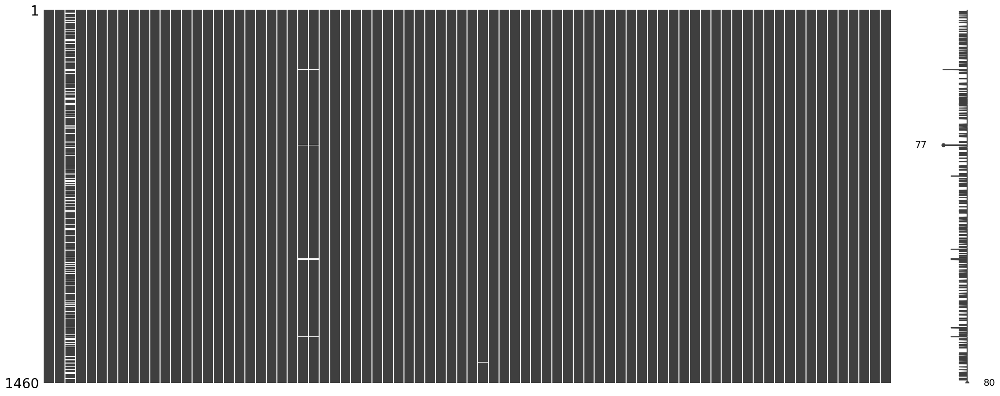

In [16]:
import missingno as msno
msno.matrix(base)

In [17]:
ncol = base.shape[0]
val = base.isna().sum()/ncol*100
val = val.sort_values(ascending=False).round(2)
val

LotFrontage     17.74
MasVnrType       0.55
MasVnrArea       0.55
Electrical       0.07
KitchenAbvGr     0.00
                ...  
ExterCond        0.00
ExterQual        0.00
Exterior2nd      0.00
Exterior1st      0.00
SalePrice        0.00
Length: 80, dtype: float64

In [18]:
result = base.loc[base['LotFrontage'].isna()]
print(result)

     MSSubClass MSZoning  LotFrontage  LotArea Street            Alley  \
7            60       RL          NaN    10382   Pave  No alley access   
12           20       RL          NaN    12968   Pave  No alley access   
14           20       RL          NaN    10920   Pave  No alley access   
16           20       RL          NaN    11241   Pave  No alley access   
24           20       RL          NaN     8246   Pave  No alley access   
...         ...      ...          ...      ...    ...              ...   
1429         20       RL          NaN    12546   Pave  No alley access   
1431        120       RL          NaN     4928   Pave  No alley access   
1441        120       RM          NaN     4426   Pave  No alley access   
1443         30       RL          NaN     8854   Pave  No alley access   
1446         20       RL          NaN    26142   Pave  No alley access   

     LotShape LandContour Utilities LotConfig LandSlope Neighborhood  \
7         IR1         Lvl    AllPub    

## VALEURS ABERRANTES

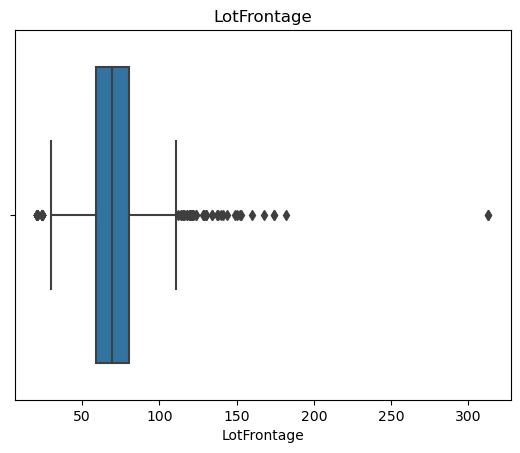

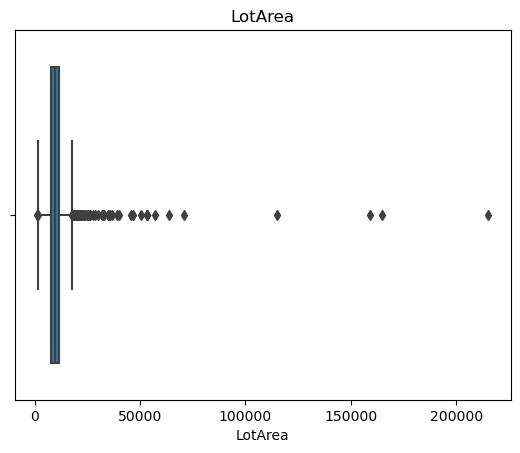

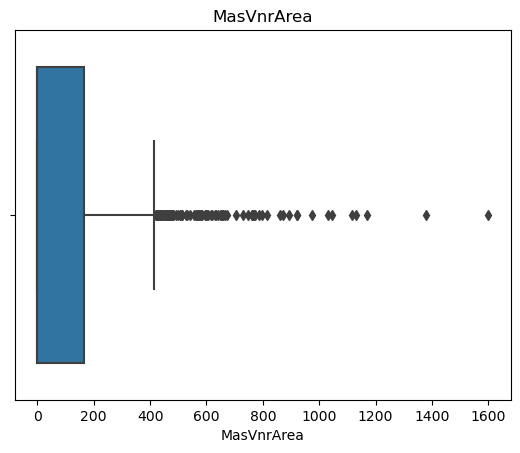

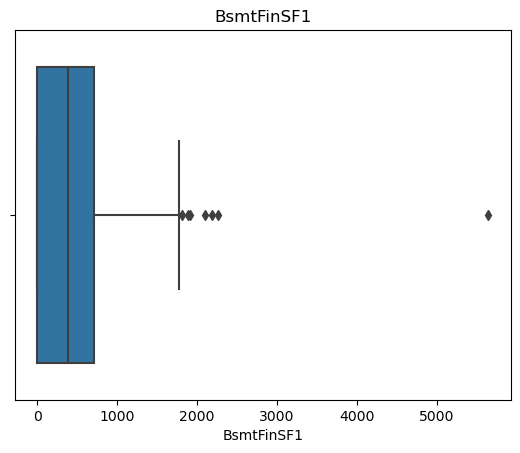

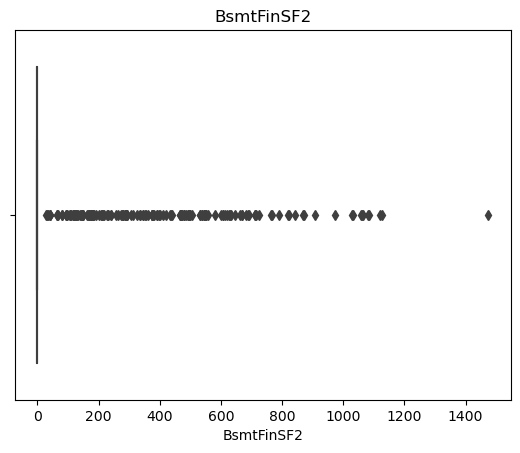

...

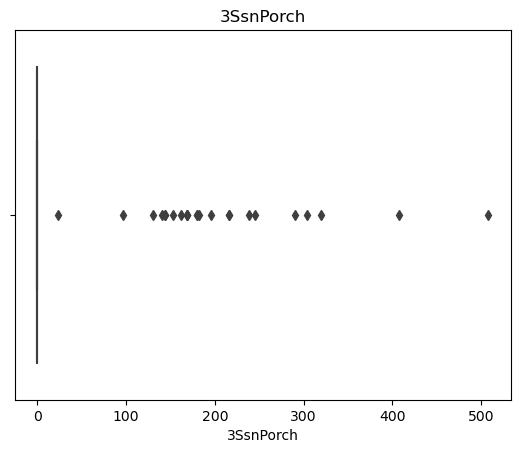

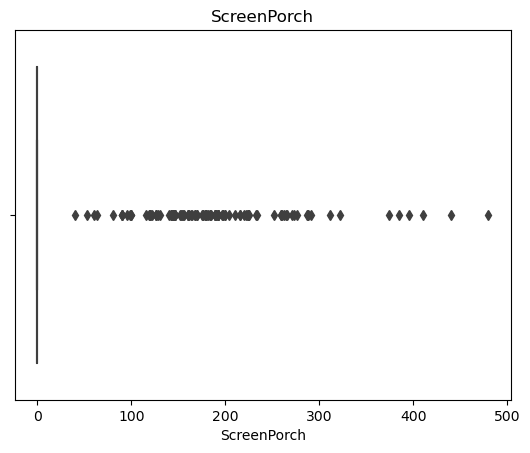

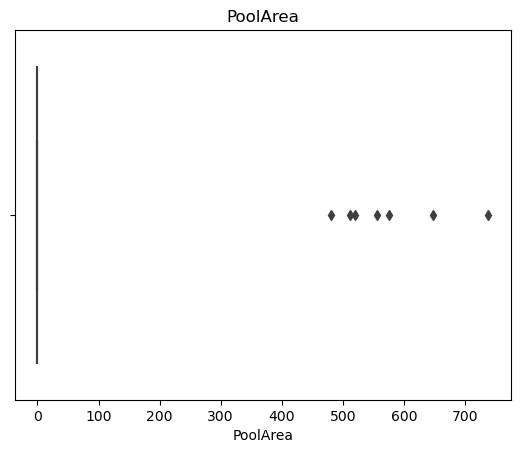

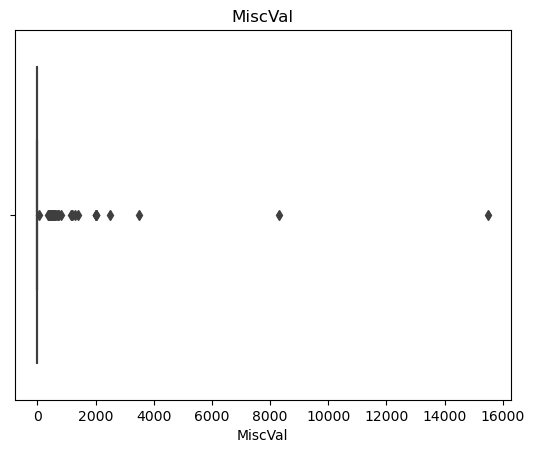

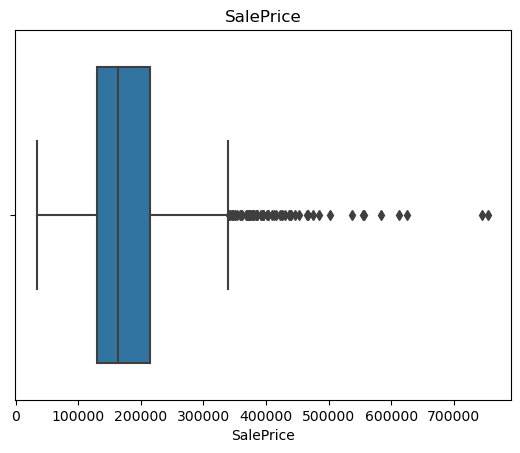

In [19]:
numerical_features = base.select_dtypes(include="number").columns
for i, column in enumerate(numerical_features):
    sns.boxplot(base[column])
    plt.title(column)
    plt.show()

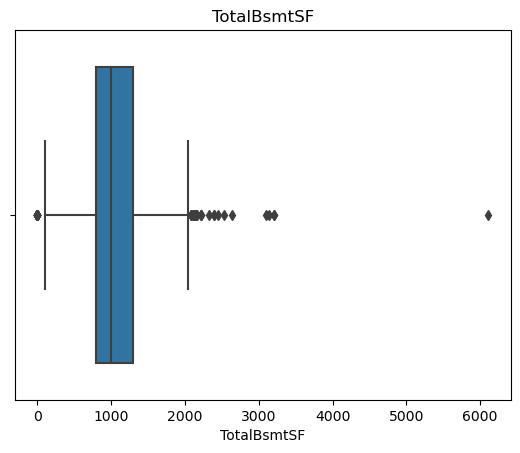

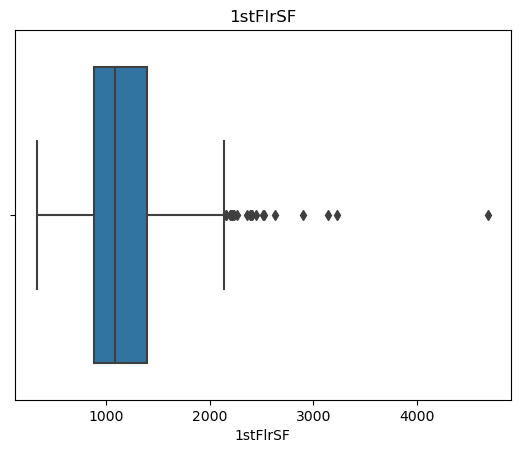

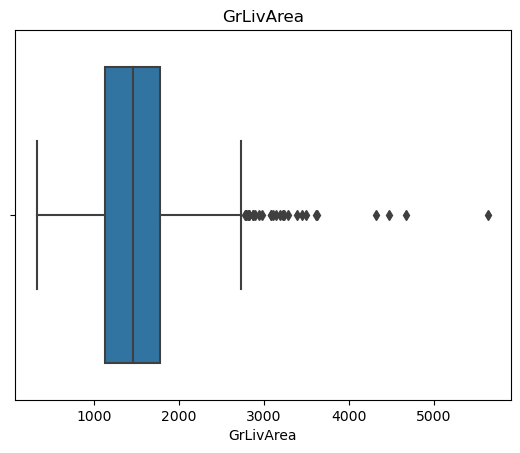

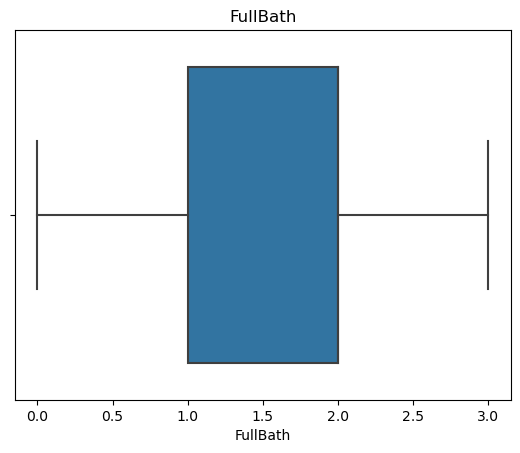

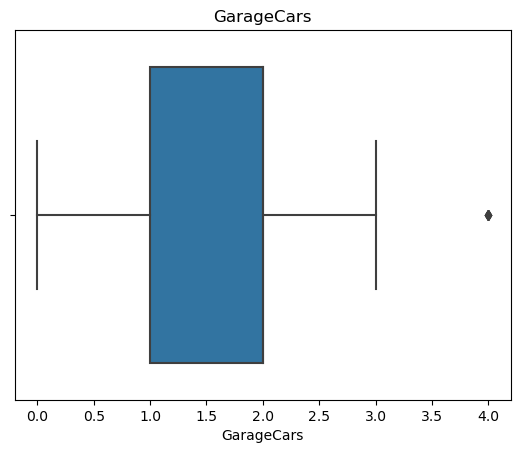

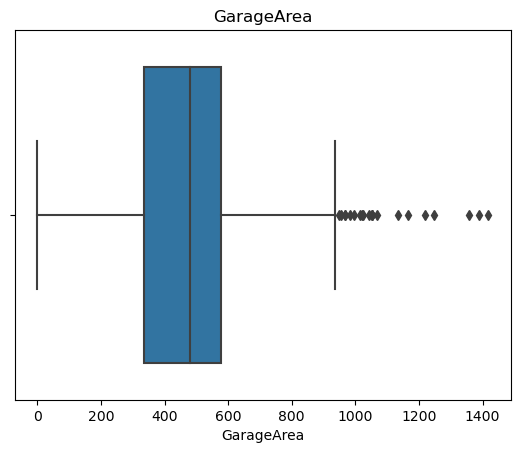

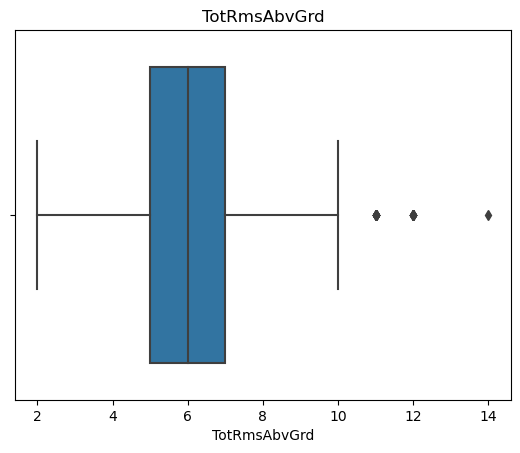

In [21]:
important_features = base.loc[:, ['TotalBsmtSF', '1stFlrSF', 'GrLivArea', 'FullBath','GarageCars','GarageArea','TotRmsAbvGrd']].columns
for i, column in enumerate(important_features):
    sns.boxplot(base[column])
    plt.title(column)
    plt.show()

In [23]:
base['SalePrice'].describe()
important_features = base.loc[:, ['TotalBsmtSF', '1stFlrSF', 'GrLivArea', 'FullBath','GarageCars','GarageArea','TotRmsAbvGrd']].columns
for i, column in enumerate(important_features):
    vue = base.loc[:, [column,'SalePrice']]
    vue =  vue.sort_values(by=column, ascending=False)
    print(vue.head(20))

      TotalBsmtSF  SalePrice
1298         6110     160000
332          3206     284000
496          3200     430000
523          3138     184750
440          3094     555000
1373         2633     466500
1044         2524     278000
691          2444     755000
1182         2396     745000
224          2392     386250
898          2330     611657
70           2223     244000
888          2217     268000
178          2216     501837
1205         2158     271900
477          2153     380000
313          2136     375000
1223         2136     137900
278          2121     415298
1250         2110     244000
      1stFlrSF  SalePrice
1298      4692     160000
496       3228     430000
523       3138     184750
1024      2898     287000
1373      2633     466500
1044      2524     278000
529       2515     200624
691       2444     755000
1182      2411     745000
440       2402     555000
224       2392     386250
898       2364     611657
113       2259     217000
178       2234     501837
7

## CREATIONS DE VARIABLES

In [27]:
base.loc[:, 'PartBsmtUnfSF'] = base['BsmtUnfSF']/base['TotalBsmtSF']*100
base.loc[:, ['PartBsmtUnfSF','BsmtUnfSF','TotalBsmtSF']] 

,PartBsmtUnfSF,BsmtUnfSF,TotalBsmtSF
0,17.523364,150,856
1,22.503962,284,1262
2,47.173913,434,920
3,71.428571,540,756
4,42.794760,490,1145
...,...,...,...
1455,100.000000,953,953
1456,38.197147,589,1542
1457,76.128472,877,1152
1458,0.000000,0,1078


In [29]:
YrSold = base['YrSold'].astype(int)
YrBuilt= base['YearBuilt'].astype(int)
base.loc[:, 'Age'] =  YrSold - YrBuilt

In [30]:
GarageYrBlt= pd.to_numeric(base['GarageYrBlt'], errors='coerce')
base.loc[:, 'Age_GarageYrBlt'] =  YrSold - GarageYrBlt
base['Age_GarageYrBlt']

0        5.0
1       31.0
2        7.0
3        8.0
4        8.0
        ... 
1455     8.0
1456    32.0
1457    69.0
1458    60.0
1459    43.0
Name: Age_GarageYrBlt, Length: 1460, dtype: float64

In [31]:
X = base.drop(['SalePrice','BsmtUnfSF','YrSold','YearBuilt', 'YearRemodAdd','GarageYrBlt'], axis=1)

In [32]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 77 columns):
 #   Column           Non-Null Count  Dtype   
---  ------           --------------  -----   
 0   MSSubClass       1460 non-null   category
 1   MSZoning         1460 non-null   category
 2   LotFrontage      1201 non-null   float64 
 3   LotArea          1460 non-null   int64   
 4   Street           1460 non-null   category
 5   Alley            1460 non-null   category
 6   LotShape         1460 non-null   category
 7   LandContour      1460 non-null   category
 8   Utilities        1460 non-null   category
 9   LotConfig        1460 non-null   category
 10  LandSlope        1460 non-null   category
 11  Neighborhood     1460 non-null   category
 12  Condition1       1460 non-null   category
 13  Condition2       1460 non-null   category
 14  BldgType         1460 non-null   category
 15  HouseStyle       1460 non-null   category
 16  OverallQual      1460 non-null   category


In [33]:
Y = base["SalePrice"]
Y

0       208500
1       181500
2       223500
3       140000
4       250000
         ...  
1455    175000
1456    210000
1457    266500
1458    142125
1459    147500
Name: SalePrice, Length: 1460, dtype: int64

In [34]:
categorical_features = X.select_dtypes(include="category").columns
print(f"Categorical features:\n {categorical_features}\n")

numerical_features = X.select_dtypes(include="number").columns
print(f"Numerical features:\n {numerical_features}")

Categorical features:
 Index(['MSSubClass', 'MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour',
       'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1',
       'Condition2', 'BldgType', 'HouseStyle', 'OverallQual', 'OverallCond',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond',
       'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC',
       'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'FireplaceQu',
       'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive',
       'PoolQC', 'Fence', 'MiscFeature', 'MoSold', 'SaleType',
       'SaleCondition'],
      dtype='object')

Numerical features:
 Index(['LotFrontage', 'LotArea', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2',
       'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea',
       'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr',


In [35]:
X_num = X.select_dtypes(include="number")
X_cat = X.select_dtypes(include="category")

# DATA EXPLORATION

## DATA SUMMARY

In [36]:
Y.describe().astype(int)

count      1460
mean     180921
std       79442
min       34900
25%      129975
50%      163000
75%      214000
max      755000
Name: SalePrice, dtype: int32

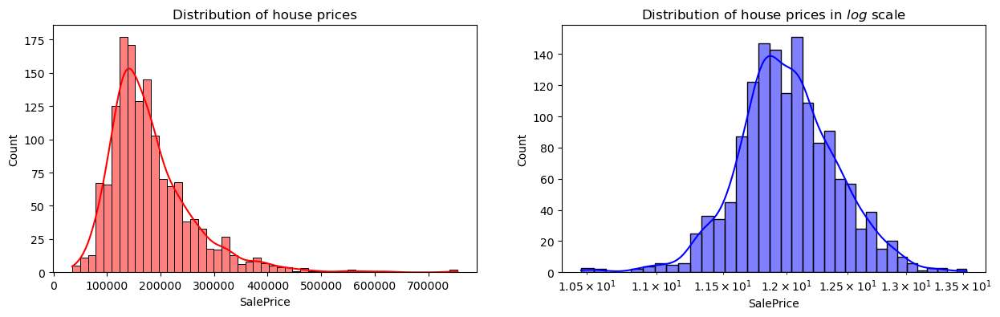

In [37]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 4))

sns.histplot(Y, color='r', kde=True, ax=axes[0])
axes[0].set_title('Distribution of house prices')

log_Y = np.log(Y)
sns.histplot(log_Y, color='b', kde=True, ax=axes[1])
axes[1].set_title('Distribution of house prices in $log$ scale')
axes[1].set_xscale('log');

In [38]:
categorical_features = X.select_dtypes(include="category").columns
print(f"Categorical features:\n {categorical_features}\n")

numerical_features = X.select_dtypes(include="number").columns
print(f"Numerical features:\n {numerical_features}")

Categorical features:
 Index(['MSSubClass', 'MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour',
       'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1',
       'Condition2', 'BldgType', 'HouseStyle', 'OverallQual', 'OverallCond',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond',
       'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC',
       'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'FireplaceQu',
       'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive',
       'PoolQC', 'Fence', 'MiscFeature', 'MoSold', 'SaleType',
       'SaleCondition'],
      dtype='object')

Numerical features:
 Index(['LotFrontage', 'LotArea', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2',
       'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea',
       'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr',


IndexError: index 46 is out of bounds for axis 0 with size 46

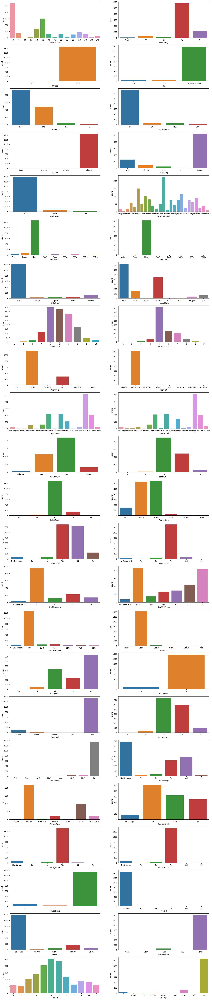

In [39]:
ncols=2
nrows=len(categorical_features)//ncols

fig,axes=plt.subplots(nrows=nrows,ncols=ncols,figsize=(20,100))
axes=axes.ravel()

for i, col_name in enumerate(categorical_features):
        ax=axes[i]
        sns.countplot(data=X,x=col_name,ax=ax)

## FEATURE SELECTION

### VARIABLES QUALITATIVES

In [ ]:
warnings.filterwarnings("ignore")
fig, axes=plt.subplots(nrows=nrows,ncols=ncols,figsize=(18,100))
axes=axes.ravel()

for i, col_name in enumerate(categorical_features):
    ax=axes[i]
    sns.violinplot(x=col_name,y=log_Y,data=base,ax=ax)

#### COMMENTAIRE GRAPHIQUE

Les graphes ci-dessus permettent de voir les variables liées à celle d'intérêt. On peut deja relever que le prix varie en fonction des modalités de la plupart des variables. Toutefois, la différence semble moins significative pour certaines variables (MSSubclass : Identifies the type of dwelling involved in the sale ; Lotshape, LotConfig : Lot configuration ; Landshope :  Slope of property, Mosold : Month sold). L'analyse de la variance va nous permettre de confirmer nos hypothèses quant à l'influence des variables. 

In [40]:
## CHI2
import itertools
from scipy.stats import chi2_contingency
from  pandas.plotting import scatter_matrix

XX= X.select_dtypes(include='category')
test_chi2 = pd.DataFrame(np.nan, index=[0], columns=['testv1','testv2','chi2','p-value'])
# Get the chi-squared test for all pairs of variables in the DataFrame
for var1, var2 in itertools.combinations(XX.columns, 2):
    ct = pd.crosstab(index=XX[var1], columns=XX[var2])
    chi2, p, dof, expected = chi2_contingency(ct)
    new_observation = {'testv1' : var1,'testv2': var2, 'chi2': chi2, 'p-value': p}
    test_chi2  = test_chi2.append(new_observation, ignore_index=True)
test_chi2 = test_chi2.sort_values(by='chi2',ascending = False)

In [42]:
test_chi2
test_chi2[test_chi2['chi2'] > 1000]

,testv1,testv2,chi2,p-value
676,Exterior1st,Exterior2nd,11868.678367,0.000000e+00
13,MSSubClass,HouseStyle,7411.613589,0.000000e+00
12,MSSubClass,BldgType,4683.575446,0.000000e+00
1046,GarageQual,GarageCond,3633.062233,0.000000e+00
9,MSSubClass,Neighborhood,3163.901347,0.000000e+00
388,Neighborhood,Exterior2nd,2543.991276,0.000000e+00
54,MSZoning,Neighborhood,2486.263988,0.000000e+00
1027,GarageType,GarageFinish,2068.542276,0.000000e+00
387,Neighborhood,Exterior1st,2020.339424,8.393905e-238
831,BsmtQual,BsmtFinType1,1960.385538,0.000000e+00


In [44]:
## ANOVA
warnings.filterwarnings("ignore")
import pandas as pd
import statsmodels.api as sm
from statsmodels.formula.api import ols

XX= X.select_dtypes(include='category')
anova = pd.DataFrame(np.nan, index=[0], columns=['var','F','p-value'])
for group in XX.columns :
    # Perform ANOVA
    groupe = base[group]
    model = ols('Y ~ groupe', base).fit()
    aov_table = sm.stats.anova_lm(model, typ=2)
    p_value = aov_table['PR(>F)'][0]
    new_observation = {'var' : group ,'F': aov_table['F'][0], 'p-value': aov_table['PR(>F)'][0]}
    anova = anova.append(new_observation, ignore_index=True)
anova.sort_values(by = 'F',ascending = False)

,var,F,p-value
22,ExterQual,3947.369163,0.000000e+00
7,Utilities,3784.463282,0.000000e+00
34,KitchenQual,3782.427154,0.000000e+00
35,Functional,1098.833886,0.000000e+00
15,OverallQual,349.026840,0.000000e+00
25,BsmtQual,316.148635,8.158548e-196
38,GarageFinish,213.867028,6.228747e-115
36,FireplaceQu,121.075121,2.971217e-107
21,MasVnrType,111.672380,4.793331e-65
24,Foundation,100.253851,5.791895e-91


#### COMMENTAIRE ANOVA
On peut déjà voir les variables qui sont plus liées à la variable d'intérêt : ExterQual, Utilities, KitchenQual, Functional, Overallqual. De plus, le mois de vente et la pente du terrain n'influe pas vraiment sur le prix.

### VARIABLES QUANTITATIVES

In [48]:
## CORRELATIONS
## pair plot
base_num= base.select_dtypes(include='number')
sns.pairplot(base_num, corner=True, diag_kind="kde");

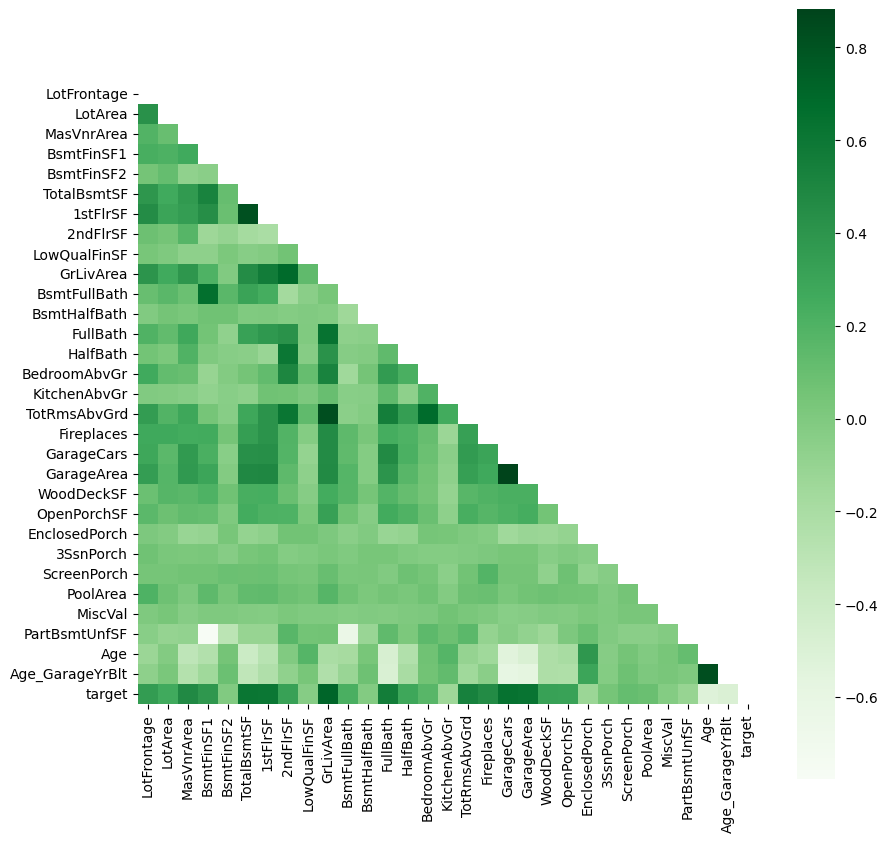

In [49]:
# correlation plot
XXX= X.select_dtypes(include='number')
plt.figure(figsize=(10, 10))
corr = XXX.assign(target=Y).corr()
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True
sns.heatmap(corr, cmap='Greens', square=True, mask=mask, cbar=True, vmin=None, vmax=None);

In [50]:
corr = corr.sort_values(by = 'target', ascending = False)
corr.loc[:,'variable'] = corr.index.values
corr.loc[:,['target','variable']]

,target,variable
target,1.000000,target
GrLivArea,0.708624,GrLivArea
GarageCars,0.640409,GarageCars
GarageArea,0.623431,GarageArea
TotalBsmtSF,0.613581,TotalBsmtSF
1stFlrSF,0.605852,1stFlrSF
FullBath,0.560664,FullBath
TotRmsAbvGrd,0.533723,TotRmsAbvGrd
MasVnrArea,0.477493,MasVnrArea
Fireplaces,0.466929,Fireplaces


### COMMENTAIRES
A partir du corrplot, nous pouvons aussi identifier les variables quantitatives les plus liées à notre cible. Il s'agit de TotalBsmtSF, 1sFlrSf, GrlivArea, Fullbath,GarageCars,GarageArea et TotRmsAbvGr. Il sagit surtout de surfaces, du nombre de toilettes, de garages et de chambres.

## CONCLUSIONS : FEATURES UTILISES POUR LES FILTER METHOD

Nous allons garder les variables quantitatives et qualitatives qui ont une influence plus importante sur le prix des maisons. Nous nous baserons pour cela sur les résultats de l'analyse de la variance et de la matrice de correlation.

In [51]:
FiltX_quant = corr[abs(corr['target'])>0.5]
FiltX_quant = FiltX_quant[FiltX_quant['target']<1]
FiltX_quant
var_quant =  list(FiltX_quant["variable"])
var_quant

['GrLivArea',
 'GarageCars',
 'GarageArea',
 'TotalBsmtSF',
 '1stFlrSF',
 'FullBath',
 'TotRmsAbvGrd',
 'Age']

In [52]:
anova = anova[anova['p-value'].notnull()]
anova = anova.sort_values(by = 'p-value', ascending = True)
anova

,var,F,p-value
35,Functional,1098.833886,0.000000e+00
34,KitchenQual,3782.427154,0.000000e+00
7,Utilities,3784.463282,0.000000e+00
22,ExterQual,3947.369163,0.000000e+00
15,OverallQual,349.026840,0.000000e+00
10,Neighborhood,71.784865,1.558600e-225
25,BsmtQual,316.148635,8.158548e-196
38,GarageFinish,213.867028,6.228747e-115
36,FireplaceQu,121.075121,2.971217e-107
24,Foundation,100.253851,5.791895e-91


In [53]:
FiltX_qual = anova[anova['p-value']<0.05]
FiltX_qual
var_qual=  list(FiltX_qual["var"])
var_qual

['Functional',
 'KitchenQual',
 'Utilities',
 'ExterQual',
 'OverallQual',
 'Neighborhood',
 'BsmtQual',
 'GarageFinish',
 'FireplaceQu',
 'Foundation',
 'GarageType',
 'MSSubClass',
 'BsmtFinType1',
 'HeatingQC',
 'MasVnrType',
 'BsmtExposure',
 'SaleCondition',
 'Exterior1st',
 'Exterior2nd',
 'SaleType',
 'OverallCond',
 'MSZoning',
 'HouseStyle',
 'GarageQual',
 'GarageCond',
 'LotShape',
 'CentralAir',
 'Electrical',
 'PavedDrive',
 'RoofStyle',
 'BsmtCond',
 'Fence',
 'BldgType',
 'LandContour',
 'BsmtFinType2',
 'RoofMatl',
 'Condition1',
 'Alley',
 'ExterCond',
 'PoolQC',
 'LotConfig',
 'Heating',
 'MiscFeature',
 'Condition2']

In [54]:
FiltX = var_quant+var_qual
FiltX
X_feature = X.loc[:,FiltX]
X_feature.dtypes

GrLivArea           int64
GarageCars          int64
GarageArea          int64
TotalBsmtSF         int64
1stFlrSF            int64
FullBath            int64
TotRmsAbvGrd        int64
Age                 int32
Functional       category
KitchenQual      category
Utilities        category
ExterQual        category
OverallQual      category
Neighborhood     category
BsmtQual         category
GarageFinish     category
FireplaceQu      category
Foundation       category
GarageType       category
MSSubClass       category
BsmtFinType1     category
HeatingQC        category
MasVnrType       category
BsmtExposure     category
SaleCondition    category
Exterior1st      category
Exterior2nd      category
SaleType         category
OverallCond      category
MSZoning         category
HouseStyle       category
GarageQual       category
GarageCond       category
LotShape         category
CentralAir       category
Electrical       category
PavedDrive       category
RoofStyle        category
BsmtCond    

In [56]:
labelsfilt={'LandContour':['Lvl','Bnk','HLS','Low'],
        'Utilities':['ELO','NoSeWa','NoSeWr','AllPub'],
        'LotShape':['Reg','IR1','IR2','IR3'],
        'HouseStyle':['1Story','1.5Fin','1.5Unf','2Story','2.5Fin','2.5Unf','SFoyer','SLvl'],
        'OverallQual':[1,2,3,4,5,6,7,8,9,10],'OverallCond':[1,2,3,4,5,6,7,8,9,10],
        'ExterQual':['Po','Fa','TA','Gd','Ex'],
        'ExterCond':['Po','Fa','TA','Gd','Ex'],
        'BsmtQual':['No Basement','Po','Fa','TA','Gd','Ex'],
        'BsmtCond':['No Basement','Po','Fa','TA','Gd','Ex'],
        'BsmtExposure':['No Basement','No','Mn','Av','Gd'],
        'BsmtFinType1':['No Basement','Unf','LwQ','Rec','BLQ','ALQ','GLQ'],
        'BsmtFinType2':['No Basement','Unf','LwQ','Rec','BLQ','ALQ','GLQ'],
        'HeatingQC':['Po','Fa','TA','Gd','Ex'],
        'KitchenQual':['Po','Fa','TA','Gd','Ex'],
        'Functional':['Sal','Sev','Maj2','Maj1','Mod','Min2','Min1','Typ'],
        'FireplaceQu':['No Fireplace','Po','Fa','TA','Gd','Ex'],
        'GarageQual':['No Garage','Po','Fa','TA','Gd','Ex'],
        'GarageFinish':['No Garage','Unf','RFn','Fin'],
        'GarageCond':['No Garage','Po','Fa','TA','Gd','Ex'],
        'PavedDrive':['N','P','Y'],
        'PoolQC':['No Pool','Po','Fa','TA','Gd','Ex'],
        'Fence':['No Fence','MnWw','GdWo','MnPrv','GdPrv']
       }
nomX = X_feature.drop(columns=['LandContour','Utilities','LotShape','HouseStyle','OverallQual',
'OverallCond','ExterQual','ExterCond','BsmtQual','BsmtCond','BsmtExposure',
        'BsmtFinType1','BsmtFinType2','HeatingQC','KitchenQual','Functional',
        'FireplaceQu','GarageQual','GarageFinish','GarageCond','PavedDrive','PoolQC','Fence'])
nomX = nomX.select_dtypes(include="category")
ordX= X_feature.loc[:, ['LandContour','Utilities','LotShape','HouseStyle','OverallQual','OverallCond','ExterQual','ExterCond','BsmtQual','BsmtCond','BsmtExposure','BsmtFinType1','BsmtFinType2','HeatingQC','KitchenQual','Functional','FireplaceQu','GarageQual','GarageFinish','GarageCond','PavedDrive','PoolQC','Fence']]

# MODELE LINEAIRE 

## UN PREMIER MODELE SANS SELECTION

### DATA PROCESSING

In [156]:
# variables nominales
nom_X = X.drop(columns=['LandContour','Utilities','LandSlope','LotShape','HouseStyle','OverallQual','OverallCond','ExterQual','ExterCond','BsmtQual','BsmtCond','BsmtExposure',
        'BsmtFinType1','BsmtFinType2','HeatingQC','KitchenQual','Functional','FireplaceQu','GarageQual','GarageFinish','GarageCond','PavedDrive','PoolQC','Fence'])
nom_X = nom_X.select_dtypes(include="category")

In [157]:
# variables ordinales 
ord_X= X.loc[:, ['LandContour','Utilities','LandSlope','LotShape','HouseStyle','OverallQual','OverallCond','ExterQual','ExterCond','BsmtQual','BsmtCond','BsmtExposure',
        'BsmtFinType1','BsmtFinType2','HeatingQC','KitchenQual','Functional','FireplaceQu','GarageQual','GarageFinish','GarageCond','PavedDrive','PoolQC','Fence']]

In [158]:
ord_categories = list(labels.values())
numeric_transformer = Pipeline(steps=[("imputer", SimpleImputer(strategy="median")),
                                      ("scaler", StandardScaler())]
                              )

nominal_transformer = Pipeline(steps=[("imputer2", SimpleImputer(strategy="constant", fill_value="missing")),
                                          ("OHE", OneHotEncoder(handle_unknown="ignore"))]
                                       )
ordinal_transformer = Pipeline(steps=[("imputer3", SimpleImputer(strategy="constant")),
                                         ("OE",OrdinalEncoder(categories = ord_categories, handle_unknown='error'))]
                                       )

preprocessor = ColumnTransformer(
    transformers=[
        ("num", numeric_transformer, numerical_features),
        ("cat_nom", nominal_transformer, nom_X.columns),
        ("cat_ord", ordinal_transformer, ord_X.columns),
    ]
)

# Append regressor to preprocessing pipeline.
# Now we have a full prediction pipeline.
reg = Pipeline(
    steps=[("preprocessor", preprocessor), ("regressor", LinearRegression())]
)
reg

Pipeline(memory=None,
         steps=[('preprocessor',
                 ColumnTransformer(n_jobs=None, remainder='drop',
                                   sparse_threshold=0.3,
                                   transformer_weights=None,
                                   transformers=[('num',
                                                  Pipeline(memory=None,
                                                           steps=[('imputer',
                                                                   SimpleImputer(add_indicator=False,
                                                                                 copy=True,
                                                                                 fill_value=None,
                                                                                 keep_empty_features=False,
                                                                                 missing_values=nan,
                                                                                 strategy='median',
                                                                                 verbose='deprecated')),
                                                                  ('scale...
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'HeatingQC',
       'KitchenQual', 'Functional', 'FireplaceQu', 'GarageQual',
       'GarageFinish', 'GarageCond', 'PavedDrive', 'PoolQC', 'Fence'],
      dtype='object'))],
                                   verbose=False,
                                   verbose_feature_names_out=True)),
                ('regressor',
                 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None,
                                  positive=False))],
         verbose=False)

### Fitting

In [159]:
X_train, X_test, y_train, y_test = train_test_split(X, log_Y, test_size=0.25, random_state=23)

In [160]:
reg.fit(X_train, y_train)

Pipeline(memory=None,
         steps=[('preprocessor',
                 ColumnTransformer(n_jobs=None, remainder='drop',
                                   sparse_threshold=0.3,
                                   transformer_weights=None,
                                   transformers=[('num',
                                                  Pipeline(memory=None,
                                                           steps=[('imputer',
                                                                   SimpleImputer(add_indicator=False,
                                                                                 copy=True,
                                                                                 fill_value=None,
                                                                                 keep_empty_features=False,
                                                                                 missing_values=nan,
                                                                                 strategy='median',
                                                                                 verbose='deprecated')),
                                                                  ('scale...
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'HeatingQC',
       'KitchenQual', 'Functional', 'FireplaceQu', 'GarageQual',
       'GarageFinish', 'GarageCond', 'PavedDrive', 'PoolQC', 'Fence'],
      dtype='object'))],
                                   verbose=False,
                                   verbose_feature_names_out=True)),
                ('regressor',
                 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None,
                                  positive=False))],
         verbose=False)

### Model evaluation

In [161]:
# sklearn regression module
y_test_pred = reg.predict(X_test)
y_train_pred = reg.predict(X_train)

In [162]:
def get_performances(real_value, estimated_value, metrics):
    perfs = []
    for metric_func in metrics:
        perfs.append((metric_func.__name__, metric_func(real_value, estimated_value)))
    return pd.DataFrame(perfs, columns=["metric", "value"])


def get_all_performances(value_train, values_test, metrics):
    test_perfs = []
    train_perfs = []
    metric_names = []
    for metric_func in metrics:
        metric_name = metric_func.__name__
        metric_names.append(metric_name)
        train_perfs.append(metric_func(*value_train))
        test_perfs.append(metric_func(*values_test))
    perfs = {"metric": metric_names, "train": train_perfs, "test": test_perfs,}
    return pd.DataFrame(perfs)

In [163]:
def RMSE(predictions, targets):
    return np.sqrt(np.mean((predictions - targets) ** 2))

METRICS = [r2_score,
           mean_squared_error,
           RMSE,
           mean_absolute_percentage_error,
           max_error,
          ]

In [164]:
# get performances in train & test
get_all_performances(value_train=(y_train, y_train_pred),
                     values_test=(y_test, y_test_pred),
                     metrics=METRICS
                    )

,metric,train,test
0,r2_score,0.938061,0.875852
1,mean_squared_error,0.009962,0.019262
2,RMSE,0.099809,0.138786
3,mean_absolute_percentage_error,0.005942,0.008177
4,max_error,0.656628,0.709821


In [73]:
def courbe(y_train, y_test, y_test_pred,y_train_pred):  
    fig,ax=plt.subplots(ncols=4,figsize=(16,4))

    # Train set: actual values vs. predictions
    ax[0].scatter(y_train,y_train_pred)
    ax[0].set_title('Actual values vs. predictions')
    a, b = np.polyfit(y_train_pred, y_train, 1)
    line = a * y_train_pred + b
    ax[0].plot(y_train_pred, line, color='red', lw=3)

    # Train set: residuals vs. predictions
    residuals = y_train - y_train_pred
    ax[1].scatter(y_train_pred,residuals)
    ax[1].set_title('Residuals vs. predictions')
    a, b = np.polyfit(y_train_pred, residuals, 1)
    line = a * y_train_pred + b
    ax[1].plot(y_train_pred, line, color='red', lw=3)

    if y_test is not None and y_test_pred is not None:
        # Test set: actual values vs. predictions
        ax[2].scatter(y_test,y_test_pred,color='orange')
        ax[2].set_title('Actual values vs. predictions')
        a, b = np.polyfit(y_test_pred, y_test, 1)
        line = a * y_test_pred + b
        ax[2].plot(y_test_pred, line, color='red', lw=3)

        # Test set: residuals vs. predictions
        residuals = y_test - y_test_pred
        ax[3].scatter(y_test_pred,residuals,color='orange')
        ax[3].set_title('Residuals vs. predictions')
        a, b = np.polyfit(y_test_pred, residuals, 1)
        line = a * y_test_pred + b
        ax[3].plot(y_test_pred, line, color='red', lw=3)

    fig.suptitle('Train set' if y_test is None or y_test_pred is None else 'Test set')

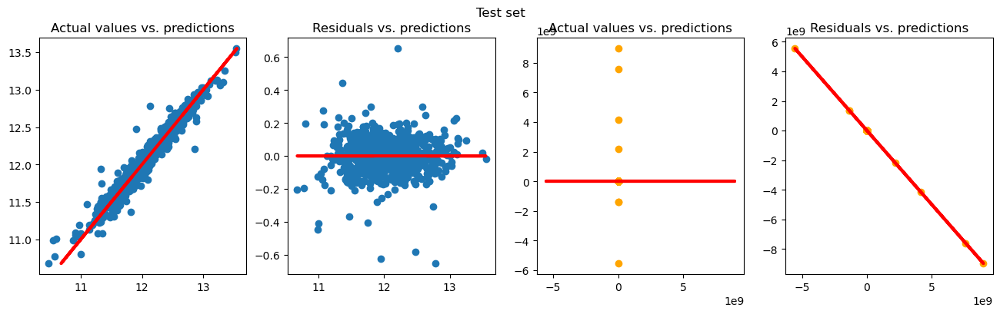

In [74]:
courbe(y_train, y_test, y_test_pred,y_train_pred)

Le modele produit de bons résultats sur le train set mais de mauvais sur le test set, nous sommes donc dans un cas de overfitting. Nous allons réduire la complexité du modèle avec une sélection de variables les plus pertinentes.

### Model validation

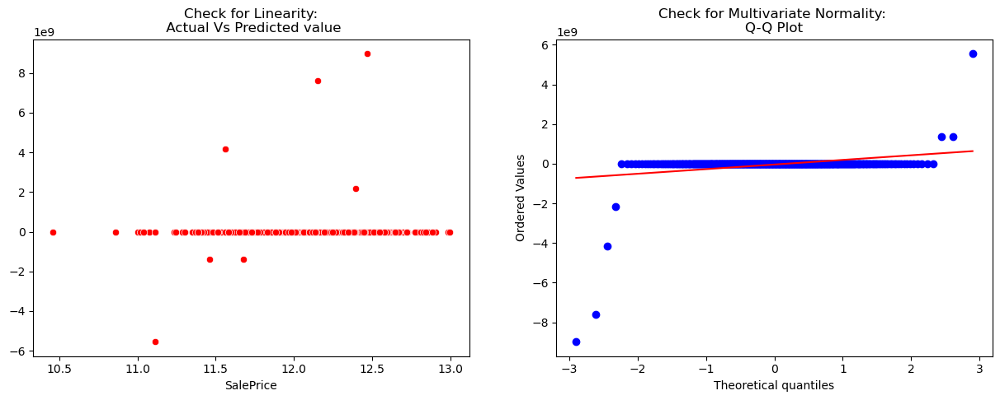

In [75]:
# Check for Linearity
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))
ax = axes[0]
g = sns.scatterplot(x=y_test, y=y_test_pred, ax=ax, color='r')
ax.set_title('Check for Linearity:\n Actual Vs Predicted value')

# Check for Residual normality & mean
ax = axes[1]
residus = y_test - y_test_pred
_, (_, _, r)= sp.stats.probplot(residus, fit=True,plot=ax)
ax.set_title('Check for Multivariate Normality: \nQ-Q Plot');

In [76]:
# Check for Multicollinearity
# Variance Inflation Factor (VIF)
R_square_test = mean_squared_error(y_test, y_test_pred, squared=True)
VIF = 1/(1- R_square_test)
VIF

-1.872011222540931e-18

##  MODELE LINEAIRE  : SELECT FROM MODEL

### Preprocessing

In [77]:
from sklearn.feature_selection import SelectFromModel
from sklearn.preprocessing import OrdinalEncoder

ord_categories =list(labels.values())
numerical_features = X.select_dtypes(include = 'number').columns
numeric_transformer = Pipeline(steps=[("imputer", SimpleImputer(strategy="median")),
                                      ("scaler", StandardScaler())]
                              )

nominal_transformer = Pipeline(steps = [("imputer2",SimpleImputer(strategy="constant")),
                                         ("OHE", OneHotEncoder(handle_unknown="ignore"))]
                                       )
ordinal_transformer = Pipeline(steps = [("imputer3",SimpleImputer(strategy="constant")),
                                          ("OE",OrdinalEncoder(categories = ord_categories, handle_unknown='error'))]
                                       )
categorical_pipeline = Pipeline([
    ("imputer", SimpleImputer(strategy="most_frequent")),
    ("encoder", OneHotEncoder(sparse=True, handle_unknown="ignore"))
])
preprocessor = ColumnTransformer(
    transformers=[
        ("num", numeric_transformer, numerical_features),
        ("cat_nom", nominal_transformer, nom_X.columns),
        ("cat_ord", ordinal_transformer, ord_X.columns),
    ]
)

# Now we have a full prediction pipeline.
reg = Pipeline(
    steps=[("preprocessor", preprocessor), ('feature_selection', SelectFromModel(LinearRegression(),threshold=2)),("regressor", LinearRegression())]
)
reg


Pipeline(memory=None,
         steps=[('preprocessor',
                 ColumnTransformer(n_jobs=None, remainder='drop',
                                   sparse_threshold=0.3,
                                   transformer_weights=None,
                                   transformers=[('num',
                                                  Pipeline(memory=None,
                                                           steps=[('imputer',
                                                                   SimpleImputer(add_indicator=False,
                                                                                 copy=True,
                                                                                 fill_value=None,
                                                                                 keep_empty_features=False,
                                                                                 missing_values=nan,
                                                                                 strategy='median',
                                                                                 verbose='deprecated')),
                                                                  ('scale...
                                   verbose=False,
                                   verbose_feature_names_out=True)),
                ('feature_selection',
                 SelectFromModel(estimator=LinearRegression(copy_X=True,
                                                            fit_intercept=True,
                                                            n_jobs=None,
                                                            positive=False),
                                 importance_getter='auto', max_features=None,
                                 norm_order=1, prefit=False, threshold=2)),
                ('regressor',
                 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None,
                                  positive=False))],
         verbose=False)

### Fitting

In [78]:
X_train, X_test, y_train, y_test = train_test_split(X, log_Y, test_size=0.25, random_state=23)

In [79]:
# Fit the feature selection model to the training data
reg.fit(X_train, y_train)

Pipeline(memory=None,
         steps=[('preprocessor',
                 ColumnTransformer(n_jobs=None, remainder='drop',
                                   sparse_threshold=0.3,
                                   transformer_weights=None,
                                   transformers=[('num',
                                                  Pipeline(memory=None,
                                                           steps=[('imputer',
                                                                   SimpleImputer(add_indicator=False,
                                                                                 copy=True,
                                                                                 fill_value=None,
                                                                                 keep_empty_features=False,
                                                                                 missing_values=nan,
                                                                                 strategy='median',
                                                                                 verbose='deprecated')),
                                                                  ('scale...
                                   verbose=False,
                                   verbose_feature_names_out=True)),
                ('feature_selection',
                 SelectFromModel(estimator=LinearRegression(copy_X=True,
                                                            fit_intercept=True,
                                                            n_jobs=None,
                                                            positive=False),
                                 importance_getter='auto', max_features=None,
                                 norm_order=1, prefit=False, threshold=2)),
                ('regressor',
                 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None,
                                  positive=False))],
         verbose=False)

### Model evaluation

In [80]:
# sklearn regression module
y_test_pred = reg.predict(X_test)
y_train_pred = reg.predict(X_train)

In [81]:
METRICS = [r2_score,
           mean_squared_error,
           RMSE,
           mean_absolute_percentage_error,
           max_error,
          ]

In [82]:
# get performances in train & test
get_all_performances(value_train=(y_train, y_train_pred),
                     values_test=(y_test, y_test_pred),
                     metrics=METRICS
                    )

,metric,train,test
0,r2_score,0.894933,0.787282
1,mean_squared_error,0.016898,0.033003
2,RMSE,0.129993,0.181668
3,mean_absolute_percentage_error,0.008052,0.011025
4,max_error,0.644026,0.824518


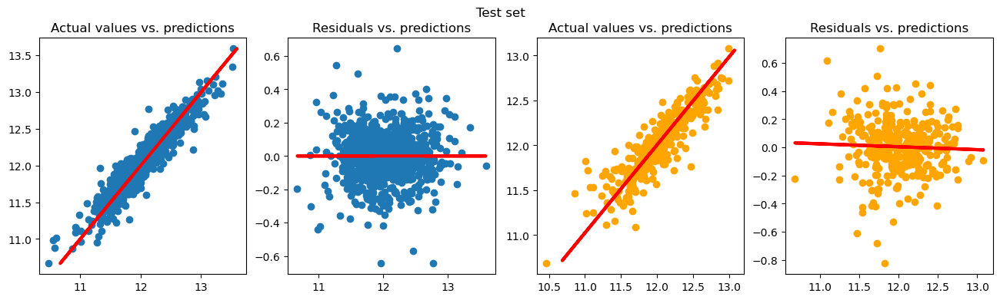

In [933]:
courbe(y_train, y_test, y_test_pred,y_train_pred)

In [83]:
# get the mask of selected features
mask = reg.named_steps['feature_selection'].get_support(indices=True)
mask
print(len(mask))

183


In [84]:
new_cols_nom = reg.named_steps["preprocessor"].named_transformers_["cat_nom"].named_steps["OHE"].get_feature_names_out(nom_X.columns)
cols_ord = ord_X.columns
all_cols = np.concatenate([numerical_features,cols_ord,new_cols_nom])
all_cols[mask]

array(['1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'LandContour',
       'Utilities', 'LandSlope', 'LotShape', 'HouseStyle', 'OverallQual',
       'OverallCond', 'ExterQual', 'ExterCond', 'BsmtQual', 'BsmtCond',
       'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'HeatingQC',
       'KitchenQual', 'Functional', 'FireplaceQu', 'GarageQual',
       'GarageFinish', 'GarageCond', 'PavedDrive', 'PoolQC', 'Fence',
       'MSSubClass_20', 'MSSubClass_30', 'MSSubClass_40', 'MSSubClass_45',
       'MSSubClass_50', 'MSSubClass_60', 'MSSubClass_70', 'MSSubClass_75',
       'MSSubClass_80', 'MSSubClass_85', 'MSSubClass_90',
       'MSSubClass_120', 'MSSubClass_160', 'MSSubClass_180',
       'MSSubClass_190', 'MSZoning_C (all)', 'MSZoning_FV', 'MSZoning_RH',
       'MSZoning_RL', 'MSZoning_RM', 'Street_Grvl', 'Street_Pave',
       'Alley_Grvl', 'Alley_No alley access', 'Alley_Pave',
       'LotConfig_Corner', 'LotConfig_CulDSac', 'LotConfig_FR2',
       'LotConfig_FR3', 'LotConfig_Insid

### Model validation

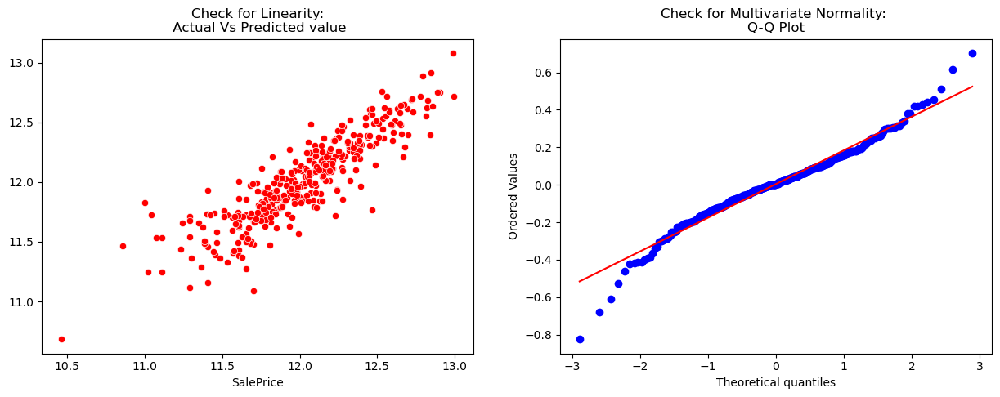

In [85]:
# Check for Linearity
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))
ax = axes[0]
g = sns.scatterplot(x=y_test, y=y_test_pred, ax=ax, color='r')
ax.set_title('Check for Linearity:\n Actual Vs Predicted value')

# Check for Residual normality & mean
ax = axes[1]
residus = y_test - y_test_pred
_, (_, _, r)= sp.stats.probplot(residus, fit=True,plot=ax)
ax.set_title('Check for Multivariate Normality: \nQ-Q Plot');

In [86]:
# Check for Multicollinearity
# Variance Inflation Factor (VIF)
R_square_test = mean_squared_error(y_test, y_test_pred, squared=True)
VIF = 1/(1- R_square_test)
VIF

1.034129521401473

##  MODELE LINEAIRE  : WRAPPER METHOD

### Preprocessing

In [87]:
from sklearn.feature_selection import RFE
from sklearn.preprocessing import OrdinalEncoder

ord_categories =list(labels.values())
numerical_features = X.select_dtypes(include = 'number').columns
numeric_transformer = Pipeline(steps=[("imputer", SimpleImputer(strategy="median")),
                                      ("scaler", StandardScaler())]
                              )

nominal_transformer = Pipeline(steps = [("imputer2",SimpleImputer(strategy="constant")),
                                         ("OHE", OneHotEncoder(handle_unknown="ignore"))]
                                       )
ordinal_transformer = Pipeline(steps = [("imputer3",SimpleImputer(strategy="constant")),
                                          ("OE",OrdinalEncoder(categories = ord_categories, handle_unknown='error'))]
                                       )
categorical_pipeline = Pipeline([
    ("imputer", SimpleImputer(strategy="most_frequent")),
    ("encoder", OneHotEncoder(sparse=True, handle_unknown="ignore"))
])
preprocessor = ColumnTransformer(
    transformers=[
        ("num", numeric_transformer, numerical_features),
        ("cat_nom", nominal_transformer, nom_X.columns),
        ("cat_ord", ordinal_transformer, ord_X.columns),
    ]
)

# Now we have a full prediction pipeline.
reg = Pipeline(
    steps=[("preprocessor", preprocessor), ('feature_selection', RFE(LinearRegression(),step=1)),("regressor", LinearRegression())]
)
reg


Pipeline(memory=None,
         steps=[('preprocessor',
                 ColumnTransformer(n_jobs=None, remainder='drop',
                                   sparse_threshold=0.3,
                                   transformer_weights=None,
                                   transformers=[('num',
                                                  Pipeline(memory=None,
                                                           steps=[('imputer',
                                                                   SimpleImputer(add_indicator=False,
                                                                                 copy=True,
                                                                                 fill_value=None,
                                                                                 keep_empty_features=False,
                                                                                 missing_values=nan,
                                                                                 strategy='median',
                                                                                 verbose='deprecated')),
                                                                  ('scale...
      dtype='object'))],
                                   verbose=False,
                                   verbose_feature_names_out=True)),
                ('feature_selection',
                 RFE(estimator=LinearRegression(copy_X=True, fit_intercept=True,
                                                n_jobs=None, positive=False),
                     importance_getter='auto', n_features_to_select=None,
                     step=1, verbose=0)),
                ('regressor',
                 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None,
                                  positive=False))],
         verbose=False)

### Fitting

In [88]:
X_train, X_test, y_train, y_test = train_test_split(X, log_Y, test_size=0.25, random_state=23)

In [89]:
# Fit the feature selection model to the training data
reg.fit(X_train, y_train)

Pipeline(memory=None,
         steps=[('preprocessor',
                 ColumnTransformer(n_jobs=None, remainder='drop',
                                   sparse_threshold=0.3,
                                   transformer_weights=None,
                                   transformers=[('num',
                                                  Pipeline(memory=None,
                                                           steps=[('imputer',
                                                                   SimpleImputer(add_indicator=False,
                                                                                 copy=True,
                                                                                 fill_value=None,
                                                                                 keep_empty_features=False,
                                                                                 missing_values=nan,
                                                                                 strategy='median',
                                                                                 verbose='deprecated')),
                                                                  ('scale...
      dtype='object'))],
                                   verbose=False,
                                   verbose_feature_names_out=True)),
                ('feature_selection',
                 RFE(estimator=LinearRegression(copy_X=True, fit_intercept=True,
                                                n_jobs=None, positive=False),
                     importance_getter='auto', n_features_to_select=None,
                     step=1, verbose=0)),
                ('regressor',
                 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None,
                                  positive=False))],
         verbose=False)

### Model evaluation

In [90]:
# sklearn regression module
y_test_pred = reg.predict(X_test)
y_train_pred = reg.predict(X_train)

In [91]:
METRICS = [r2_score,
           mean_squared_error,
           RMSE,
           mean_absolute_percentage_error,
           max_error,
          ]

In [92]:
# get performances in train & test
get_all_performances(value_train=(y_train, y_train_pred),
                     values_test=(y_test, y_test_pred),
                     metrics=METRICS
                    )

,metric,train,test
0,r2_score,0.765940,0.676245
1,mean_squared_error,0.037644,0.050231
2,RMSE,0.194021,0.224122
3,mean_absolute_percentage_error,0.011832,0.014536
4,max_error,0.863326,0.766001


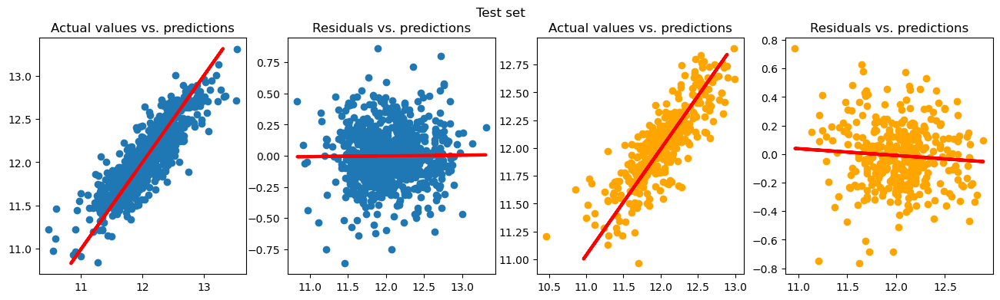

In [93]:
courbe(y_train, y_test, y_test_pred,y_train_pred)

In [94]:
# get the mask of selected features
mask = reg.named_steps['feature_selection'].get_support(indices=True)
mask

array([ 55,  56,  57,  58,  59,  60,  61,  62,  63,  64,  66,  67,  68,
        69,  70,  71,  72,  73,  75,  76,  77,  79,  80,  81,  82,  83,
        84,  85,  86,  87,  88,  92,  93,  94,  96,  97,  98,  99, 100,
       101, 102, 103, 104, 106, 107, 109, 110, 111, 112, 113, 114, 115,
       116, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 130,
       131, 132, 133, 134, 135, 137, 138, 139, 141, 142, 143, 145, 146,
       147, 148, 149, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162,
       165, 166, 167, 168, 169, 171, 173, 174, 176, 177, 179, 181, 194,
       195, 196, 197, 198, 199, 200, 201, 202, 203, 205, 207, 208],
      dtype=int64)

In [95]:
new_cols_nom = reg.named_steps["preprocessor"].named_transformers_["cat_nom"].named_steps["OHE"].get_feature_names_out(nom_X.columns)
cols_ord = ord_X.columns
all_cols = np.concatenate([numerical_features,cols_ord,new_cols_nom])
all_cols[mask]

array(['MSSubClass_30', 'MSSubClass_40', 'MSSubClass_45', 'MSSubClass_50',
       'MSSubClass_60', 'MSSubClass_70', 'MSSubClass_75', 'MSSubClass_80',
       'MSSubClass_85', 'MSSubClass_90', 'MSSubClass_160',
       'MSSubClass_180', 'MSSubClass_190', 'MSZoning_C (all)',
       'MSZoning_FV', 'MSZoning_RH', 'MSZoning_RL', 'MSZoning_RM',
       'Street_Pave', 'Alley_Grvl', 'Alley_No alley access',
       'LotConfig_Corner', 'LotConfig_CulDSac', 'LotConfig_FR2',
       'LotConfig_FR3', 'LotConfig_Inside', 'Neighborhood_Blmngtn',
       'Neighborhood_Blueste', 'Neighborhood_BrDale',
       'Neighborhood_BrkSide', 'Neighborhood_ClearCr',
       'Neighborhood_Gilbert', 'Neighborhood_IDOTRR',
       'Neighborhood_MeadowV', 'Neighborhood_NAmes',
       'Neighborhood_NPkVill', 'Neighborhood_NWAmes',
       'Neighborhood_NoRidge', 'Neighborhood_NridgHt',
       'Neighborhood_OldTown', 'Neighborhood_SWISU',
       'Neighborhood_Sawyer', 'Neighborhood_SawyerW',
       'Neighborhood_StoneBr', 'Nei

### Model validation

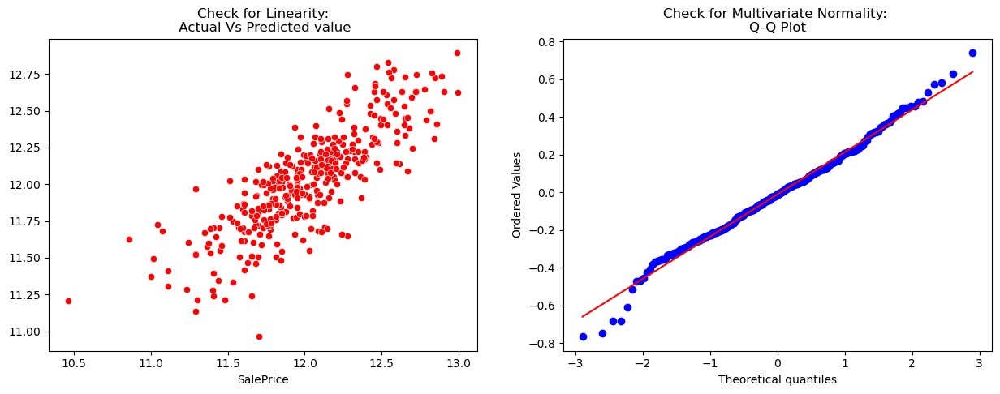

In [96]:
# Check for Linearity
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))
ax = axes[0]
g = sns.scatterplot(x=y_test, y=y_test_pred, ax=ax, color='r')
ax.set_title('Check for Linearity:\n Actual Vs Predicted value')

# Check for Residual normality & mean
ax = axes[1]
residus = y_test - y_test_pred
_, (_, _, r)= sp.stats.probplot(residus, fit=True,plot=ax)
ax.set_title('Check for Multivariate Normality: \nQ-Q Plot');

In [97]:
# Check for Multicollinearity
# Variance Inflation Factor (VIF)
R_square_test = mean_squared_error(y_test, y_test_pred, squared=True)
VIF = 1/(1- R_square_test)
VIF

1.052887061642559

Pour l'instant, la meilleure option semble être la sélection des variables du modèle linéaire.

## MODELE LINEAIRE (FILTER METHOD)

Nous allons garder les variables quantitatives et qualitatives qui ont une influence significative sur le prix des maisons. Nous nous baserons pour cela sur les résultats de l'analyse de la variance et de la matrice de correlation.

### Preprocessing

In [165]:
ord_categories =list(labelsfilt.values())
numerical_features = X_feature.select_dtypes(include = 'number').columns
numeric_transformer = Pipeline(steps=[("imputer", SimpleImputer(strategy="mean")),
                                      ("scaler", StandardScaler())]
                              )

nominal_transformer = Pipeline(steps = [("imputer2",SimpleImputer(strategy="constant",fill_value="missing")),
                                         ("OHE",OneHotEncoder(handle_unknown="ignore"))]
                                       )
ordinal_transformer = Pipeline(steps = [("imputer3",SimpleImputer(strategy="constant",fill_value="missing")),
                                          ("OE", OrdinalEncoder(categories = ord_categories, handle_unknown='error'))]
                                       )

preprocessor = ColumnTransformer(
    transformers=[
        ("num", numeric_transformer, numerical_features),
        ("cat_nom", nominal_transformer, nomX.columns),
        ("cat_ord", ordinal_transformer, ordX.columns),
    ]
)

# Append regressor to preprocessing pipeline.
# Now we have a full prediction pipeline.
reg = Pipeline(
    steps=[("preprocessor", preprocessor), ("regressor", LinearRegression())]
)
reg

Pipeline(memory=None,
         steps=[('preprocessor',
                 ColumnTransformer(n_jobs=None, remainder='drop',
                                   sparse_threshold=0.3,
                                   transformer_weights=None,
                                   transformers=[('num',
                                                  Pipeline(memory=None,
                                                           steps=[('imputer',
                                                                   SimpleImputer(add_indicator=False,
                                                                                 copy=True,
                                                                                 fill_value=None,
                                                                                 keep_empty_features=False,
                                                                                 missing_values=nan,
                                                                                 strategy='mean',
                                                                                 verbose='deprecated')),
                                                                  ('scaler'...
       'OverallCond', 'ExterQual', 'ExterCond', 'BsmtQual', 'BsmtCond',
       'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'HeatingQC',
       'KitchenQual', 'Functional', 'FireplaceQu', 'GarageQual',
       'GarageFinish', 'GarageCond', 'PavedDrive', 'PoolQC', 'Fence'],
      dtype='object'))],
                                   verbose=False,
                                   verbose_feature_names_out=True)),
                ('regressor',
                 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None,
                                  positive=False))],
         verbose=False)

### Fitting

In [166]:
X_train, X_test, y_train, y_test = train_test_split(X_feature, log_Y, test_size=0.25, random_state=23)

In [167]:
reg.fit(X_train, y_train)

Pipeline(memory=None,
         steps=[('preprocessor',
                 ColumnTransformer(n_jobs=None, remainder='drop',
                                   sparse_threshold=0.3,
                                   transformer_weights=None,
                                   transformers=[('num',
                                                  Pipeline(memory=None,
                                                           steps=[('imputer',
                                                                   SimpleImputer(add_indicator=False,
                                                                                 copy=True,
                                                                                 fill_value=None,
                                                                                 keep_empty_features=False,
                                                                                 missing_values=nan,
                                                                                 strategy='mean',
                                                                                 verbose='deprecated')),
                                                                  ('scaler'...
       'OverallCond', 'ExterQual', 'ExterCond', 'BsmtQual', 'BsmtCond',
       'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'HeatingQC',
       'KitchenQual', 'Functional', 'FireplaceQu', 'GarageQual',
       'GarageFinish', 'GarageCond', 'PavedDrive', 'PoolQC', 'Fence'],
      dtype='object'))],
                                   verbose=False,
                                   verbose_feature_names_out=True)),
                ('regressor',
                 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None,
                                  positive=False))],
         verbose=False)

### Model evaluation

In [168]:
# sklearn regression module
y_test_pred = reg.predict(X_test)
y_train_pred = reg.predict(X_train)

In [169]:
METRICS = [r2_score,
           mean_squared_error,
           RMSE,
           mean_absolute_percentage_error,
           max_error,
          ]
# get performance on single set
get_performances(real_value=y_test, estimated_value=y_test_pred, metrics=METRICS)

,metric,value
0,r2_score,0.880112
1,mean_squared_error,0.018601
2,RMSE,0.136384
3,mean_absolute_percentage_error,0.008042
4,max_error,0.698361


In [170]:
# get performances in train & test
perf_ml = get_all_performances(value_train=(y_train, y_train_pred),
                     values_test=(y_test, y_test_pred),
                     metrics=METRICS
                    )
RMSE_lin = perf_ml.iloc[2, 2]
print(RMSE_lin)
perf_ml

0.13638418592568896


,metric,train,test
0,r2_score,0.936776,0.880112
1,mean_squared_error,0.010168,0.018601
2,RMSE,0.100839,0.136384
3,mean_absolute_percentage_error,0.005990,0.008042
4,max_error,0.661965,0.698361


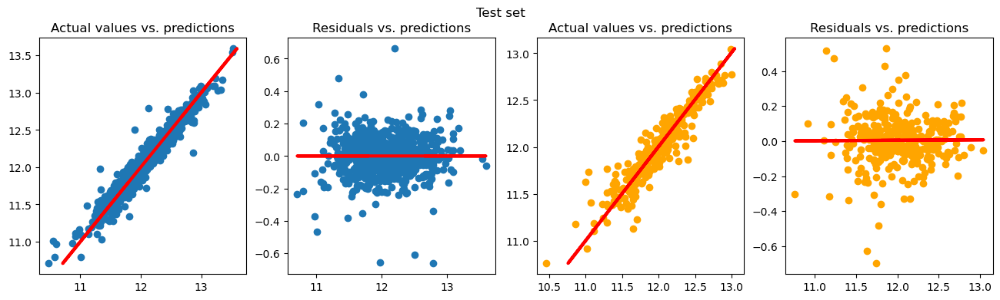

In [171]:
courbe(y_train, y_test, y_test_pred,y_train_pred)

### Model validation

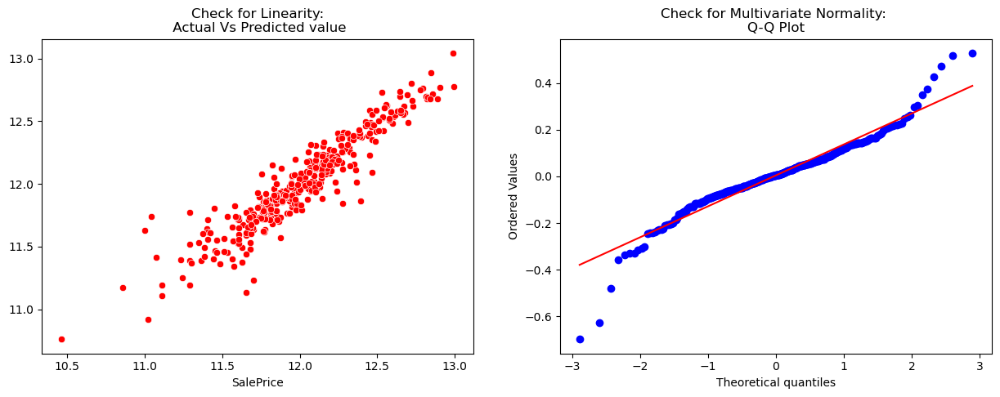

In [105]:
# Check for Linearity
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))
ax = axes[0]
g = sns.scatterplot(x=y_test, y=y_test_pred, ax=ax, color='r')
ax.set_title('Check for Linearity:\n Actual Vs Predicted value')

# Check for Residual normality & mean
ax = axes[1]
residus = y_test - y_test_pred
_, (_, _, r)= sp.stats.probplot(residus, fit=True,plot=ax)
ax.set_title('Check for Multivariate Normality: \nQ-Q Plot');

In [106]:
# Check for Multicollinearity
# Variance Inflation Factor (VIF)
R_square_test = mean_squared_error(y_test, y_test_pred, squared=True)
VIF = 1/(1- R_square_test)
VIF

1.018953187708993

Nous retiendrons ce modèle obtenu a partir du filter model pour la suite.Il a fourni de meilleurs résultats en termes de R2 et de RMSE.Nous allons tenter de l'améliorer cependant avec le hyparameter tuning.

## Parameters tuning

In [107]:
param_grid = {
    "preprocessor__num__imputer__strategy": ["mean", "median"],
    "preprocessor__cat_nom__imputer2__strategy": ["most_frequent", "constant"],
    "preprocessor__cat_ord__imputer3__strategy": ["most_frequent", "constant"],
    "regressor__fit_intercept": [True, False],
}

grid_search = GridSearchCV(reg, param_grid, cv=10, scoring="neg_mean_squared_error", return_train_score=True) 
# you can see the list of key for scoring: sorted(sklearn.metrics.SCORERS.keys())
grid_search

GridSearchCV(cv=10, error_score=nan,
             estimator=Pipeline(memory=None,
                                steps=[('preprocessor',
                                        ColumnTransformer(n_jobs=None,
                                                          remainder='drop',
                                                          sparse_threshold=0.3,
                                                          transformer_weights=None,
                                                          transformers=[('num',
                                                                         Pipeline(memory=None,
                                                                                  steps=[('imputer',
                                                                                          SimpleImputer(add_indicator=False,
                                                                                                        copy=True,
                                                                                                        fill_value=None,
                                                                                                        keep_empty_features=False,
                                                                                                        missing_values=nan,
                                                                                                        str...
             param_grid={'preprocessor__cat_nom__imputer2__strategy': ['most_frequent',
                                                                       'constant'],
                         'preprocessor__cat_ord__imputer3__strategy': ['most_frequent',
                                                                       'constant'],
                         'preprocessor__num__imputer__strategy': ['mean',
                                                                  'median'],
                         'regressor__fit_intercept': [True, False]},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
             scoring='neg_mean_squared_error', verbose=0)

In [108]:
grid_search.fit(X_train, y_train)
best_params = grid_search.best_params_
print(f"Best params: {best_params}")

Best params: {'preprocessor__cat_nom__imputer2__strategy': 'most_frequent', 'preprocessor__cat_ord__imputer3__strategy': 'most_frequent', 'preprocessor__num__imputer__strategy': 'mean', 'regressor__fit_intercept': False}


In [109]:
grid_cv_results = grid_search.cv_results_
for group in ["train", "test"]:
    mean_score = round(100 * grid_cv_results[f'mean_{group}_score'].mean(), 2)
    mean_std_score = round(grid_cv_results[f'std_{group}_score'].mean(), 2)
    print(f"{group}====================\nMean score (std): {mean_score} ({mean_std_score})\n")

train====================
Mean score (std): -0.98 (0.0)

test====================
Mean score (std): -2.57 (0.01)



In [110]:
print(f"Internal CV score: {grid_search.best_score_: .5f}")

Internal CV score: -0.02546


In [111]:
cv_results = pd.DataFrame(grid_cv_results)
cv_results = cv_results.sort_values("mean_test_score", ascending=False)
cv_results[["mean_train_score", "std_train_score",
            "mean_test_score", "std_test_score",
            "mean_fit_time", "std_fit_time",
            "mean_score_time", "std_score_time"
           ]]

,mean_train_score,std_train_score,mean_test_score,std_test_score,mean_fit_time,std_fit_time,mean_score_time,std_score_time
1,-0.009804,0.000349,-0.025455,0.012832,0.068902,0.002268,0.010947,0.000520
3,-0.009804,0.000349,-0.025455,0.012832,0.070111,0.002354,0.010424,0.000861
5,-0.009804,0.000349,-0.025455,0.012832,0.074241,0.004704,0.011380,0.000784
7,-0.009804,0.000349,-0.025455,0.012832,0.075198,0.004699,0.011848,0.001458
9,-0.009789,0.000349,-0.025594,0.012891,0.077144,0.004873,0.012083,0.000464
11,-0.009789,0.000349,-0.025594,0.012891,0.074292,0.003963,0.011147,0.000739
13,-0.009789,0.000349,-0.025594,0.012891,0.070621,0.003154,0.010649,0.000658
15,-0.009789,0.000349,-0.025594,0.012891,0.080201,0.008089,0.014549,0.009614
0,-0.009804,0.000349,-0.025767,0.014541,0.072532,0.007636,0.011237,0.001028
2,-0.009804,0.000349,-0.025767,0.014541,0.069189,0.001945,0.010457,0.000540


### COMPARAISONS DES PERFORMANCES

In [112]:
regb = grid_search.best_estimator_
regb.fit(X_train, y_train)
y_test_predg = regb.predict(X_test)
y_train_predg = regb.predict(X_train)

In [113]:
# get performance 
perf = get_all_performances(value_train=(y_train, y_train_predg),
                     values_test=(y_test, y_test_predg),
                     metrics=METRICS
                    )
perf

,metric,train,test
0,r2_score,0.936682,0.485294
1,mean_squared_error,0.010184,0.079857
2,RMSE,0.100913,0.282589
3,mean_absolute_percentage_error,0.006000,0.009251
4,max_error,0.662439,4.688929


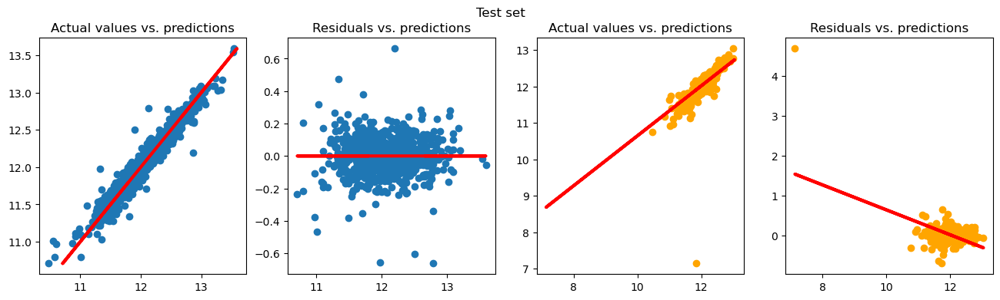

In [114]:
courbe(y_train, y_test, y_test_predg,y_train_predg)

In [115]:
# get performances in train & test
perf_ml

,metric,train,test
0,r2_score,0.936776,0.880112
1,mean_squared_error,0.010168,0.018601
2,RMSE,0.100839,0.136384
3,mean_absolute_percentage_error,0.005990,0.008042
4,max_error,0.661965,0.698361


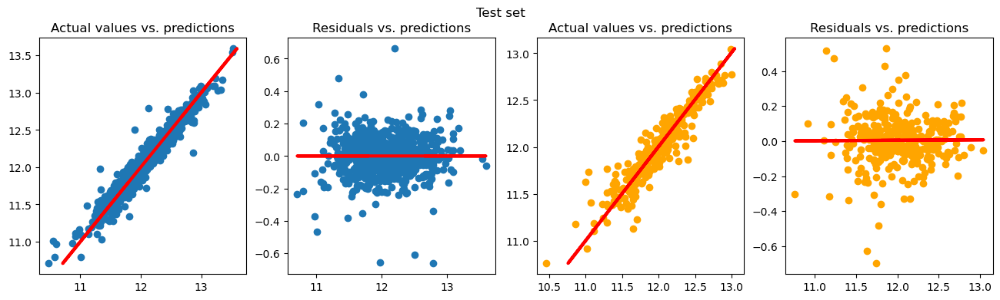

In [116]:
courbe(y_train, y_test, y_test_pred,y_train_pred)

Le modèle regb est meilleur de très peu dans le train data mais pas dans le test data : il y fournit de résultats plutot moyens donc nous garderons le premier modèle.

## CROSS_VALIDATION

In [117]:
#cross validation only
cv_results = cross_validate(reg,
                            X_train, y_train,
                            cv=10,
                            scoring=('r2', 'neg_mean_squared_error'),
                            return_train_score=True)
cv_results = pd.DataFrame(cv_results)

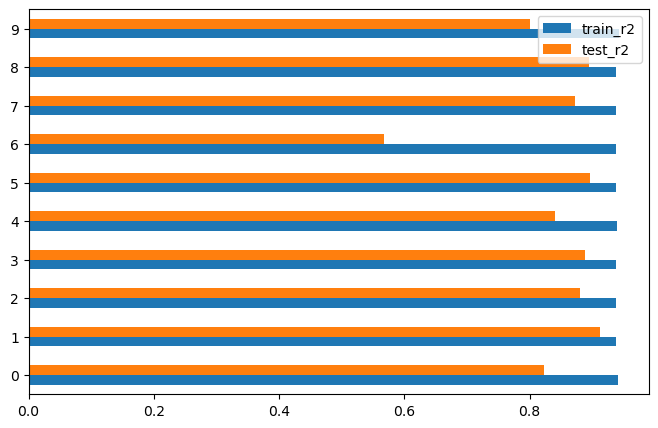

In [118]:
cv_results[["train_r2", "test_r2"]].plot(kind="barh", figsize=(8, 5));

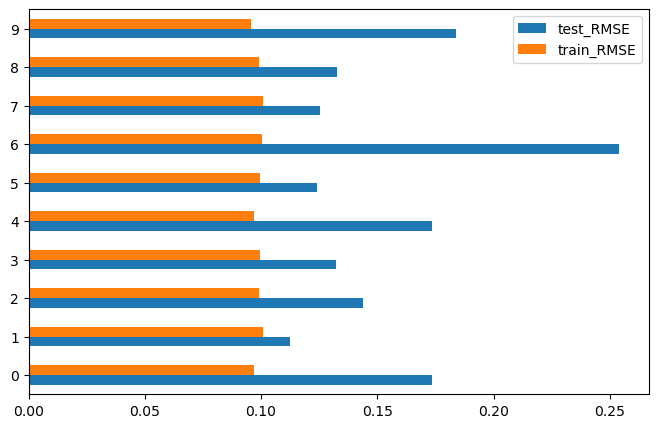

In [119]:
col=["test_neg_mean_squared_error","train_neg_mean_squared_error"]
RMSE=np.sqrt(-cv_results[col]) 
RMSE.columns=['test_RMSE','train_RMSE']
RMSE
RMSE[['test_RMSE','train_RMSE']].plot(kind="barh", figsize=(8, 5));

In [120]:
mean_RMSE_lin =-cv_results['test_neg_mean_squared_error'].mean()
mean_RMSE_lin=np.sqrt(mean_RMSE_lin)
mean_RMSE_lin

0.16067029220581056

La cross_validation montre toutefois une certaine instabilité du modèle.

## FEATURE IMPORTANCE

In [121]:
new_cols_nom = reg.named_steps["preprocessor"].named_transformers_["cat_nom"].named_steps["OHE"].get_feature_names_out(nomX.columns)
cols_ord = ordX.columns
all_cols = np.concatenate([numerical_features,cols_ord,new_cols_nom])
all_cols

array(['GrLivArea', 'GarageCars', 'GarageArea', 'TotalBsmtSF', '1stFlrSF',
       'FullBath', 'TotRmsAbvGrd', 'Age', 'LandContour', 'Utilities',
       'LotShape', 'HouseStyle', 'OverallQual', 'OverallCond',
       'ExterQual', 'ExterCond', 'BsmtQual', 'BsmtCond', 'BsmtExposure',
       'BsmtFinType1', 'BsmtFinType2', 'HeatingQC', 'KitchenQual',
       'Functional', 'FireplaceQu', 'GarageQual', 'GarageFinish',
       'GarageCond', 'PavedDrive', 'PoolQC', 'Fence',
       'Neighborhood_Blmngtn', 'Neighborhood_Blueste',
       'Neighborhood_BrDale', 'Neighborhood_BrkSide',
       'Neighborhood_ClearCr', 'Neighborhood_CollgCr',
       'Neighborhood_Crawfor', 'Neighborhood_Edwards',
       'Neighborhood_Gilbert', 'Neighborhood_IDOTRR',
       'Neighborhood_MeadowV', 'Neighborhood_Mitchel',
       'Neighborhood_NAmes', 'Neighborhood_NPkVill',
       'Neighborhood_NWAmes', 'Neighborhood_NoRidge',
       'Neighborhood_NridgHt', 'Neighborhood_OldTown',
       'Neighborhood_SWISU', 'Neighborhood

In [122]:
# model_features = all_cols[mask]
model_features = all_cols
model_features

array(['GrLivArea', 'GarageCars', 'GarageArea', 'TotalBsmtSF', '1stFlrSF',
       'FullBath', 'TotRmsAbvGrd', 'Age', 'LandContour', 'Utilities',
       'LotShape', 'HouseStyle', 'OverallQual', 'OverallCond',
       'ExterQual', 'ExterCond', 'BsmtQual', 'BsmtCond', 'BsmtExposure',
       'BsmtFinType1', 'BsmtFinType2', 'HeatingQC', 'KitchenQual',
       'Functional', 'FireplaceQu', 'GarageQual', 'GarageFinish',
       'GarageCond', 'PavedDrive', 'PoolQC', 'Fence',
       'Neighborhood_Blmngtn', 'Neighborhood_Blueste',
       'Neighborhood_BrDale', 'Neighborhood_BrkSide',
       'Neighborhood_ClearCr', 'Neighborhood_CollgCr',
       'Neighborhood_Crawfor', 'Neighborhood_Edwards',
       'Neighborhood_Gilbert', 'Neighborhood_IDOTRR',
       'Neighborhood_MeadowV', 'Neighborhood_Mitchel',
       'Neighborhood_NAmes', 'Neighborhood_NPkVill',
       'Neighborhood_NWAmes', 'Neighborhood_NoRidge',
       'Neighborhood_NridgHt', 'Neighborhood_OldTown',
       'Neighborhood_SWISU', 'Neighborhood

In [123]:
reg_estimator = reg.named_steps["regressor"]

In [124]:
reg.named_steps["regressor"].coef_
df_feature_importance = pd.DataFrame(reg_estimator.coef_, columns=["coef"], index=model_features)
print(f"Shape: {df_feature_importance.shape}")
df_feature_importance.sort_values(by = 'coef')

Shape: (196, 1)


,coef
SaleType_WD,-2.002033
Condition1_RRNn,-0.655244
MSSubClass_40,-0.367080
Exterior2nd_AsphShn,-0.336335
Exterior1st_Stucco,-0.198478
...,...
MSZoning_C (all),0.316613
Exterior1st_Wd Sdng,0.341044
MSZoning_FV,0.355313
Condition1_RRNe,0.372328


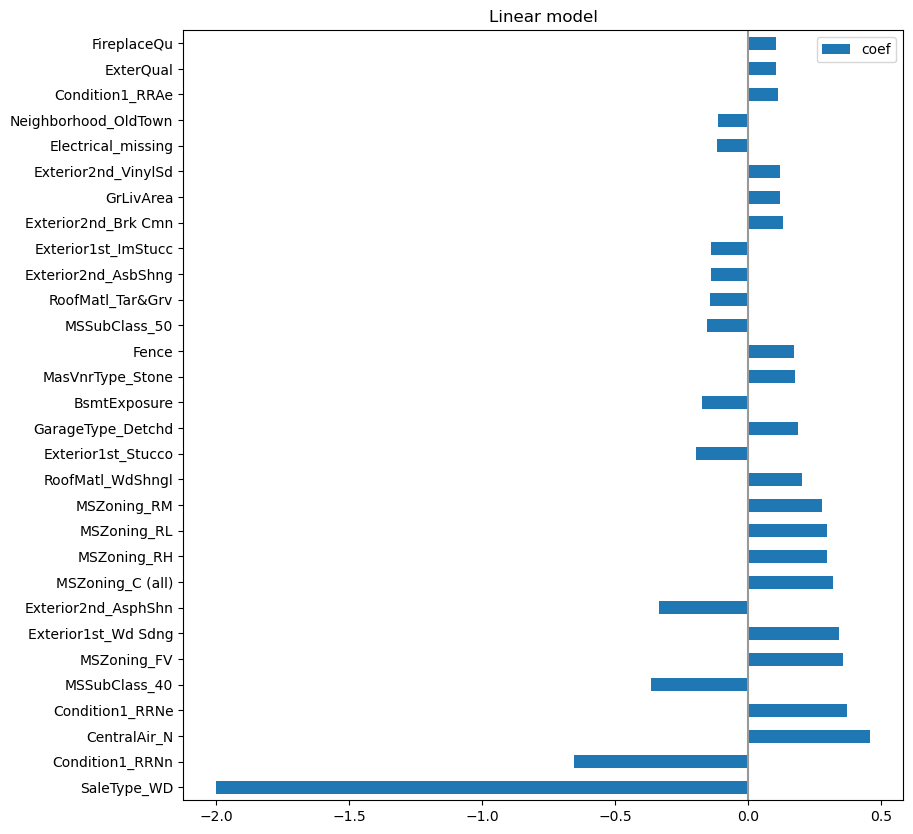

In [125]:
# top30 most important features
(df_feature_importance
 .sort_values("coef", key=lambda v: abs(v), ascending=False)
 .head(30)
 .plot(kind="barh", figsize=(12, 10))
)
plt.title("Linear model")
plt.axvline(x=0, color='.6')
plt.subplots_adjust(left=.3);

In [126]:
df_feature_importance = df_feature_importance.sort_values(by = 'coef')
df_feature_importance
most_import_features = df_feature_importance[abs(df_feature_importance['coef'])>0.05]
most_import_features

,coef
SaleType_WD,-2.002033
Condition1_RRNn,-0.655244
MSSubClass_40,-0.367080
Exterior2nd_AsphShn,-0.336335
Exterior1st_Stucco,-0.198478
...,...
MSZoning_C (all),0.316613
Exterior1st_Wd Sdng,0.341044
MSZoning_FV,0.355313
Condition1_RRNe,0.372328


# REGRESSION LASSO

## Pipeline

In [172]:
from sklearn.linear_model import Lasso
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OrdinalEncoder

ord_categories =list(labels.values())
numerical_features = X.select_dtypes(include = 'number').columns
numeric_transformer = Pipeline(steps=[("imputer", SimpleImputer(strategy="mean")),
                                      ("scaler", StandardScaler())]
                              )

nominal_transformer = Pipeline(steps = [("imputer2",SimpleImputer(strategy="constant", fill_value="missing")),
                                         ("OHE",OneHotEncoder(handle_unknown="ignore"))]
                                       )
ordinal_transformer = Pipeline(steps = [("imputer3",SimpleImputer(strategy="constant")),
                                          ("OE", OrdinalEncoder(categories = ord_categories, handle_unknown='error'))]
                                       )

categorical_pipeline = Pipeline([
    ("imputer", SimpleImputer(strategy="most_frequent")),
    ("encoder", OneHotEncoder(sparse=True, handle_unknown="ignore"))
])
preprocessor = ColumnTransformer(
    transformers=[
        ("num", numeric_transformer, numerical_features),
        ("cat_nom", nominal_transformer, nom_X.columns),
        ("cat_ord", ordinal_transformer, ord_X.columns),
    ]
)

# Now we have a full prediction pipeline.
reg = Pipeline(
    steps=[("preprocessor", preprocessor),("regressor", Lasso(alpha=0.01))]
)
reg

Pipeline(memory=None,
         steps=[('preprocessor',
                 ColumnTransformer(n_jobs=None, remainder='drop',
                                   sparse_threshold=0.3,
                                   transformer_weights=None,
                                   transformers=[('num',
                                                  Pipeline(memory=None,
                                                           steps=[('imputer',
                                                                   SimpleImputer(add_indicator=False,
                                                                                 copy=True,
                                                                                 fill_value=None,
                                                                                 keep_empty_features=False,
                                                                                 missing_values=nan,
                                                                                 strategy='mean',
                                                                                 verbose='deprecated')),
                                                                  ('scaler'...
       'KitchenQual', 'Functional', 'FireplaceQu', 'GarageQual',
       'GarageFinish', 'GarageCond', 'PavedDrive', 'PoolQC', 'Fence'],
      dtype='object'))],
                                   verbose=False,
                                   verbose_feature_names_out=True)),
                ('regressor',
                 Lasso(alpha=0.01, copy_X=True, fit_intercept=True,
                       max_iter=1000, positive=False, precompute=False,
                       random_state=None, selection='cyclic', tol=0.0001,
                       warm_start=False))],
         verbose=False)

## Fitting

In [173]:
X_train, X_test, y_train, y_test = train_test_split(X, log_Y, test_size=0.25, random_state=23)

In [174]:
reg.fit(X_train, y_train)

Pipeline(memory=None,
         steps=[('preprocessor',
                 ColumnTransformer(n_jobs=None, remainder='drop',
                                   sparse_threshold=0.3,
                                   transformer_weights=None,
                                   transformers=[('num',
                                                  Pipeline(memory=None,
                                                           steps=[('imputer',
                                                                   SimpleImputer(add_indicator=False,
                                                                                 copy=True,
                                                                                 fill_value=None,
                                                                                 keep_empty_features=False,
                                                                                 missing_values=nan,
                                                                                 strategy='mean',
                                                                                 verbose='deprecated')),
                                                                  ('scaler'...
       'KitchenQual', 'Functional', 'FireplaceQu', 'GarageQual',
       'GarageFinish', 'GarageCond', 'PavedDrive', 'PoolQC', 'Fence'],
      dtype='object'))],
                                   verbose=False,
                                   verbose_feature_names_out=True)),
                ('regressor',
                 Lasso(alpha=0.01, copy_X=True, fit_intercept=True,
                       max_iter=1000, positive=False, precompute=False,
                       random_state=None, selection='cyclic', tol=0.0001,
                       warm_start=False))],
         verbose=False)

## Model evaluation

In [175]:
# sklearn regression module
y_test_pred = reg.predict(X_test)
y_train_pred = reg.predict(X_train)

In [144]:
def get_performances(real_value, estimated_value, metrics):
    perfs = []
    for metric_func in metrics:
        perfs.append((metric_func.__name__, metric_func(real_value, estimated_value)))
    return pd.DataFrame(perfs, columns=["metric", "value"])


def get_all_performances(value_train, values_test, metrics):
    test_perfs = []
    train_perfs = []
    metric_names = []
    for metric_func in metrics:
        metric_name = metric_func.__name__
        metric_names.append(metric_name)
        train_perfs.append(metric_func(*value_train))
        test_perfs.append(metric_func(*values_test))
    perfs = {"metric": metric_names, "train": train_perfs, "test": test_perfs,}
    return pd.DataFrame(perfs)

In [176]:
METRICS = [r2_score,
           mean_squared_error,
           RMSE,
           mean_absolute_percentage_error,
           max_error,
          ]
# get performance on single set
get_performances(real_value=y_test, estimated_value=y_test_pred, metrics=METRICS)

,metric,value
0,r2_score,0.871318
1,mean_squared_error,0.019965
2,RMSE,0.141297
3,mean_absolute_percentage_error,0.008752
4,max_error,0.838387


In [177]:
# get performances in train & test
perf_lasso = get_all_performances(value_train=(y_train, y_train_pred),
                     values_test=(y_test, y_test_pred),
                     metrics=METRICS
                    )
RMSE_lasso = perf_lasso.iloc[2, 2]
print(RMSE_lasso)
perf_lasso

0.14129747939216947


,metric,train,test
0,r2_score,0.862541,0.871318
1,mean_squared_error,0.022108,0.019965
2,RMSE,0.148687,0.141297
3,mean_absolute_percentage_error,0.008500,0.008752
4,max_error,1.668857,0.838387


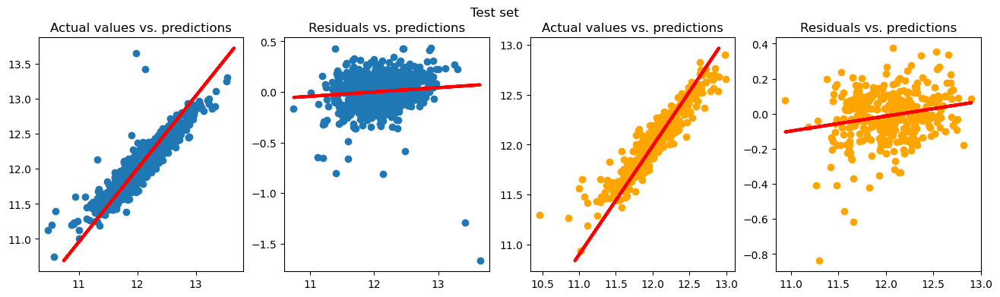

In [178]:
courbe(y_train, y_test, y_test_pred,y_train_pred)

## Model validation

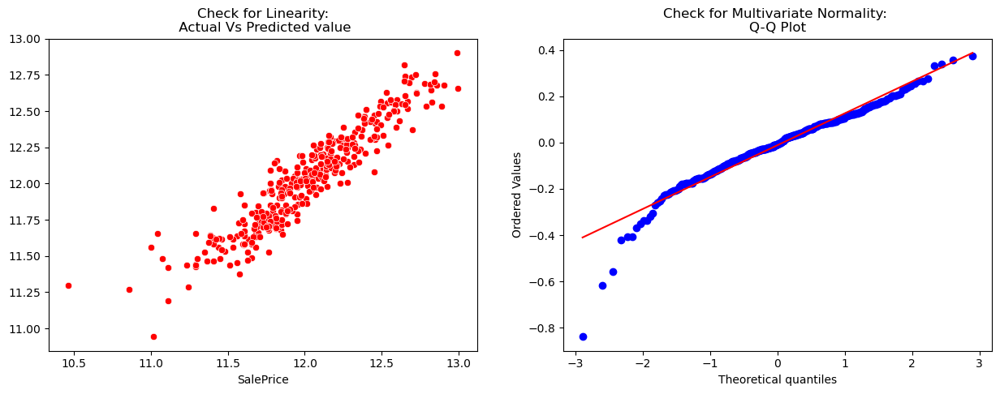

In [179]:
# Check for Linearity
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))
ax = axes[0]
g = sns.scatterplot(x=y_test, y=y_test_pred, ax=ax, color='r')
ax.set_title('Check for Linearity:\n Actual Vs Predicted value')

# Check for Residual normality & mean
ax = axes[1]
residus = y_test - y_test_pred
_, (_, _, r)= sp.stats.probplot(residus, fit=True,plot=ax)
ax.set_title('Check for Multivariate Normality: \nQ-Q Plot');

In [180]:
# Check for Multicollinearity
# Variance Inflation Factor (VIF)
R_square_test = mean_squared_error(y_test, y_test_pred, squared=True)
VIF = 1/(1- R_square_test)
VIF

1.0203716981821433

## Parameters tuning

In [181]:

param_grid = {
    "preprocessor__num__imputer__strategy": ["mean", "median"],
    "preprocessor__cat_nom__imputer2__strategy": ["most_frequent", "constant"],
    "preprocessor__cat_ord__imputer3__strategy": ["most_frequent", "constant"],
    "regressor__fit_intercept": [True, False],
    "regressor__alpha" : [0.005,0.01,0.5]
}

grid_search = GridSearchCV(reg, param_grid, cv=10, scoring="neg_root_mean_squared_error", return_train_score=True) # r2
grid_search

GridSearchCV(cv=10, error_score=nan,
             estimator=Pipeline(memory=None,
                                steps=[('preprocessor',
                                        ColumnTransformer(n_jobs=None,
                                                          remainder='drop',
                                                          sparse_threshold=0.3,
                                                          transformer_weights=None,
                                                          transformers=[('num',
                                                                         Pipeline(memory=None,
                                                                                  steps=[('imputer',
                                                                                          SimpleImputer(add_indicator=False,
                                                                                                        copy=True,
                                                                                                        fill_value=None,
                                                                                                        keep_empty_features=False,
                                                                                                        missing_values=nan,
                                                                                                        str...
             param_grid={'preprocessor__cat_nom__imputer2__strategy': ['most_frequent',
                                                                       'constant'],
                         'preprocessor__cat_ord__imputer3__strategy': ['most_frequent',
                                                                       'constant'],
                         'preprocessor__num__imputer__strategy': ['mean',
                                                                  'median'],
                         'regressor__alpha': [0.005, 0.01, 0.5],
                         'regressor__fit_intercept': [True, False]},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
             scoring='neg_root_mean_squared_error', verbose=0)

In [182]:
grid_search.fit(X_train, y_train)

GridSearchCV(cv=10, error_score=nan,
             estimator=Pipeline(memory=None,
                                steps=[('preprocessor',
                                        ColumnTransformer(n_jobs=None,
                                                          remainder='drop',
                                                          sparse_threshold=0.3,
                                                          transformer_weights=None,
                                                          transformers=[('num',
                                                                         Pipeline(memory=None,
                                                                                  steps=[('imputer',
                                                                                          SimpleImputer(add_indicator=False,
                                                                                                        copy=True,
                                                                                                        fill_value=None,
                                                                                                        keep_empty_features=False,
                                                                                                        missing_values=nan,
                                                                                                        str...
             param_grid={'preprocessor__cat_nom__imputer2__strategy': ['most_frequent',
                                                                       'constant'],
                         'preprocessor__cat_ord__imputer3__strategy': ['most_frequent',
                                                                       'constant'],
                         'preprocessor__num__imputer__strategy': ['mean',
                                                                  'median'],
                         'regressor__alpha': [0.005, 0.01, 0.5],
                         'regressor__fit_intercept': [True, False]},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
             scoring='neg_root_mean_squared_error', verbose=0)

In [183]:
best_params = grid_search.best_params_
print(f"Best params: {best_params}")

Best params: {'preprocessor__cat_nom__imputer2__strategy': 'most_frequent', 'preprocessor__cat_ord__imputer3__strategy': 'most_frequent', 'preprocessor__num__imputer__strategy': 'mean', 'regressor__alpha': 0.005, 'regressor__fit_intercept': True}


In [184]:
grid_cv_results = grid_search.cv_results_
for group in ["train", "test"]:
    mean_score = round(100 * grid_cv_results[f'mean_{group}_score'].mean(), 2)
    mean_std_score = round(grid_cv_results[f'std_{group}_score'].mean(), 2)
    print(f"{group}====================\nMean score (std): {mean_score} ({mean_std_score})\n")

train====================
Mean score (std): -32.78 (0.01)

test====================
Mean score (std): -33.91 (0.09)



In [185]:
print(f"Internal CV score: {grid_search.best_score_: .3f}")

Internal CV score: -0.155


In [186]:
cv_results = pd.DataFrame(grid_cv_results)
cv_results = cv_results.sort_values("mean_test_score", ascending=False)
cv_results[["mean_train_score", "std_train_score",
            "mean_test_score", "std_test_score",
            "mean_fit_time", "std_fit_time",
            "mean_score_time", "std_score_time"
           ]]

,mean_train_score,std_train_score,mean_test_score,std_test_score,mean_fit_time,std_fit_time,mean_score_time,std_score_time
0,-0.140893,0.003967,-0.155360,0.041357,0.050929,0.012473,0.014392,0.002929
12,-0.140893,0.003967,-0.155360,0.041357,0.045628,0.002211,0.013559,0.001356
36,-0.140893,0.003967,-0.155360,0.041357,0.044961,0.003995,0.013193,0.001691
24,-0.140893,0.003967,-0.155360,0.041357,0.045261,0.001977,0.012606,0.001058
18,-0.140893,0.003972,-0.155365,0.041353,0.046162,0.003107,0.013191,0.001271
6,-0.140893,0.003972,-0.155365,0.041353,0.066314,0.007290,0.016844,0.001606
30,-0.140893,0.003972,-0.155365,0.041353,0.046843,0.003612,0.012735,0.001224
42,-0.140893,0.003972,-0.155365,0.041353,0.046897,0.002467,0.013656,0.001700
33,-0.147771,0.004009,-0.157568,0.033462,0.100357,0.004161,0.013860,0.001930
45,-0.147771,0.004009,-0.157568,0.033462,0.103497,0.002154,0.013731,0.000941


### COMPARAISONS DES PERFORMANCES

In [187]:
regb = grid_search.best_estimator_
regb.fit(X_train, y_train)
y_test_predg = regb.predict(X_test)
y_train_predg = regb.predict(X_train)

In [188]:
# get performance 
perf = get_all_performances(value_train=(y_train, y_train_predg),
                     values_test=(y_test, y_test_predg),
                     metrics=METRICS
                    )
perf

,metric,train,test
0,r2_score,0.874851,0.885810
1,mean_squared_error,0.020128,0.017717
2,RMSE,0.141873,0.133103
3,mean_absolute_percentage_error,0.007995,0.008107
4,max_error,1.617335,0.861445


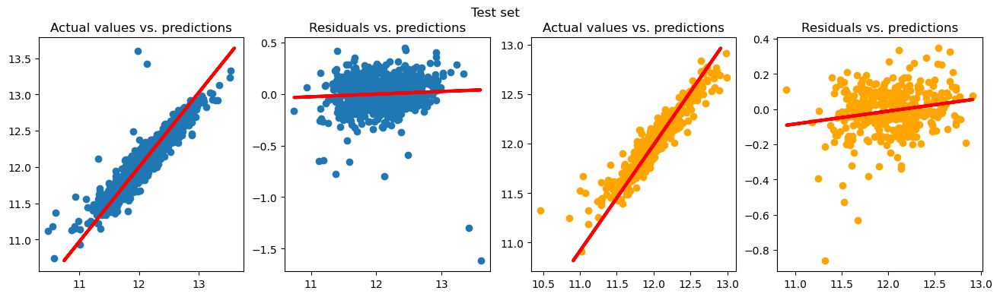

In [189]:
courbe(y_train, y_test, y_test_predg,y_train_predg)

In [190]:
# get performances in train & test
perf_lasso

,metric,train,test
0,r2_score,0.862541,0.871318
1,mean_squared_error,0.022108,0.019965
2,RMSE,0.148687,0.141297
3,mean_absolute_percentage_error,0.008500,0.008752
4,max_error,1.668857,0.838387


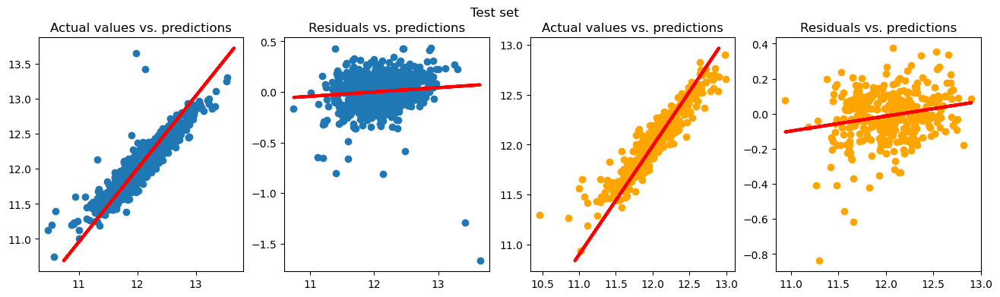

In [191]:
courbe(y_train, y_test, y_test_pred,y_train_pred)

Le modèle regb est meilleur de très peu dans le train data mais pas dans le test data : il y fournit de résultats plutot moyens donc nous garderons le premier modèle.

In [192]:
reg_estimator = reg["regressor"]

In [193]:
def get_input_features(model_pipeline, cat_step_name):
    """ Get model feature names used in training
    
    """

    all_feature_names = []

    for step_name, pipe_trans, feat_names in reg["preprocessor"].transformers_:
        if step_name == cat_step_name:
            all_feature_names.extend(pipe_trans
                                 .named_steps["OHE"]
                                 .get_feature_names_out(input_features=nom_X.columns)
                                )
        if step_name == 'num' or step_name == 'cat_ord':
            all_feature_names.extend(feat_names)
    return all_feature_names

## CROSS VALIDATION

In [216]:
#cross validation only
cv_results = cross_validate(regb,
                            X_train, y_train,
                            cv=5,
                            scoring=('r2', 'neg_mean_squared_error'),
                            return_train_score=True)
pd.DataFrame(cv_results)

,fit_time,score_time,test_r2,train_r2,test_neg_mean_squared_error,train_neg_mean_squared_error
0,0.043494,0.019989,0.893170,0.868251,-0.016878,-0.021120
1,0.048454,0.021496,0.881181,0.871093,-0.019567,-0.020605
2,0.060888,0.021508,0.846637,0.878523,-0.025994,-0.019171
3,0.058199,0.021305,0.694635,0.894124,-0.041837,-0.017659
4,0.043460,0.015982,0.857758,0.878752,-0.023927,-0.019276


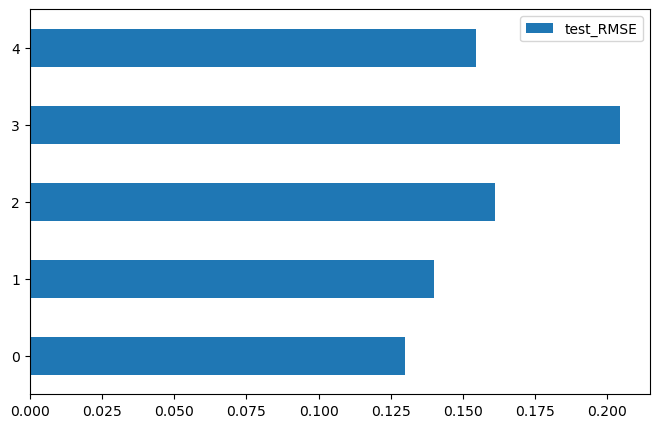

In [241]:
RMSE=np.sqrt(-cv_results["test_neg_mean_squared_error"]) 
RMSE = pd.DataFrame(RMSE)
RMSE.columns=['test_RMSE']
RMSE
RMSE[['test_RMSE']].plot(kind="barh", figsize=(8, 5));

In [217]:
mean_RMSE_lasso =-cv_results['test_neg_mean_squared_error'].mean()
mean_RMSE_lasso=np.sqrt(mean_RMSE_lasso)
mean_RMSE_lasso

0.16012707136752055

In [228]:
col=['test_neg_mean_squared_error','train_neg_mean_squared_error']
col

['test_neg_mean_squared_error', 'train_neg_mean_squared_error']

In [230]:
#cross validation only
cv_results2 = cross_validate(reg,
                            X_train, y_train,
                            cv=5,
                            scoring=('r2', 'neg_mean_squared_error'),
                            return_train_score=True)
pd.DataFrame(cv_results2)

,fit_time,score_time,test_r2,train_r2,test_neg_mean_squared_error,train_neg_mean_squared_error
0,0.042981,0.022009,0.885996,0.854286,-0.018012,-0.023359
1,0.049497,0.021995,0.874461,0.857856,-0.020673,-0.022721
2,0.052983,0.019713,0.837327,0.866044,-0.027572,-0.021140
3,0.054481,0.021753,0.689787,0.884740,-0.042502,-0.019224
4,0.044462,0.019472,0.851041,0.865868,-0.025057,-0.021325


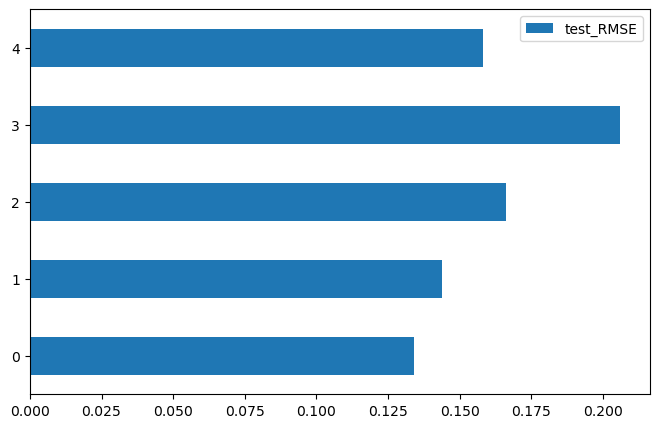

In [239]:
RMSE=np.sqrt(-cv_results2["test_neg_mean_squared_error"]) 
RMSE = pd.DataFrame(RMSE)
RMSE.columns=['test_RMSE']
RMSE
RMSE[['test_RMSE']].plot(kind="barh", figsize=(8, 5));

In [1184]:
mean_RMSE_lasso =-cv_results2['test_neg_mean_squared_error'].mean()
mean_RMSE_lasso=np.sqrt(mean_RMSE_lasso)
mean_RMSE_lasso

0.16359456508116543

Le modèle obtenu à partir du hyparameters tuning sera maintenu car présentant de meilleures performances.

In [1185]:
reg = regb
perf_lasso = perf
mean_RMSE_lasso =-cv_results['test_neg_mean_squared_error'].mean()
mean_RMSE_lasso=np.sqrt(mean_RMSE_lasso)
mean_RMSE_lasso

0.16012707136752055

## FEATURE IMPORTANCE

In [1186]:
new_cols_nom = reg.named_steps["preprocessor"].named_transformers_["cat_nom"].named_steps["OHE"].get_feature_names_out(nom_X.columns)
cols_ord = ord_X.columns
all_cols = np.concatenate([numerical_features,cols_ord,new_cols_nom])
all_cols

array(['LotFrontage', 'LotArea', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2',
       'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea',
       'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath',
       'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces',
       'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF',
       'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal',
       'PartBsmtUnfSF', 'Age', 'Age_GarageYrBlt', 'LandContour',
       'Utilities', 'LandSlope', 'LotShape', 'HouseStyle', 'OverallQual',
       'OverallCond', 'ExterQual', 'ExterCond', 'BsmtQual', 'BsmtCond',
       'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'HeatingQC',
       'KitchenQual', 'Functional', 'FireplaceQu', 'GarageQual',
       'GarageFinish', 'GarageCond', 'PavedDrive', 'PoolQC', 'Fence',
       'MSSubClass_20', 'MSSubClass_30', 'MSSubClass_40', 'MSSubClass_45',
       'MSSubClass_50', 'MSSubClass_60', 'MSSubClass_70', 'MSSubClass_75',
       'MSSubCl

In [1187]:
# model_features = all_cols[mask]
model_features = all_cols
model_features

array(['LotFrontage', 'LotArea', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2',
       'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea',
       'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath',
       'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces',
       'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF',
       'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal',
       'PartBsmtUnfSF', 'Age', 'Age_GarageYrBlt', 'LandContour',
       'Utilities', 'LandSlope', 'LotShape', 'HouseStyle', 'OverallQual',
       'OverallCond', 'ExterQual', 'ExterCond', 'BsmtQual', 'BsmtCond',
       'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'HeatingQC',
       'KitchenQual', 'Functional', 'FireplaceQu', 'GarageQual',
       'GarageFinish', 'GarageCond', 'PavedDrive', 'PoolQC', 'Fence',
       'MSSubClass_20', 'MSSubClass_30', 'MSSubClass_40', 'MSSubClass_45',
       'MSSubClass_50', 'MSSubClass_60', 'MSSubClass_70', 'MSSubClass_75',
       'MSSubCl

In [1188]:
reg_estimator = reg.named_steps["regressor"]

In [1189]:
model_features = get_input_features(model_pipeline=reg, cat_step_name="cat_nom")
model_features

['LotFrontage',
 'LotArea',
 'MasVnrArea',
 'BsmtFinSF1',
 'BsmtFinSF2',
 'TotalBsmtSF',
 '1stFlrSF',
 '2ndFlrSF',
 'LowQualFinSF',
 'GrLivArea',
 'BsmtFullBath',
 'BsmtHalfBath',
 'FullBath',
 'HalfBath',
 'BedroomAbvGr',
 'KitchenAbvGr',
 'TotRmsAbvGrd',
 'Fireplaces',
 'GarageCars',
 'GarageArea',
 'WoodDeckSF',
 'OpenPorchSF',
 'EnclosedPorch',
 '3SsnPorch',
 'ScreenPorch',
 'PoolArea',
 'MiscVal',
 'PartBsmtUnfSF',
 'Age',
 'Age_GarageYrBlt',
 'MSSubClass_20',
 'MSSubClass_30',
 'MSSubClass_40',
 'MSSubClass_45',
 'MSSubClass_50',
 'MSSubClass_60',
 'MSSubClass_70',
 'MSSubClass_75',
 'MSSubClass_80',
 'MSSubClass_85',
 'MSSubClass_90',
 'MSSubClass_120',
 'MSSubClass_160',
 'MSSubClass_180',
 'MSSubClass_190',
 'MSZoning_C (all)',
 'MSZoning_FV',
 'MSZoning_RH',
 'MSZoning_RL',
 'MSZoning_RM',
 'Street_Grvl',
 'Street_Pave',
 'Alley_Grvl',
 'Alley_No alley access',
 'Alley_Pave',
 'LotConfig_Corner',
 'LotConfig_CulDSac',
 'LotConfig_FR2',
 'LotConfig_FR3',
 'LotConfig_Inside',
 

In [1190]:
df_feature_importance = pd.DataFrame(reg_estimator.coef_, columns=["coef"], index=model_features)
print(f"Shape: {df_feature_importance.shape}")
df_feature_importance.sort_values(by = "coef")

Shape: (231, 1)


,coef
Age,-0.044774
MSZoning_RM,-0.035076
PartBsmtUnfSF,-0.019226
HouseStyle,-0.004501
PoolArea,-0.003618
...,...
BsmtQual,0.026199
OverallCond,0.039790
GarageCars,0.048436
GrLivArea,0.080441


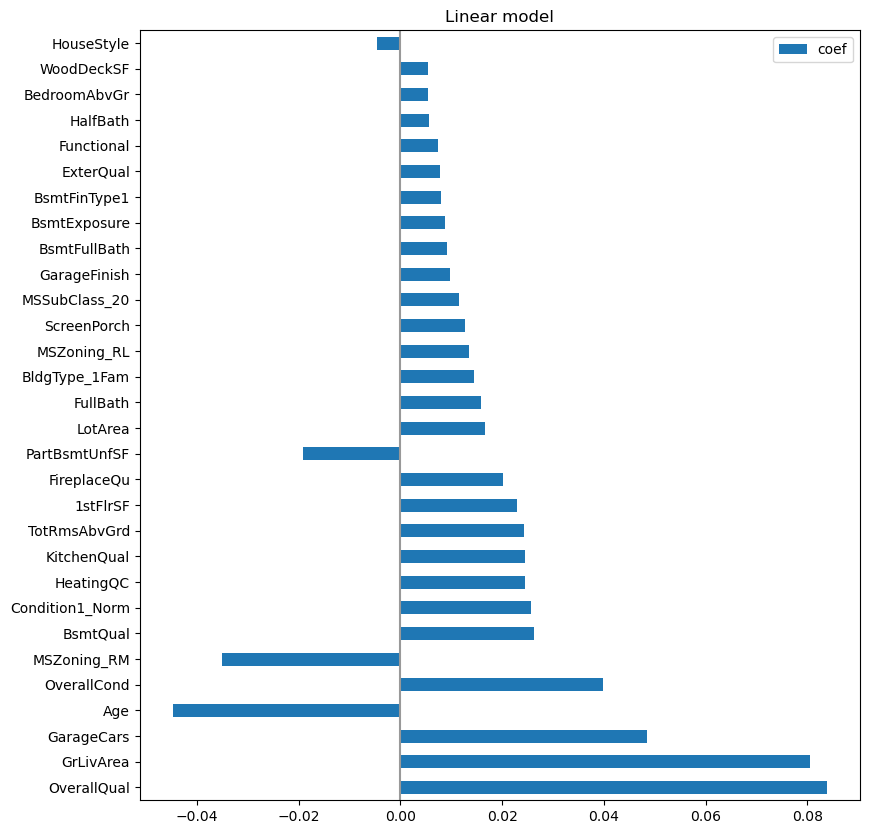

In [1191]:
# top30 most important features
(df_feature_importance
 .sort_values("coef", key=lambda v: abs(v), ascending=False)
 .head(30)
 .plot(kind="barh", figsize=(12, 10))
)
plt.title("Linear model")
plt.axvline(x=0, color='.6')
plt.subplots_adjust(left=.3);

# REGRESSION RIDGE 

## Pipeline

In [242]:
from sklearn.linear_model import Ridge
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OrdinalEncoder

ord_categories =list(labels.values())
numerical_features = X.select_dtypes(include = 'number').columns
numeric_transformer = Pipeline(steps=[("imputer", SimpleImputer(strategy="median")),
                                      ("scaler", StandardScaler())]
                              )

nominal_transformer = Pipeline(steps = [("imputer2",SimpleImputer(strategy="constant", fill_value="missing")),
                                         ("OHE",OneHotEncoder(handle_unknown="ignore"))]
                                       )
ordinal_transformer = Pipeline(steps = [("imputer3",SimpleImputer(strategy="constant")),
                                          ("OE", OrdinalEncoder(categories = ord_categories, handle_unknown='error'))]
                                       )

categorical_pipeline = Pipeline([
    ("imputer", SimpleImputer(strategy="most_frequent")),
    ("encoder", OneHotEncoder(sparse=True, handle_unknown="ignore"))
])

preprocessor = ColumnTransformer(
    transformers=[
        ("num", numeric_transformer, numerical_features),
        ("cat_nom", nominal_transformer, nom_X.columns),
        ("cat_ord", ordinal_transformer, ord_X.columns),
    ]
)

# Now we have a full prediction pipeline.
reg = Pipeline(
    steps=[("preprocessor", preprocessor),("regressor", Ridge(alpha = 1))]
)
reg

Pipeline(memory=None,
         steps=[('preprocessor',
                 ColumnTransformer(n_jobs=None, remainder='drop',
                                   sparse_threshold=0.3,
                                   transformer_weights=None,
                                   transformers=[('num',
                                                  Pipeline(memory=None,
                                                           steps=[('imputer',
                                                                   SimpleImputer(add_indicator=False,
                                                                                 copy=True,
                                                                                 fill_value=None,
                                                                                 keep_empty_features=False,
                                                                                 missing_values=nan,
                                                                                 strategy='median',
                                                                                 verbose='deprecated')),
                                                                  ('scale...
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'HeatingQC',
       'KitchenQual', 'Functional', 'FireplaceQu', 'GarageQual',
       'GarageFinish', 'GarageCond', 'PavedDrive', 'PoolQC', 'Fence'],
      dtype='object'))],
                                   verbose=False,
                                   verbose_feature_names_out=True)),
                ('regressor',
                 Ridge(alpha=1, copy_X=True, fit_intercept=True, max_iter=None,
                       positive=False, random_state=None, solver='auto',
                       tol=0.0001))],
         verbose=False)

## Fitting

In [243]:
X_train, X_test, y_train, y_test = train_test_split(X, log_Y, test_size=0.25, random_state=23)

In [244]:
reg.fit(X_train, y_train)

Pipeline(memory=None,
         steps=[('preprocessor',
                 ColumnTransformer(n_jobs=None, remainder='drop',
                                   sparse_threshold=0.3,
                                   transformer_weights=None,
                                   transformers=[('num',
                                                  Pipeline(memory=None,
                                                           steps=[('imputer',
                                                                   SimpleImputer(add_indicator=False,
                                                                                 copy=True,
                                                                                 fill_value=None,
                                                                                 keep_empty_features=False,
                                                                                 missing_values=nan,
                                                                                 strategy='median',
                                                                                 verbose='deprecated')),
                                                                  ('scale...
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'HeatingQC',
       'KitchenQual', 'Functional', 'FireplaceQu', 'GarageQual',
       'GarageFinish', 'GarageCond', 'PavedDrive', 'PoolQC', 'Fence'],
      dtype='object'))],
                                   verbose=False,
                                   verbose_feature_names_out=True)),
                ('regressor',
                 Ridge(alpha=1, copy_X=True, fit_intercept=True, max_iter=None,
                       positive=False, random_state=None, solver='auto',
                       tol=0.0001))],
         verbose=False)

## Model evaluation

In [248]:
# sklearn regression module
y_test_pred = reg.predict(X_test)
y_train_pred = reg.predict(X_train)

In [249]:
def get_performances(real_value, estimated_value, metrics):
    perfs = []
    for metric_func in metrics:
        perfs.append((metric_func.__name__, metric_func(real_value, estimated_value)))
    return pd.DataFrame(perfs, columns=["metric", "value"])


def get_all_performances(value_train, values_test, metrics):
    test_perfs = []
    train_perfs = []
    metric_names = []
    for metric_func in metrics:
        metric_name = metric_func.__name__
        metric_names.append(metric_name)
        train_perfs.append(metric_func(*value_train))
        test_perfs.append(metric_func(*values_test))
    perfs = {"metric": metric_names, "train": train_perfs, "test": test_perfs,}
    return pd.DataFrame(perfs)
def RMSE(predictions, targets):
    return np.sqrt(np.mean((predictions - targets) ** 2))

In [250]:
METRICS = [r2_score,
           mean_squared_error,
           RMSE,
           mean_absolute_percentage_error,
           max_error,
          ]

# get performance on single set
get_performances(real_value=y_test, estimated_value=y_test_pred, metrics=METRICS)

,metric,value
0,r2_score,0.887873
1,mean_squared_error,0.017397
2,RMSE,0.131896
3,mean_absolute_percentage_error,0.007754
4,max_error,0.746070


In [251]:
# get performances in train & test
perf_ridge = get_all_performances(value_train=(y_train, y_train_pred),
                     values_test=(y_test, y_test_pred),
                     metrics=METRICS
                    )
RMSE_ridge = perf_ridge.iloc[2, 2]
print(RMSE_ridge)
perf_ridge

0.13189608145868162


,metric,train,test
0,r2_score,0.938141,0.887873
1,mean_squared_error,0.009949,0.017397
2,RMSE,0.099745,0.131896
3,mean_absolute_percentage_error,0.005843,0.007754
4,max_error,0.747318,0.746070


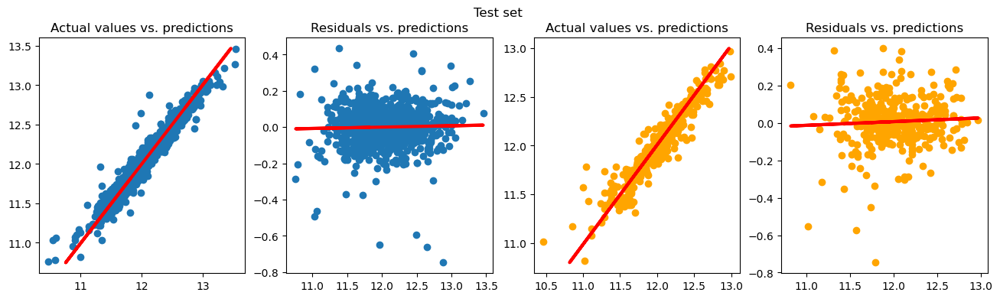

In [252]:
courbe(y_train, y_test, y_test_pred,y_train_pred)

## Model validation

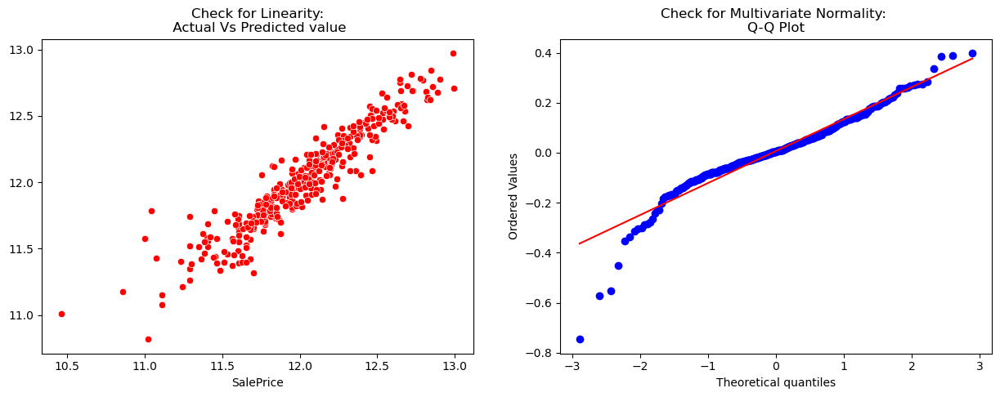

In [253]:
# Check for Linearity
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))
ax = axes[0]
g = sns.scatterplot(x=y_test, y=y_test_pred, ax=ax, color='r')
ax.set_title('Check for Linearity:\n Actual Vs Predicted value')

# Check for Residual normality & mean
ax = axes[1]
residus = y_test - y_test_pred
_, (_, _, r)= sp.stats.probplot(residus, fit=True,plot=ax)
ax.set_title('Check for Multivariate Normality: \nQ-Q Plot');

In [254]:
# Check for Multicollinearity
# Variance Inflation Factor (VIF)
R_square_test = mean_squared_error(y_test, y_test_pred, squared=True)
VIF = 1/(1- R_square_test)
VIF

1.0177045752992817

## Parameters tuning

In [255]:

param_grid = {
    "preprocessor__num__imputer__strategy": ["mean", "median"],
    "preprocessor__cat_nom__imputer2__strategy": ["most_frequent", "constant"],
    "preprocessor__cat_ord__imputer3__strategy": ["most_frequent", "constant"],
    "regressor__fit_intercept": [True, False],
    "regressor__alpha" : [0.5,1,2,3,4,5]
}

grid_search = GridSearchCV(reg, param_grid, cv=10, scoring="neg_root_mean_squared_error", return_train_score=True) # r2
# you can see the list of key for scoring: sorted(sklearn.metrics.SCORERS.keys())
grid_search

GridSearchCV(cv=10, error_score=nan,
             estimator=Pipeline(memory=None,
                                steps=[('preprocessor',
                                        ColumnTransformer(n_jobs=None,
                                                          remainder='drop',
                                                          sparse_threshold=0.3,
                                                          transformer_weights=None,
                                                          transformers=[('num',
                                                                         Pipeline(memory=None,
                                                                                  steps=[('imputer',
                                                                                          SimpleImputer(add_indicator=False,
                                                                                                        copy=True,
                                                                                                        fill_value=None,
                                                                                                        keep_empty_features=False,
                                                                                                        missing_values=nan,
                                                                                                        str...
             param_grid={'preprocessor__cat_nom__imputer2__strategy': ['most_frequent',
                                                                       'constant'],
                         'preprocessor__cat_ord__imputer3__strategy': ['most_frequent',
                                                                       'constant'],
                         'preprocessor__num__imputer__strategy': ['mean',
                                                                  'median'],
                         'regressor__alpha': [0.5, 1, 2, 3, 4, 5],
                         'regressor__fit_intercept': [True, False]},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
             scoring='neg_root_mean_squared_error', verbose=0)

In [ ]:
grid_search.fit(X_train, y_train)

best_params = grid_search.best_params_
print(f"Best params: {best_params}")

Best params: {'preprocessor__cat_nom__imputer2__strategy': 'constant', 'preprocessor__cat_ord__imputer3__strategy': 'most_frequent', 'preprocessor__num__imputer__strategy': 'mean', 'regressor__alpha': 5, 'regressor__fit_intercept': True}


In [543]:
grid_cv_results = grid_search.cv_results_
for group in ["train", "test"]:
    mean_score = round(100 * grid_cv_results[f'mean_{group}_score'].mean(), 2)
    mean_std_score = round(grid_cv_results[f'std_{group}_score'].mean(), 2)
    print(f"{group}====================\nMean score (std): {mean_score} ({mean_std_score})\n")

train====================
Mean score (std): 92.92 (0.0)

test====================
Mean score (std): 84.26 (0.1)



In [544]:
print(f"Internal CV score: {grid_search.best_score_: .3f}")

Internal CV score:  0.855


In [545]:
cv_results = pd.DataFrame(grid_cv_results)
cv_results = cv_results.sort_values("mean_test_score", ascending=False)
cv_results[["mean_train_score", "std_train_score",
            "mean_test_score", "std_test_score",
            "mean_fit_time", "std_fit_time",
            "mean_score_time", "std_score_time"
           ]]

,mean_train_score,std_train_score,mean_test_score,std_test_score,mean_fit_time,std_fit_time,mean_score_time,std_score_time
34,0.916285,0.003964,0.851739,0.091037,0.036640,0.006774,0.011218,0.006079
10,0.916285,0.003964,0.851739,0.091037,0.037078,0.007022,0.010490,0.006998
94,0.916317,0.003956,0.851724,0.091007,0.039907,0.007220,0.010345,0.007710
70,0.916317,0.003956,0.851724,0.091007,0.040543,0.006592,0.010723,0.007123
58,0.916307,0.003988,0.851689,0.091021,0.045052,0.007957,0.009818,0.006395
...,...,...,...,...,...,...,...,...
59,-0.370044,0.067308,-0.676844,0.397473,0.034904,0.007790,0.007310,0.006206
81,-0.369829,0.067358,-0.676939,0.397531,0.030746,0.001857,0.015669,0.000144
57,-0.369829,0.067358,-0.676939,0.397531,0.035872,0.006177,0.005703,0.006797
11,-0.370366,0.067852,-0.677854,0.399070,0.031562,0.005859,0.007604,0.007626


### COMPARAISONS DES PERFORMANCES

In [257]:
regb = grid_search.best_estimator_
regb.fit(X_train, y_train)
y_test_predg = regb.predict(X_test)
y_train_predg = regb.predict(X_train)

In [258]:
# get performance 
perf = get_all_performances(value_train=(y_train, y_train_predg),
                     values_test=(y_test, y_test_predg),
                     metrics=METRICS
                    )
perf

,metric,train,test
0,r2_score,0.927659,0.896500
1,mean_squared_error,0.011635,0.016058
2,RMSE,0.107865,0.126721
3,mean_absolute_percentage_error,0.006166,0.007483
4,max_error,0.943597,0.736996


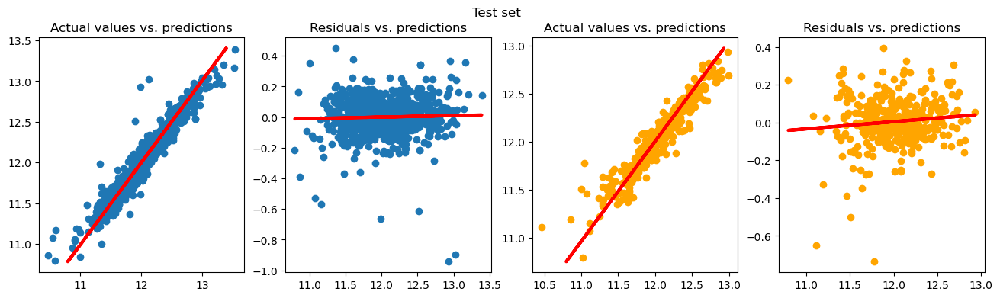

In [259]:
courbe(y_train, y_test, y_test_predg,y_train_predg)

In [260]:
# get performances in train & test
perf_ridge

,metric,train,test
0,r2_score,0.938141,0.887873
1,mean_squared_error,0.009949,0.017397
2,RMSE,0.099745,0.131896
3,mean_absolute_percentage_error,0.005843,0.007754
4,max_error,0.747318,0.746070


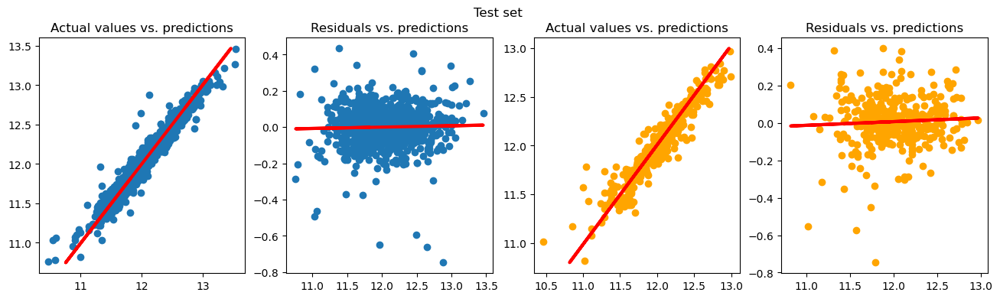

In [261]:
courbe(y_train, y_test, y_test_pred,y_train_pred)

In [262]:
reg_estimator = reg["regressor"]

## CROSS VALIDATION

In [263]:
#cross validation only
cv_results = cross_validate(regb,
                            X_train, y_train,
                            cv=5,
                            scoring=('r2', 'neg_mean_squared_error'),
                            return_train_score=True)
pd.DataFrame(cv_results)

,fit_time,score_time,test_r2,train_r2,test_neg_mean_squared_error,train_neg_mean_squared_error
0,0.043213,0.017982,0.906281,0.924938,-0.014807,-0.012033
1,0.048517,0.021981,0.893394,0.928270,-0.017555,-0.011466
2,0.045683,0.015806,0.851862,0.932537,-0.025109,-0.010647
3,0.038352,0.014533,0.721788,0.939250,-0.038117,-0.010132
4,0.037097,0.015996,0.868851,0.934836,-0.022061,-0.010360


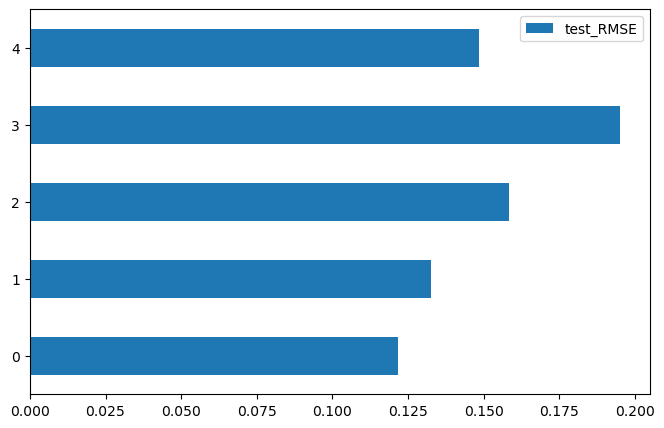

In [264]:
RMSE=np.sqrt(-cv_results["test_neg_mean_squared_error"]) 
RMSE = pd.DataFrame(RMSE)
RMSE.columns=['test_RMSE']
RMSE
RMSE[['test_RMSE']].plot(kind="barh", figsize=(8, 5));

In [267]:
mean_RMSE_ridge =-cv_results['test_neg_mean_squared_error'].mean()
mean_RMSE_ridge=np.sqrt(mean_RMSE_ridge)
mean_RMSE_ridge

0.15339449033665634

In [265]:
#cross validation only
cv_results2 = cross_validate(reg,
                            X_train, y_train,
                            cv=5,
                            scoring=('r2', 'neg_mean_squared_error'),
                            return_train_score=True)
pd.DataFrame(cv_results2)

,fit_time,score_time,test_r2,train_r2,test_neg_mean_squared_error,train_neg_mean_squared_error
0,0.040700,0.015516,0.901961,0.938186,-0.015489,-0.009909
1,0.051209,0.021015,0.897578,0.939301,-0.016866,-0.009703
2,0.077232,0.020696,0.853106,0.942420,-0.024898,-0.009087
3,0.074961,0.023354,0.715456,0.946369,-0.038985,-0.008945
4,0.047456,0.019989,0.855671,0.946817,-0.024278,-0.008455


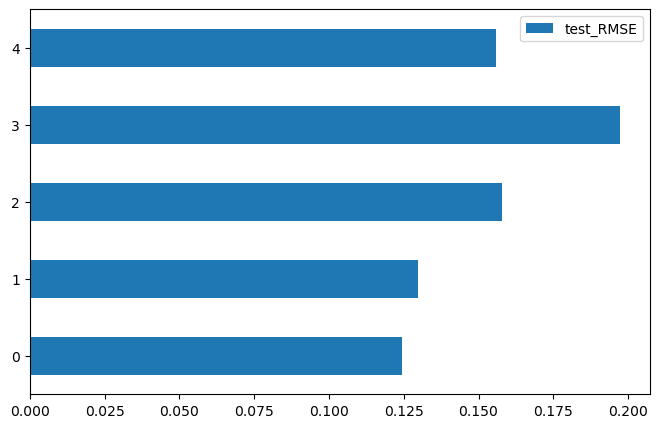

In [268]:
RMSE=np.sqrt(-cv_results2["test_neg_mean_squared_error"]) 
RMSE = pd.DataFrame(RMSE)
RMSE.columns=['test_RMSE']
RMSE
RMSE[['test_RMSE']].plot(kind="barh", figsize=(8, 5));

In [266]:
mean_RMSE_ridge =-cv_results2['test_neg_mean_squared_error'].mean()
mean_RMSE_ridge=np.sqrt(mean_RMSE_ridge)
mean_RMSE_ridge

0.1552523097914266

Le modèle obtenu à partir du hyparameters tuning sera maintenu car présentant de meilleures performances lors du cross validation.

In [269]:
reg = regb
perf_ridge = perf
mean_RMSE_ridge =-cv_results['test_neg_mean_squared_error'].mean()
mean_RMSE_ridge=np.sqrt(mean_RMSE_ridge)
mean_RMSE_ridge

0.15339449033665634

## FEATURE IMPORTANCE

In [1213]:
new_cols_nom = reg.named_steps["preprocessor"].named_transformers_["cat_nom"].named_steps["OHE"].get_feature_names_out(nom_X.columns)
cols_ord = ord_X.columns
all_cols = np.concatenate([numerical_features,cols_ord,new_cols_nom])
all_cols

array(['LotFrontage', 'LotArea', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2',
       'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea',
       'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath',
       'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces',
       'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF',
       'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal',
       'PartBsmtUnfSF', 'Age', 'Age_GarageYrBlt', 'LandContour',
       'Utilities', 'LandSlope', 'LotShape', 'HouseStyle', 'OverallQual',
       'OverallCond', 'ExterQual', 'ExterCond', 'BsmtQual', 'BsmtCond',
       'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'HeatingQC',
       'KitchenQual', 'Functional', 'FireplaceQu', 'GarageQual',
       'GarageFinish', 'GarageCond', 'PavedDrive', 'PoolQC', 'Fence',
       'MSSubClass_20', 'MSSubClass_30', 'MSSubClass_40', 'MSSubClass_45',
       'MSSubClass_50', 'MSSubClass_60', 'MSSubClass_70', 'MSSubClass_75',
       'MSSubCl

In [1214]:
# model_features = all_cols[mask]
model_features = all_cols
model_features

array(['LotFrontage', 'LotArea', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2',
       'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea',
       'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath',
       'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces',
       'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF',
       'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal',
       'PartBsmtUnfSF', 'Age', 'Age_GarageYrBlt', 'LandContour',
       'Utilities', 'LandSlope', 'LotShape', 'HouseStyle', 'OverallQual',
       'OverallCond', 'ExterQual', 'ExterCond', 'BsmtQual', 'BsmtCond',
       'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'HeatingQC',
       'KitchenQual', 'Functional', 'FireplaceQu', 'GarageQual',
       'GarageFinish', 'GarageCond', 'PavedDrive', 'PoolQC', 'Fence',
       'MSSubClass_20', 'MSSubClass_30', 'MSSubClass_40', 'MSSubClass_45',
       'MSSubClass_50', 'MSSubClass_60', 'MSSubClass_70', 'MSSubClass_75',
       'MSSubCl

In [1215]:
reg_estimator = reg.named_steps["regressor"]

In [1216]:
model_features = get_input_features(model_pipeline=reg, cat_step_name="cat_nom")
model_features

['LotFrontage',
 'LotArea',
 'MasVnrArea',
 'BsmtFinSF1',
 'BsmtFinSF2',
 'TotalBsmtSF',
 '1stFlrSF',
 '2ndFlrSF',
 'LowQualFinSF',
 'GrLivArea',
 'BsmtFullBath',
 'BsmtHalfBath',
 'FullBath',
 'HalfBath',
 'BedroomAbvGr',
 'KitchenAbvGr',
 'TotRmsAbvGrd',
 'Fireplaces',
 'GarageCars',
 'GarageArea',
 'WoodDeckSF',
 'OpenPorchSF',
 'EnclosedPorch',
 '3SsnPorch',
 'ScreenPorch',
 'PoolArea',
 'MiscVal',
 'PartBsmtUnfSF',
 'Age',
 'Age_GarageYrBlt',
 'MSSubClass_20',
 'MSSubClass_30',
 'MSSubClass_40',
 'MSSubClass_45',
 'MSSubClass_50',
 'MSSubClass_60',
 'MSSubClass_70',
 'MSSubClass_75',
 'MSSubClass_80',
 'MSSubClass_85',
 'MSSubClass_90',
 'MSSubClass_120',
 'MSSubClass_160',
 'MSSubClass_180',
 'MSSubClass_190',
 'MSZoning_C (all)',
 'MSZoning_FV',
 'MSZoning_RH',
 'MSZoning_RL',
 'MSZoning_RM',
 'Street_Grvl',
 'Street_Pave',
 'Alley_Grvl',
 'Alley_No alley access',
 'Alley_Pave',
 'LotConfig_Corner',
 'LotConfig_CulDSac',
 'LotConfig_FR2',
 'LotConfig_FR3',
 'LotConfig_Inside',
 

In [1217]:
df_feature_importance = pd.DataFrame(reg_estimator.coef_, columns=["coef"], index=model_features)
print(f"Shape: {df_feature_importance.shape}")
df_feature_importance.head()

Shape: (233, 1)


,coef
LotFrontage,-0.007839
LotArea,0.020676
MasVnrArea,0.002536
BsmtFinSF1,-0.050687
BsmtFinSF2,-0.013354


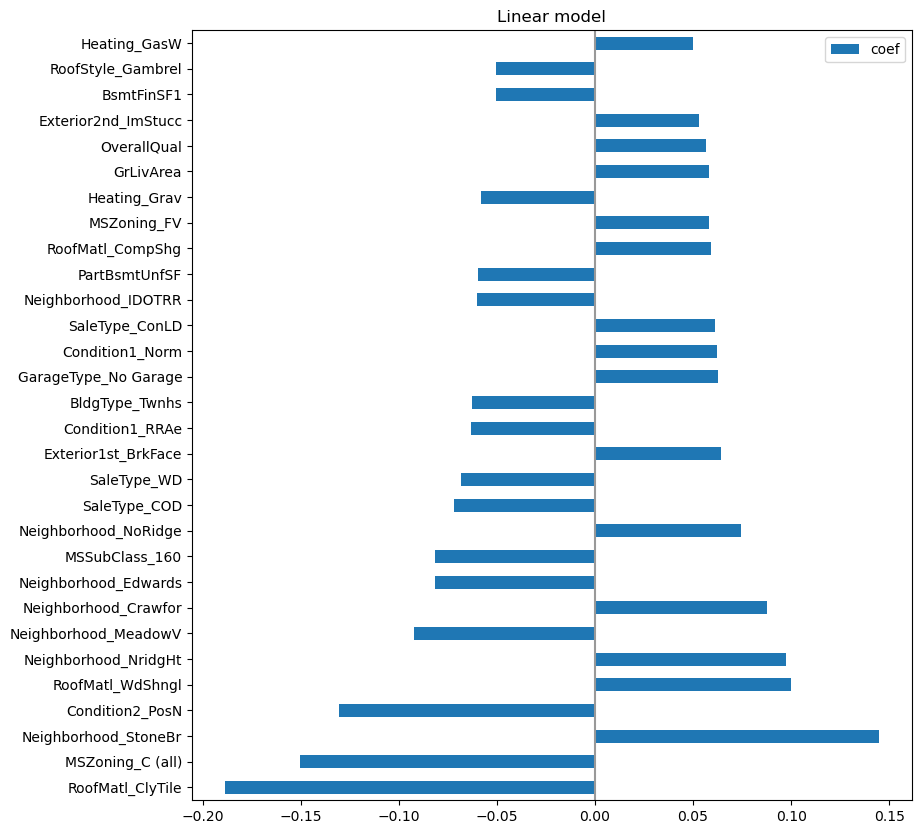

In [1218]:
# top30 most important features
(df_feature_importance
 .sort_values("coef", key=lambda v: abs(v), ascending=False)
 .head(30)
 .plot(kind="barh", figsize=(12, 10))
)
plt.title("Linear model")
plt.axvline(x=0, color='.6')
plt.subplots_adjust(left=.3);

# REGRESSION ELASTICNET

## Pipeline

In [270]:
from sklearn.linear_model import ElasticNet
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OrdinalEncoder

ord_categories =list(labels.values())
numerical_features = X.select_dtypes(include = 'number').columns
numeric_transformer = Pipeline(steps=[("imputer", SimpleImputer(strategy="median")),
                                      ("scaler", StandardScaler())]
                              )

nominal_transformer = Pipeline(steps = [("imputer2",SimpleImputer(strategy="constant", fill_value="missing")),
                                         ("OHE",OneHotEncoder(handle_unknown="ignore"))]
                                       )
ordinal_transformer = Pipeline(steps = [("imputer3",SimpleImputer(strategy="constant")),
                                          ("OE", OrdinalEncoder(categories = ord_categories, handle_unknown='error'))]
                                       )

categorical_pipeline = Pipeline([
    ("imputer", SimpleImputer(strategy="most_frequent")),
    ("encoder", OneHotEncoder(sparse=True, handle_unknown="ignore"))
])

preprocessor = ColumnTransformer(
    transformers=[
        ("num", numeric_transformer, numerical_features),
        ("cat_nom", nominal_transformer, nom_X.columns),
        ("cat_ord", ordinal_transformer, ord_X.columns),
    ]
)

# Now we have a full prediction pipeline.
reg = Pipeline(
    steps=[("preprocessor", preprocessor),("regressor", ElasticNet(alpha = 3, l1_ratio=0.01))]
)
reg

Pipeline(memory=None,
         steps=[('preprocessor',
                 ColumnTransformer(n_jobs=None, remainder='drop',
                                   sparse_threshold=0.3,
                                   transformer_weights=None,
                                   transformers=[('num',
                                                  Pipeline(memory=None,
                                                           steps=[('imputer',
                                                                   SimpleImputer(add_indicator=False,
                                                                                 copy=True,
                                                                                 fill_value=None,
                                                                                 keep_empty_features=False,
                                                                                 missing_values=nan,
                                                                                 strategy='median',
                                                                                 verbose='deprecated')),
                                                                  ('scale...
       'KitchenQual', 'Functional', 'FireplaceQu', 'GarageQual',
       'GarageFinish', 'GarageCond', 'PavedDrive', 'PoolQC', 'Fence'],
      dtype='object'))],
                                   verbose=False,
                                   verbose_feature_names_out=True)),
                ('regressor',
                 ElasticNet(alpha=3, copy_X=True, fit_intercept=True,
                            l1_ratio=0.01, max_iter=1000, positive=False,
                            precompute=False, random_state=None,
                            selection='cyclic', tol=0.0001,
                            warm_start=False))],
         verbose=False)

## Fitting

In [271]:
X_train, X_test, y_train, y_test = train_test_split(X, log_Y, test_size=0.25, random_state=23)

In [272]:
reg.fit(X_train, y_train)

Pipeline(memory=None,
         steps=[('preprocessor',
                 ColumnTransformer(n_jobs=None, remainder='drop',
                                   sparse_threshold=0.3,
                                   transformer_weights=None,
                                   transformers=[('num',
                                                  Pipeline(memory=None,
                                                           steps=[('imputer',
                                                                   SimpleImputer(add_indicator=False,
                                                                                 copy=True,
                                                                                 fill_value=None,
                                                                                 keep_empty_features=False,
                                                                                 missing_values=nan,
                                                                                 strategy='median',
                                                                                 verbose='deprecated')),
                                                                  ('scale...
       'KitchenQual', 'Functional', 'FireplaceQu', 'GarageQual',
       'GarageFinish', 'GarageCond', 'PavedDrive', 'PoolQC', 'Fence'],
      dtype='object'))],
                                   verbose=False,
                                   verbose_feature_names_out=True)),
                ('regressor',
                 ElasticNet(alpha=3, copy_X=True, fit_intercept=True,
                            l1_ratio=0.01, max_iter=1000, positive=False,
                            precompute=False, random_state=None,
                            selection='cyclic', tol=0.0001,
                            warm_start=False))],
         verbose=False)

## Model evaluation

In [275]:
# sklearn regression module
y_test_pred = reg.predict(X_test)
y_train_pred = reg.predict(X_train)

In [276]:
def get_performances(real_value, estimated_value, metrics):
    perfs = []
    for metric_func in metrics:
        perfs.append((metric_func.__name__, metric_func(real_value, estimated_value)))
    return pd.DataFrame(perfs, columns=["metric", "value"])


def get_all_performances(value_train, values_test, metrics):
    test_perfs = []
    train_perfs = []
    metric_names = []
    for metric_func in metrics:
        metric_name = metric_func.__name__
        metric_names.append(metric_name)
        train_perfs.append(metric_func(*value_train))
        test_perfs.append(metric_func(*values_test))
    perfs = {"metric": metric_names, "train": train_perfs, "test": test_perfs,}
    return pd.DataFrame(perfs)
def RMSE(predictions, targets):
    return np.sqrt(np.mean((predictions - targets) ** 2))

In [277]:
METRICS = [r2_score,
           mean_squared_error,
           RMSE,
           mean_absolute_percentage_error,
           max_error,
          ]
# get performance on single set
get_performances(real_value=y_test, estimated_value=y_test_pred, metrics=METRICS)

,metric,value
0,r2_score,0.746053
1,mean_squared_error,0.039400
2,RMSE,0.198494
3,mean_absolute_percentage_error,0.012079
4,max_error,1.148683


In [278]:
# get performances in train & test
perf_elasticnet = get_all_performances(value_train=(y_train, y_train_pred),
                     values_test=(y_test, y_test_pred),
                     metrics=METRICS
                    )
RMSE_elasticnet = perf_elasticnet.iloc[2, 2]
print(RMSE_elasticnet)
perf_elasticnet

0.1984941681767396


,metric,train,test
0,r2_score,0.746074,0.746053
1,mean_squared_error,0.040839,0.039400
2,RMSE,0.202087,0.198494
3,mean_absolute_percentage_error,0.012020,0.012079
4,max_error,1.269274,1.148683


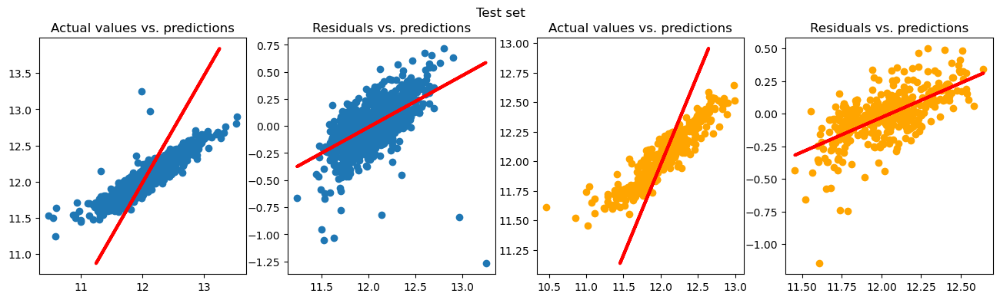

In [279]:
courbe(y_train, y_test, y_test_pred,y_train_pred)

## Model validation

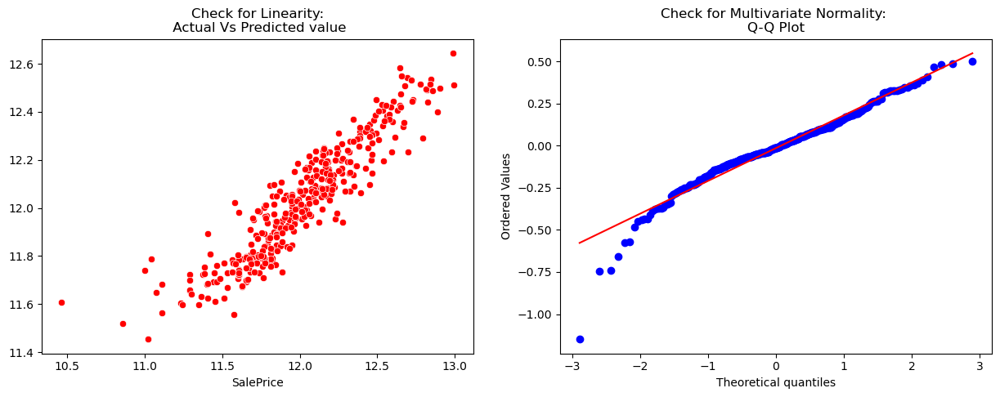

In [280]:
# Check for Linearity
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))
ax = axes[0]
g = sns.scatterplot(x=y_test, y=y_test_pred, ax=ax, color='r')
ax.set_title('Check for Linearity:\n Actual Vs Predicted value')

# Check for Residual normality & mean
ax = axes[1]
residus = y_test - y_test_pred
_, (_, _, r)= sp.stats.probplot(residus, fit=True,plot=ax)
ax.set_title('Check for Multivariate Normality: \nQ-Q Plot');

In [281]:
# Check for Multicollinearity
# Variance Inflation Factor (VIF)
R_square_test = mean_squared_error(y_test, y_test_pred, squared=True)
VIF = 1/(1- R_square_test)
VIF

1.0410159609889051

## Parameters tuning

In [282]:

param_grid = {
    "preprocessor__num__imputer__strategy": ["mean", "median"],
    "preprocessor__cat_nom__imputer2__strategy": ["most_frequent", "constant"],
    "preprocessor__cat_ord__imputer3__strategy": ["most_frequent", "constant"],
    "regressor__fit_intercept": [True, False],
    "regressor__alpha" : [0.5,1,3,4,5],
     "regressor__l1_ratio" : [0.05,0.01,0.001,0.1,0.5]
}

grid_search = GridSearchCV(reg, param_grid, cv=5, scoring="neg_root_mean_squared_error", return_train_score=True) # r2
# you can see the list of key for scoring: sorted(sklearn.metrics.SCORERS.keys())
grid_search

GridSearchCV(cv=5, error_score=nan,
             estimator=Pipeline(memory=None,
                                steps=[('preprocessor',
                                        ColumnTransformer(n_jobs=None,
                                                          remainder='drop',
                                                          sparse_threshold=0.3,
                                                          transformer_weights=None,
                                                          transformers=[('num',
                                                                         Pipeline(memory=None,
                                                                                  steps=[('imputer',
                                                                                          SimpleImputer(add_indicator=False,
                                                                                                        copy=True,
                                                                                                        fill_value=None,
                                                                                                        keep_empty_features=False,
                                                                                                        missing_values=nan,
                                                                                                        stra...
                         'preprocessor__cat_ord__imputer3__strategy': ['most_frequent',
                                                                       'constant'],
                         'preprocessor__num__imputer__strategy': ['mean',
                                                                  'median'],
                         'regressor__alpha': [0.5, 1, 3, 4, 5],
                         'regressor__fit_intercept': [True, False],
                         'regressor__l1_ratio': [0.05, 0.01, 0.001, 0.1, 0.5]},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
             scoring='neg_root_mean_squared_error', verbose=0)

In [283]:
grid_search.fit(X_train, y_train)

GridSearchCV(cv=5, error_score=nan,
             estimator=Pipeline(memory=None,
                                steps=[('preprocessor',
                                        ColumnTransformer(n_jobs=None,
                                                          remainder='drop',
                                                          sparse_threshold=0.3,
                                                          transformer_weights=None,
                                                          transformers=[('num',
                                                                         Pipeline(memory=None,
                                                                                  steps=[('imputer',
                                                                                          SimpleImputer(add_indicator=False,
                                                                                                        copy=True,
                                                                                                        fill_value=None,
                                                                                                        keep_empty_features=False,
                                                                                                        missing_values=nan,
                                                                                                        stra...
                         'preprocessor__cat_ord__imputer3__strategy': ['most_frequent',
                                                                       'constant'],
                         'preprocessor__num__imputer__strategy': ['mean',
                                                                  'median'],
                         'regressor__alpha': [0.5, 1, 3, 4, 5],
                         'regressor__fit_intercept': [True, False],
                         'regressor__l1_ratio': [0.05, 0.01, 0.001, 0.1, 0.5]},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
             scoring='neg_root_mean_squared_error', verbose=0)

In [1228]:
best_params = grid_search.best_params_
print(f"Best params: {best_params}")

Best params: {'preprocessor__cat_nom__imputer2__strategy': 'most_frequent', 'preprocessor__cat_ord__imputer3__strategy': 'most_frequent', 'preprocessor__num__imputer__strategy': 'median', 'regressor__alpha': 0.5, 'regressor__fit_intercept': True, 'regressor__l1_ratio': 0.001}


In [590]:
grid_cv_results = grid_search.cv_results_
for group in ["train", "test"]:
    mean_score = round(100 * grid_cv_results[f'mean_{group}_score'].mean(), 2)
    mean_std_score = round(grid_cv_results[f'std_{group}_score'].mean(), 2)
    print(f"{group}====================\nMean score (std): {mean_score} ({mean_std_score})\n")

train====================
Mean score (std): -142.82 (0.09)

test====================
Mean score (std): -159.15 (0.96)



In [1229]:
print(f"Internal CV score: {grid_search.best_score_: .3f}")

Internal CV score: -0.156


In [596]:
cv_results = pd.DataFrame(grid_cv_results)
cv_results = cv_results.sort_values("mean_test_score", ascending=False)
cv_results[["mean_train_score", "std_train_score",
            "mean_test_score", "std_test_score",
            "mean_fit_time", "std_fit_time",
            "mean_score_time", "std_score_time"
           ]]

,mean_train_score,std_train_score,mean_test_score,std_test_score,mean_fit_time,std_fit_time,mean_score_time,std_score_time
152,0.874267,0.007067,0.844466,0.088335,0.047269,0.002631,0.012766,0.001402
52,0.874267,0.007067,0.844466,0.088335,0.048132,0.003863,0.012601,0.001530
352,0.874264,0.007066,0.844464,0.088320,0.048109,0.003465,0.014158,0.001895
252,0.874264,0.007066,0.844464,0.088320,0.050731,0.002997,0.014446,0.001627
2,0.874250,0.007066,0.844454,0.088337,0.045670,0.002828,0.012280,0.001655
...,...,...,...,...,...,...,...,...
399,-7.865052,0.348238,-8.272294,3.516260,0.050147,0.003393,0.014648,0.002383
49,-7.865052,0.348238,-8.272294,3.516260,0.046152,0.002825,0.012720,0.001326
99,-7.865052,0.348238,-8.272294,3.516260,0.049180,0.003741,0.012842,0.001329
199,-7.865052,0.348238,-8.272294,3.516260,0.049853,0.004074,0.013909,0.001434


### COMPARAISONS DES PERFORMANCES

In [284]:
regb = grid_search.best_estimator_
regb.fit(X_train, y_train)
y_test_predg = regb.predict(X_test)
y_train_predg = regb.predict(X_train)

In [285]:
# get performance 
perf = get_all_performances(value_train=(y_train, y_train_predg),
                     values_test=(y_test, y_test_predg),
                     metrics=METRICS
                    )
perf

,metric,train,test
0,r2_score,0.872601,0.884603
1,mean_squared_error,0.020490,0.017904
2,RMSE,0.143143,0.133805
3,mean_absolute_percentage_error,0.007979,0.007828
4,max_error,1.652426,0.882484


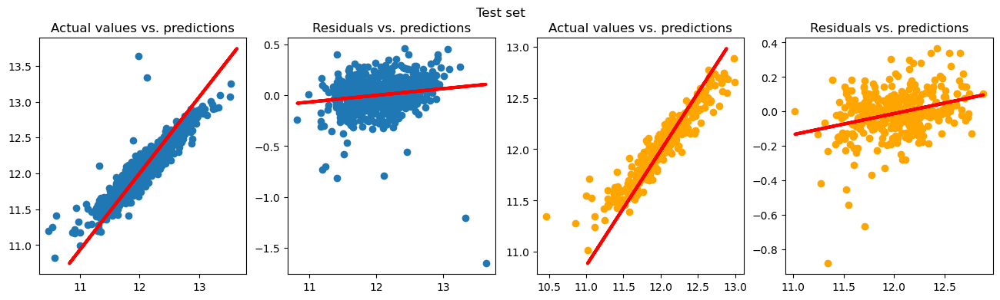

In [286]:
courbe(y_train, y_test, y_test_predg,y_train_predg)

In [287]:
# get performances in train & test
perf_elasticnet

,metric,train,test
0,r2_score,0.746074,0.746053
1,mean_squared_error,0.040839,0.039400
2,RMSE,0.202087,0.198494
3,mean_absolute_percentage_error,0.012020,0.012079
4,max_error,1.269274,1.148683


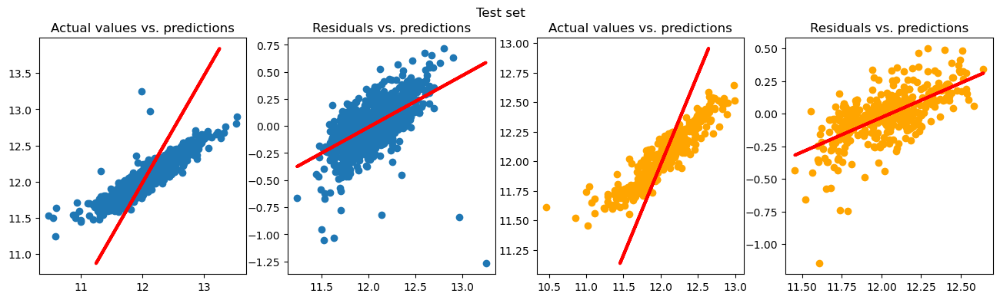

In [288]:
courbe(y_train, y_test, y_test_pred,y_train_pred)

In [289]:
reg_estimator = reg["regressor"]

## CROSS VALIDATION

In [290]:
#cross validation only
cv_results = cross_validate(regb,
                            X_train, y_train,
                            cv=5,
                            scoring=('r2', 'neg_mean_squared_error'),
                            return_train_score=True)
pd.DataFrame(cv_results)

,fit_time,score_time,test_r2,train_r2,test_neg_mean_squared_error,train_neg_mean_squared_error
0,0.046024,0.016545,0.892924,0.865501,-0.016917,-0.021561
1,0.060523,0.019528,0.877550,0.869437,-0.020165,-0.020870
2,0.046808,0.015110,0.839732,0.875940,-0.027165,-0.019579
3,0.043034,0.017405,0.731547,0.893650,-0.036780,-0.017738
4,0.044667,0.018126,0.865617,0.875586,-0.022605,-0.019780


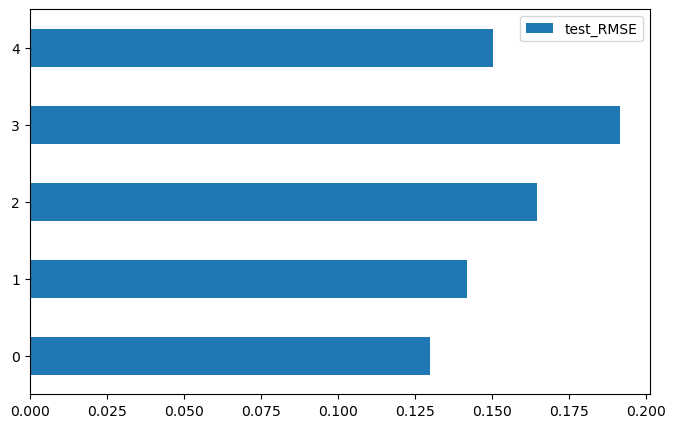

In [292]:
RMSE=np.sqrt(-cv_results["test_neg_mean_squared_error"]) 
RMSE = pd.DataFrame(RMSE)
RMSE.columns=['test_RMSE']
RMSE
RMSE[['test_RMSE']].plot(kind="barh", figsize=(8, 5));

In [293]:
mean_RMSE_elasticnet =-cv_results['test_neg_mean_squared_error'].mean()
mean_RMSE_elasticnet=np.sqrt(mean_RMSE_elasticnet)
mean_RMSE_elasticnet

0.1572461126670596

In [296]:
#cross validation only
cv_results2 = cross_validate(reg,
                            X_train, y_train,
                            cv=5,
                            scoring=('r2', 'neg_mean_squared_error'),
                            return_train_score=True)
pd.DataFrame(cv_results2)

,fit_time,score_time,test_r2,train_r2,test_neg_mean_squared_error,train_neg_mean_squared_error
0,0.039539,0.021980,0.771381,0.735088,-0.036119,-0.042467
1,0.047352,0.019341,0.742206,0.739034,-0.042452,-0.041714
2,0.059527,0.023513,0.691545,0.751679,-0.052282,-0.039189
3,0.053040,0.016480,0.714939,0.769066,-0.039056,-0.038517
4,0.049757,0.017828,0.760588,0.742242,-0.040273,-0.040979


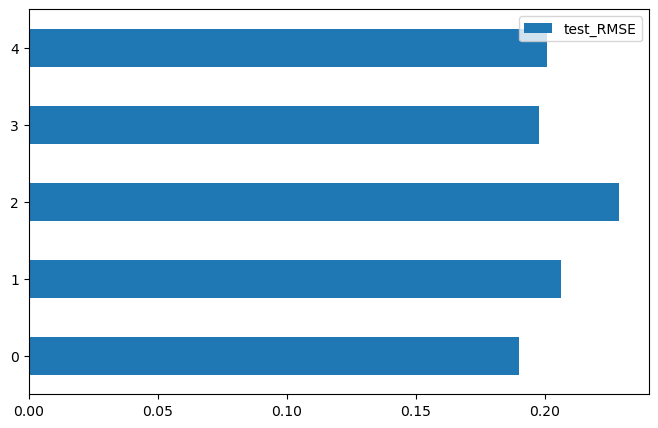

In [297]:
RMSE=np.sqrt(-cv_results2["test_neg_mean_squared_error"]) 
RMSE = pd.DataFrame(RMSE)
RMSE.columns=['test_RMSE']
RMSE
RMSE[['test_RMSE']].plot(kind="barh", figsize=(8, 5));

In [295]:
mean_RMSE_elasticnet =-cv_results2['test_neg_mean_squared_error'].mean()
mean_RMSE_elasticnet=np.sqrt(mean_RMSE_elasticnet)
mean_RMSE_elasticnet

0.20502773127927637

Le modèle obtenu à partir du hyparameters tuning sera maintenu car présentant de meilleures performances.

In [298]:
reg = regb
perf_elasticnet = perf
mean_RMSE_elasticnet =-cv_results['test_neg_mean_squared_error'].mean()
mean_RMSE_elasticnet=np.sqrt(mean_RMSE_elasticnet)
mean_RMSE_elasticnet

0.1572461126670596

## FEATURE IMPORTANCE

In [299]:
new_cols_nom = reg.named_steps["preprocessor"].named_transformers_["cat_nom"].named_steps["OHE"].get_feature_names_out(nom_X.columns)
cols_ord = ord_X.columns
all_cols = np.concatenate([numerical_features,cols_ord,new_cols_nom])
all_cols

array(['LotFrontage', 'LotArea', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2',
       'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea',
       'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath',
       'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces',
       'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF',
       'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal',
       'PartBsmtUnfSF', 'Age', 'Age_GarageYrBlt', 'LandContour',
       'Utilities', 'LandSlope', 'LotShape', 'HouseStyle', 'OverallQual',
       'OverallCond', 'ExterQual', 'ExterCond', 'BsmtQual', 'BsmtCond',
       'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'HeatingQC',
       'KitchenQual', 'Functional', 'FireplaceQu', 'GarageQual',
       'GarageFinish', 'GarageCond', 'PavedDrive', 'PoolQC', 'Fence',
       'MSSubClass_20', 'MSSubClass_30', 'MSSubClass_40', 'MSSubClass_45',
       'MSSubClass_50', 'MSSubClass_60', 'MSSubClass_70', 'MSSubClass_75',
       'MSSubCl

In [300]:
# model_features = all_cols[mask]
model_features = all_cols
model_features

array(['LotFrontage', 'LotArea', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2',
       'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea',
       'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath',
       'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces',
       'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF',
       'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal',
       'PartBsmtUnfSF', 'Age', 'Age_GarageYrBlt', 'LandContour',
       'Utilities', 'LandSlope', 'LotShape', 'HouseStyle', 'OverallQual',
       'OverallCond', 'ExterQual', 'ExterCond', 'BsmtQual', 'BsmtCond',
       'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'HeatingQC',
       'KitchenQual', 'Functional', 'FireplaceQu', 'GarageQual',
       'GarageFinish', 'GarageCond', 'PavedDrive', 'PoolQC', 'Fence',
       'MSSubClass_20', 'MSSubClass_30', 'MSSubClass_40', 'MSSubClass_45',
       'MSSubClass_50', 'MSSubClass_60', 'MSSubClass_70', 'MSSubClass_75',
       'MSSubCl

In [301]:
reg_estimator = reg.named_steps["regressor"]

In [302]:
model_features = get_input_features(model_pipeline=reg, cat_step_name="cat_nom")
model_features

['LotFrontage',
 'LotArea',
 'MasVnrArea',
 'BsmtFinSF1',
 'BsmtFinSF2',
 'TotalBsmtSF',
 '1stFlrSF',
 '2ndFlrSF',
 'LowQualFinSF',
 'GrLivArea',
 'BsmtFullBath',
 'BsmtHalfBath',
 'FullBath',
 'HalfBath',
 'BedroomAbvGr',
 'KitchenAbvGr',
 'TotRmsAbvGrd',
 'Fireplaces',
 'GarageCars',
 'GarageArea',
 'WoodDeckSF',
 'OpenPorchSF',
 'EnclosedPorch',
 '3SsnPorch',
 'ScreenPorch',
 'PoolArea',
 'MiscVal',
 'PartBsmtUnfSF',
 'Age',
 'Age_GarageYrBlt',
 'MSSubClass_20',
 'MSSubClass_30',
 'MSSubClass_40',
 'MSSubClass_45',
 'MSSubClass_50',
 'MSSubClass_60',
 'MSSubClass_70',
 'MSSubClass_75',
 'MSSubClass_80',
 'MSSubClass_85',
 'MSSubClass_90',
 'MSSubClass_120',
 'MSSubClass_160',
 'MSSubClass_180',
 'MSSubClass_190',
 'MSZoning_C (all)',
 'MSZoning_FV',
 'MSZoning_RH',
 'MSZoning_RL',
 'MSZoning_RM',
 'Street_Grvl',
 'Street_Pave',
 'Alley_Grvl',
 'Alley_No alley access',
 'Alley_Pave',
 'LotConfig_Corner',
 'LotConfig_CulDSac',
 'LotConfig_FR2',
 'LotConfig_FR3',
 'LotConfig_Inside',
 

In [303]:
df_feature_importance = pd.DataFrame(reg_estimator.coef_, columns=["coef"], index=model_features)
print(f"Shape: {df_feature_importance.shape}")
df_feature_importance.head()

Shape: (231, 1)


,coef
LotFrontage,0.002286
LotArea,0.013417
MasVnrArea,0.007120
BsmtFinSF1,0.001639
BsmtFinSF2,0.002093


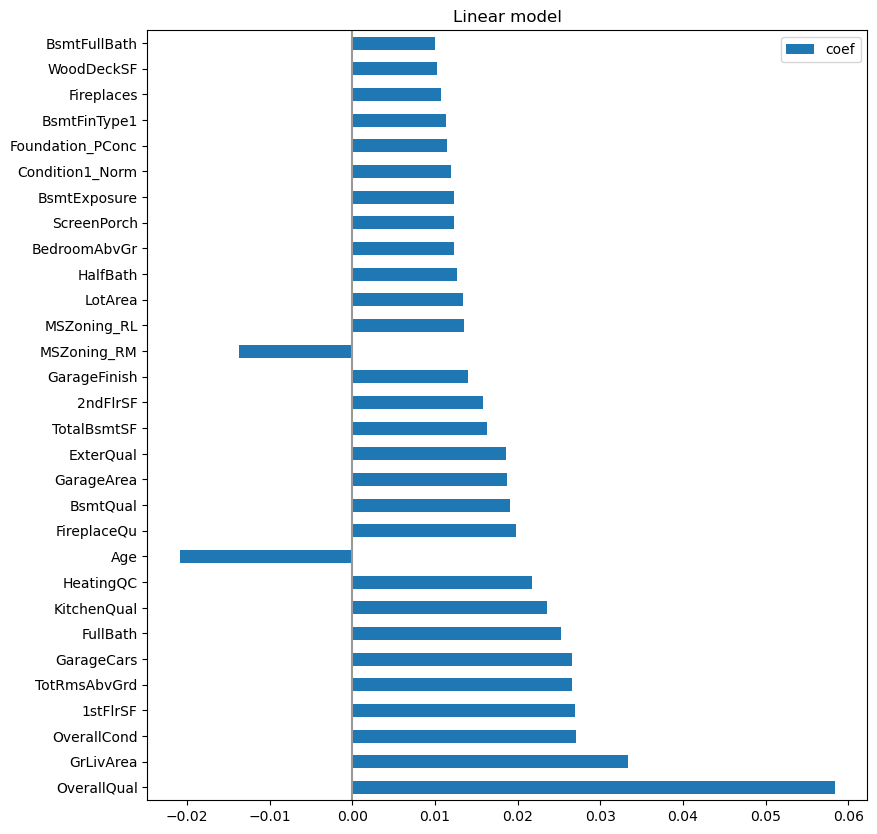

In [304]:
# top30 most important features
(df_feature_importance
 .sort_values("coef", key=lambda v: abs(v), ascending=False)
 .head(30)
 .plot(kind="barh", figsize=(12, 10))
)
plt.title("Linear model")
plt.axvline(x=0, color='.6')
plt.subplots_adjust(left=.3);

# DECISION TREE

## FILTER METHOD

In [378]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OrdinalEncoder

ord_categories =list(labelsfilt.values())
numerical_features = X_feature.select_dtypes(include = 'number').columns
numeric_transformer = Pipeline(steps=[("imputer", SimpleImputer(strategy="median")),
                                      ("scaler", StandardScaler())]
                              )

nominal_transformer = Pipeline(steps = [("imputer2",SimpleImputer(strategy="constant", fill_value="missing")),
                                         ("OHE",OneHotEncoder(handle_unknown="ignore"))]
                                       )
ordinal_transformer = Pipeline(steps = [("imputer3",SimpleImputer(strategy="constant")),
                                          ("OE", OrdinalEncoder(categories = ord_categories, handle_unknown='error'))]
                                       )

categorical_pipeline = Pipeline([
    ("imputer", SimpleImputer(strategy="most_frequent")),
    ("encoder", OneHotEncoder(sparse=True, handle_unknown="ignore"))
])

preprocessor = ColumnTransformer(
    transformers=[
        ("num", numeric_transformer, numerical_features),
        ("cat_nom", nominal_transformer, nomX.columns),
        ("cat_ord", ordinal_transformer, ordX.columns),
    ]
)

# Now we have a full prediction pipeline.
reg = Pipeline(
    steps=[("preprocessor", preprocessor),("regressor",DecisionTreeRegressor(random_state=23,criterion = 'squared_error',max_depth=5,min_samples_leaf=4))]
)
reg

Pipeline(memory=None,
         steps=[('preprocessor',
                 ColumnTransformer(n_jobs=None, remainder='drop',
                                   sparse_threshold=0.3,
                                   transformer_weights=None,
                                   transformers=[('num',
                                                  Pipeline(memory=None,
                                                           steps=[('imputer',
                                                                   SimpleImputer(add_indicator=False,
                                                                                 copy=True,
                                                                                 fill_value=None,
                                                                                 keep_empty_features=False,
                                                                                 missing_values=nan,
                                                                                 strategy='median',
                                                                                 verbose='deprecated')),
                                                                  ('scale...
       'GarageFinish', 'GarageCond', 'PavedDrive', 'PoolQC', 'Fence'],
      dtype='object'))],
                                   verbose=False,
                                   verbose_feature_names_out=True)),
                ('regressor',
                 DecisionTreeRegressor(ccp_alpha=0.0, criterion='squared_error',
                                       max_depth=5, max_features=None,
                                       max_leaf_nodes=None,
                                       min_impurity_decrease=0.0,
                                       min_samples_leaf=4, min_samples_split=2,
                                       min_weight_fraction_leaf=0.0,
                                       random_state=23, splitter='best'))],
         verbose=False)

## Fitting

In [379]:
X_train, X_test, y_train, y_test = train_test_split(X_feature, log_Y, test_size=0.25, random_state=23)

In [380]:
reg.fit(X_train, y_train)

Pipeline(memory=None,
         steps=[('preprocessor',
                 ColumnTransformer(n_jobs=None, remainder='drop',
                                   sparse_threshold=0.3,
                                   transformer_weights=None,
                                   transformers=[('num',
                                                  Pipeline(memory=None,
                                                           steps=[('imputer',
                                                                   SimpleImputer(add_indicator=False,
                                                                                 copy=True,
                                                                                 fill_value=None,
                                                                                 keep_empty_features=False,
                                                                                 missing_values=nan,
                                                                                 strategy='median',
                                                                                 verbose='deprecated')),
                                                                  ('scale...
       'GarageFinish', 'GarageCond', 'PavedDrive', 'PoolQC', 'Fence'],
      dtype='object'))],
                                   verbose=False,
                                   verbose_feature_names_out=True)),
                ('regressor',
                 DecisionTreeRegressor(ccp_alpha=0.0, criterion='squared_error',
                                       max_depth=5, max_features=None,
                                       max_leaf_nodes=None,
                                       min_impurity_decrease=0.0,
                                       min_samples_leaf=4, min_samples_split=2,
                                       min_weight_fraction_leaf=0.0,
                                       random_state=23, splitter='best'))],
         verbose=False)

## Model evaluation

In [381]:
# sklearn regression module
y_test_pred = reg.predict(X_test)
y_train_pred = reg.predict(X_train)

In [382]:
def get_performances(real_value, estimated_value, metrics):
    perfs = []
    for metric_func in metrics:
        perfs.append((metric_func.__name__, metric_func(real_value, estimated_value)))
    return pd.DataFrame(perfs, columns=["metric", "value"])


def get_all_performances(value_train, values_test, metrics):
    test_perfs = []
    train_perfs = []
    metric_names = []
    for metric_func in metrics:
        metric_name = metric_func.__name__
        metric_names.append(metric_name)
        train_perfs.append(metric_func(*value_train))
        test_perfs.append(metric_func(*values_test))
    perfs = {"metric": metric_names, "train": train_perfs, "test": test_perfs,}
    return pd.DataFrame(perfs)
def RMSE(predictions, targets):
    return np.sqrt(np.mean((predictions - targets) ** 2))

In [383]:
METRICS = [r2_score,
           mean_squared_error,
           RMSE,
           mean_absolute_percentage_error,
           max_error,
          ]
# get performance on single set
get_performances(real_value=y_test, estimated_value=y_test_pred, metrics=METRICS)

,metric,value
0,r2_score,0.770697
1,mean_squared_error,0.035576
2,RMSE,0.188617
3,mean_absolute_percentage_error,0.011493
4,max_error,0.818489


In [384]:
# get performances in train & test
perf_decisiontree = get_all_performances(value_train=(y_train, y_train_pred),
                     values_test=(y_test, y_test_pred),
                     metrics=METRICS
                    )
RMSE_decisiontree = perf_decisiontree.iloc[2, 2]
print(RMSE_decisiontree)
perf_decisiontree

0.18861705305578919


,metric,train,test
0,r2_score,0.844710,0.770697
1,mean_squared_error,0.024976,0.035576
2,RMSE,0.158037,0.188617
3,mean_absolute_percentage_error,0.009685,0.011493
4,max_error,1.005963,0.818489


## WRAPPER METHOD

In [371]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OrdinalEncoder

ord_categories =list(labels.values())
numerical_features = X_feature.select_dtypes(include = 'number').columns
numeric_transformer = Pipeline(steps=[("imputer", SimpleImputer(strategy="median")),
                                      ("scaler", StandardScaler())]
                              )

nominal_transformer = Pipeline(steps = [("imputer2",SimpleImputer(strategy="constant", fill_value="missing")),
                                         ("OHE",OneHotEncoder(handle_unknown="ignore"))]
                                       )
ordinal_transformer = Pipeline(steps = [("imputer3",SimpleImputer(strategy="constant")),
                                          ("OE", OrdinalEncoder(categories = ord_categories, handle_unknown='error'))]
                                       )

categorical_pipeline = Pipeline([
    ("imputer", SimpleImputer(strategy="most_frequent")),
    ("encoder", OneHotEncoder(sparse=True, handle_unknown="ignore"))
])

preprocessor = ColumnTransformer(
    transformers=[
        ("num", numeric_transformer, numerical_features),
        ("cat_nom", nominal_transformer, nom_X.columns),
        ("cat_ord", ordinal_transformer, ord_X.columns),
    ]
)

# Now we have a full prediction pipeline.
reg = Pipeline(
    steps=[("preprocessor", preprocessor),('feature_selection', RFE(DecisionTreeRegressor(),step=1)),("regressor",DecisionTreeRegressor(random_state=23,criterion = 'squared_error',max_depth=5,min_samples_leaf=4))]
)
reg

Pipeline(memory=None,
         steps=[('preprocessor',
                 ColumnTransformer(n_jobs=None, remainder='drop',
                                   sparse_threshold=0.3,
                                   transformer_weights=None,
                                   transformers=[('num',
                                                  Pipeline(memory=None,
                                                           steps=[('imputer',
                                                                   SimpleImputer(add_indicator=False,
                                                                                 copy=True,
                                                                                 fill_value=None,
                                                                                 keep_empty_features=False,
                                                                                 missing_values=nan,
                                                                                 strategy='median',
                                                                                 verbose='deprecated')),
                                                                  ('scale...
                                                     splitter='best'),
                     importance_getter='auto', n_features_to_select=None,
                     step=1, verbose=0)),
                ('regressor',
                 DecisionTreeRegressor(ccp_alpha=0.0, criterion='squared_error',
                                       max_depth=5, max_features=None,
                                       max_leaf_nodes=None,
                                       min_impurity_decrease=0.0,
                                       min_samples_leaf=4, min_samples_split=2,
                                       min_weight_fraction_leaf=0.0,
                                       random_state=23, splitter='best'))],
         verbose=False)

## Fitting

In [372]:
X_train, X_test, y_train, y_test = train_test_split(X, log_Y, test_size=0.25, random_state=23)

In [373]:
reg.fit(X_train, y_train)

Pipeline(memory=None,
         steps=[('preprocessor',
                 ColumnTransformer(n_jobs=None, remainder='drop',
                                   sparse_threshold=0.3,
                                   transformer_weights=None,
                                   transformers=[('num',
                                                  Pipeline(memory=None,
                                                           steps=[('imputer',
                                                                   SimpleImputer(add_indicator=False,
                                                                                 copy=True,
                                                                                 fill_value=None,
                                                                                 keep_empty_features=False,
                                                                                 missing_values=nan,
                                                                                 strategy='median',
                                                                                 verbose='deprecated')),
                                                                  ('scale...
                                                     splitter='best'),
                     importance_getter='auto', n_features_to_select=None,
                     step=1, verbose=0)),
                ('regressor',
                 DecisionTreeRegressor(ccp_alpha=0.0, criterion='squared_error',
                                       max_depth=5, max_features=None,
                                       max_leaf_nodes=None,
                                       min_impurity_decrease=0.0,
                                       min_samples_leaf=4, min_samples_split=2,
                                       min_weight_fraction_leaf=0.0,
                                       random_state=23, splitter='best'))],
         verbose=False)

## Model evaluation

In [374]:
# sklearn regression module
y_test_pred = reg.predict(X_test)
y_train_pred = reg.predict(X_train)

In [375]:
def get_performances(real_value, estimated_value, metrics):
    perfs = []
    for metric_func in metrics:
        perfs.append((metric_func.__name__, metric_func(real_value, estimated_value)))
    return pd.DataFrame(perfs, columns=["metric", "value"])


def get_all_performances(value_train, values_test, metrics):
    test_perfs = []
    train_perfs = []
    metric_names = []
    for metric_func in metrics:
        metric_name = metric_func.__name__
        metric_names.append(metric_name)
        train_perfs.append(metric_func(*value_train))
        test_perfs.append(metric_func(*values_test))
    perfs = {"metric": metric_names, "train": train_perfs, "test": test_perfs,}
    return pd.DataFrame(perfs)
def RMSE(predictions, targets):
    return np.sqrt(np.mean((predictions - targets) ** 2))

In [376]:
METRICS = [r2_score,
           mean_squared_error,
           RMSE,
           mean_absolute_percentage_error,
           max_error,
          ]
# get performance on single set
get_performances(real_value=y_test, estimated_value=y_test_pred, metrics=METRICS)

,metric,value
0,r2_score,0.770697
1,mean_squared_error,0.035576
2,RMSE,0.188617
3,mean_absolute_percentage_error,0.011493
4,max_error,0.818489


In [377]:
# get performances in train & test
perf_decisiontree = get_all_performances(value_train=(y_train, y_train_pred),
                     values_test=(y_test, y_test_pred),
                     metrics=METRICS
                    )
RMSE_decisiontree = perf_decisiontree.iloc[2, 2]
print(RMSE_decisiontree)
perf_decisiontree

0.18861705305578919


,metric,train,test
0,r2_score,0.844710,0.770697
1,mean_squared_error,0.024976,0.035576
2,RMSE,0.158037,0.188617
3,mean_absolute_percentage_error,0.009685,0.011493
4,max_error,1.005963,0.818489


## Parameters tuning

In [314]:

param_grid = {
    "preprocessor__num__imputer__strategy": ["mean", "median"],
    "preprocessor__cat_nom__imputer2__strategy": ["most_frequent", "constant"],
    "preprocessor__cat_ord__imputer3__strategy": ["most_frequent", "constant"],
    "preprocessor__cat_ord__imputer3__strategy": ["most_frequent", "constant"],
    "regressor__max_depth" : [1,3,5,7,9,11,12],
    "regressor__min_samples_leaf":[1,2,3,4,5,6,7,8,9,10],
}

grid_search = GridSearchCV(reg, param_grid, cv=10, scoring="neg_root_mean_squared_error", return_train_score=True) # r2
# you can see the list of key for scoring: sorted(sklearn.metrics.SCORERS.keys())
grid_search

GridSearchCV(cv=10, error_score=nan,
             estimator=Pipeline(memory=None,
                                steps=[('preprocessor',
                                        ColumnTransformer(n_jobs=None,
                                                          remainder='drop',
                                                          sparse_threshold=0.3,
                                                          transformer_weights=None,
                                                          transformers=[('num',
                                                                         Pipeline(memory=None,
                                                                                  steps=[('imputer',
                                                                                          SimpleImputer(add_indicator=False,
                                                                                                        copy=True,
                                                                                                        fill_value=None,
                                                                                                        keep_empty_features=False,
                                                                                                        missing_values=nan,
                                                                                                        str...
             param_grid={'preprocessor__cat_nom__imputer2__strategy': ['most_frequent',
                                                                       'constant'],
                         'preprocessor__cat_ord__imputer3__strategy': ['most_frequent',
                                                                       'constant'],
                         'preprocessor__num__imputer__strategy': ['mean',
                                                                  'median'],
                         'regressor__max_depth': [1, 3, 5, 7, 9, 11, 12],
                         'regressor__min_samples_leaf': [1, 2, 3, 4, 5, 6, 7, 8,
                                                         9, 10]},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
             scoring='neg_root_mean_squared_error', verbose=0)

In [315]:
grid_search.fit(X_train, y_train)

GridSearchCV(cv=10, error_score=nan,
             estimator=Pipeline(memory=None,
                                steps=[('preprocessor',
                                        ColumnTransformer(n_jobs=None,
                                                          remainder='drop',
                                                          sparse_threshold=0.3,
                                                          transformer_weights=None,
                                                          transformers=[('num',
                                                                         Pipeline(memory=None,
                                                                                  steps=[('imputer',
                                                                                          SimpleImputer(add_indicator=False,
                                                                                                        copy=True,
                                                                                                        fill_value=None,
                                                                                                        keep_empty_features=False,
                                                                                                        missing_values=nan,
                                                                                                        str...
             param_grid={'preprocessor__cat_nom__imputer2__strategy': ['most_frequent',
                                                                       'constant'],
                         'preprocessor__cat_ord__imputer3__strategy': ['most_frequent',
                                                                       'constant'],
                         'preprocessor__num__imputer__strategy': ['mean',
                                                                  'median'],
                         'regressor__max_depth': [1, 3, 5, 7, 9, 11, 12],
                         'regressor__min_samples_leaf': [1, 2, 3, 4, 5, 6, 7, 8,
                                                         9, 10]},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
             scoring='neg_root_mean_squared_error', verbose=0)

In [316]:
best_params = grid_search.best_params_
print(f"Best params: {best_params}")

Best params: {'preprocessor__cat_nom__imputer2__strategy': 'most_frequent', 'preprocessor__cat_ord__imputer3__strategy': 'most_frequent', 'preprocessor__num__imputer__strategy': 'mean', 'regressor__max_depth': 9, 'regressor__min_samples_leaf': 8}


In [832]:
grid_cv_results = grid_search.cv_results_
for group in ["train", "test"]:
    mean_score = round(100 * grid_cv_results[f'mean_{group}_score'].mean(), 2)
    mean_std_score = round(grid_cv_results[f'std_{group}_score'].mean(), 2)
    print(f"{group}====================\nMean score (std): {mean_score} ({mean_std_score})\n")

train====================
Mean score (std): -15.73 (0.0)

test====================
Mean score (std): -21.52 (0.02)



In [833]:
print(f"Internal CV score: {grid_search.best_score_: .3f}")

Internal CV score: -0.188


In [834]:
cv_results = pd.DataFrame(grid_cv_results)
cv_results = cv_results.sort_values("mean_test_score", ascending=False)
cv_results[["mean_train_score", "std_train_score",
            "mean_test_score", "std_test_score",
            "mean_fit_time", "std_fit_time",
            "mean_score_time", "std_score_time"
           ]]

,mean_train_score,std_train_score,mean_test_score,std_test_score,mean_fit_time,std_fit_time,mean_score_time,std_score_time
327,-0.129523,0.002477,-0.188459,0.019838,0.060450,0.005245,0.013397,0.004949
187,-0.129523,0.002477,-0.188459,0.019838,0.057585,0.007680,0.009810,0.007615
537,-0.129523,0.002477,-0.188459,0.019838,0.055929,0.007281,0.011042,0.007235
397,-0.129523,0.002477,-0.188459,0.019838,0.057639,0.007199,0.011185,0.008926
257,-0.129523,0.002477,-0.188459,0.019838,0.057584,0.007666,0.011849,0.006284
...,...,...,...,...,...,...,...,...
1,-0.295522,0.002448,-0.295312,0.021444,0.032507,0.005328,0.010911,0.006754
219,-0.295522,0.002448,-0.295312,0.021444,0.034133,0.006629,0.012305,0.007214
218,-0.295522,0.002448,-0.295312,0.021444,0.036089,0.007183,0.009432,0.007702
217,-0.295522,0.002448,-0.295312,0.021444,0.034535,0.006241,0.010951,0.007169


### COMPARAISONS DES PERFORMANCES

In [318]:
regb = grid_search.best_estimator_
regb.fit(X_train, y_train)
y_test_predg = regb.predict(X_test)
y_train_predg = regb.predict(X_train)

In [319]:
# get performance 
perf = get_all_performances(value_train=(y_train, y_train_predg),
                     values_test=(y_test, y_test_predg),
                     metrics=METRICS
                    )
perf

,metric,train,test
0,r2_score,0.900095,0.773589
1,mean_squared_error,0.016068,0.035128
2,RMSE,0.126759,0.187424
3,mean_absolute_percentage_error,0.007510,0.011608
4,max_error,0.908241,0.772581


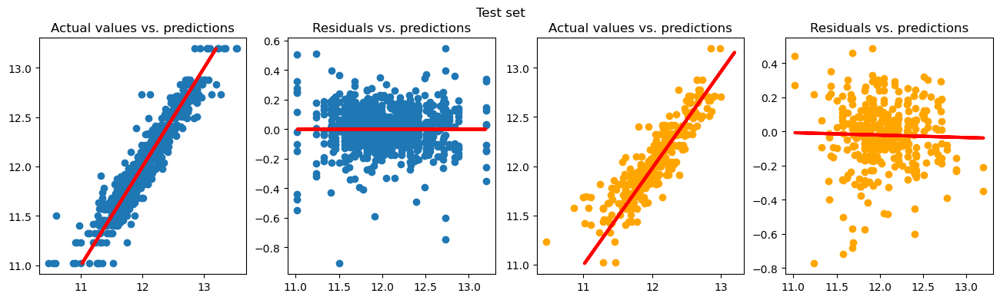

In [320]:
courbe(y_train, y_test, y_test_predg,y_train_predg)

In [321]:
# get performances in train & test
perf_decisiontree

,metric,train,test
0,r2_score,0.844710,0.770697
1,mean_squared_error,0.024976,0.035576
2,RMSE,0.158037,0.188617
3,mean_absolute_percentage_error,0.009685,0.011493
4,max_error,1.005963,0.818489


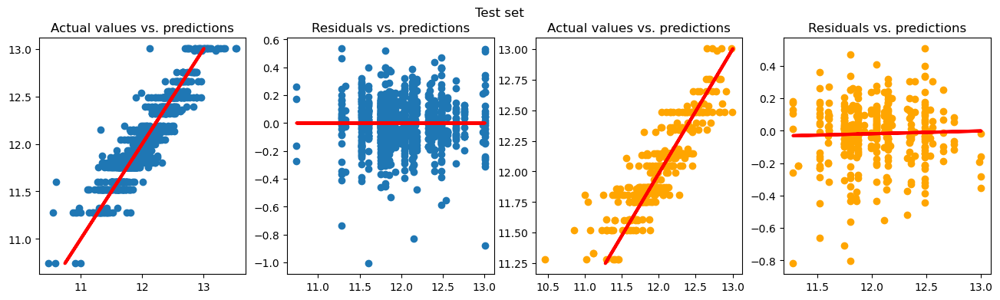

In [322]:
courbe(y_train, y_test, y_test_pred,y_train_pred)

In [323]:
reg_estimator = reg["regressor"]

## CROSS VALIDATION

In [324]:
#cross validation only
cv_results = cross_validate(regb,
                            X_train, y_train,
                            cv=5,
                            scoring=('r2', 'neg_mean_squared_error'),
                            return_train_score=True)
pd.DataFrame(cv_results)

,fit_time,score_time,test_r2,train_r2,test_neg_mean_squared_error,train_neg_mean_squared_error
0,0.058475,0.014470,0.806468,0.886516,-0.030576,-0.018192
1,0.057415,0.016025,0.777318,0.894589,-0.036670,-0.016850
2,0.050741,0.012563,0.768990,0.893526,-0.039155,-0.016803
3,0.050836,0.014163,0.685369,0.897982,-0.043107,-0.017015
4,0.054898,0.012640,0.773765,0.889967,-0.038056,-0.017493


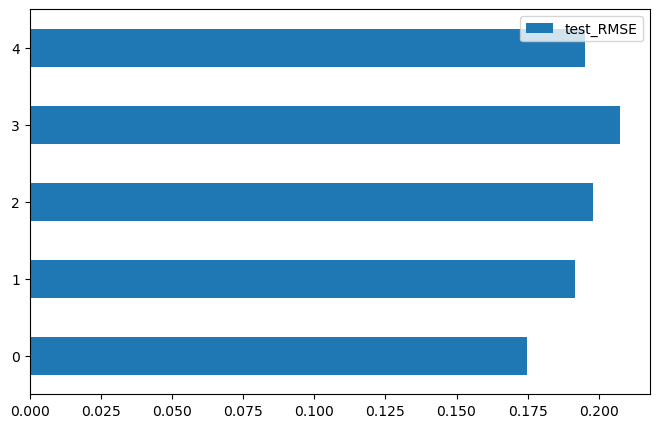

In [325]:
RMSE=np.sqrt(-cv_results["test_neg_mean_squared_error"]) 
RMSE = pd.DataFrame(RMSE)
RMSE.columns=['test_RMSE']
RMSE
RMSE[['test_RMSE']].plot(kind="barh", figsize=(8, 5));

In [326]:
reg = regb
perf_regressiontree = perf
mean_RMSE_elasticnet =-cv_results['test_neg_mean_squared_error'].mean()
mean_RMSE_elasticnet=np.sqrt(mean_RMSE_elasticnet)
mean_RMSE_elasticnet

0.1936824525573544

## FEATURE IMPORTANCE

In [327]:
def get_input_features(model_pipeline, cat_step_name):
    """ Get model feature names used in training
    
    """

    all_feature_names = []

    for step_name, pipe_trans, feat_names in reg["preprocessor"].transformers_:
        if step_name == cat_step_name:
            all_feature_names.extend(pipe_trans
                                 .named_steps["OHE"]
                                 .get_feature_names_out(input_features=nomX.columns)
                                )
        if step_name == 'num' or step_name == 'cat_ord':
            all_feature_names.extend(feat_names)
    return all_feature_names

In [328]:
new_cols_nom = reg.named_steps["preprocessor"].named_transformers_["cat_nom"].named_steps["OHE"].get_feature_names_out(nomX.columns)
cols_ord = ordX.columns
all_cols = np.concatenate([numerical_features,cols_ord,new_cols_nom])
all_cols

array(['GrLivArea', 'GarageCars', 'GarageArea', 'TotalBsmtSF', '1stFlrSF',
       'FullBath', 'TotRmsAbvGrd', 'Age', 'LandContour', 'Utilities',
       'LotShape', 'HouseStyle', 'OverallQual', 'OverallCond',
       'ExterQual', 'ExterCond', 'BsmtQual', 'BsmtCond', 'BsmtExposure',
       'BsmtFinType1', 'BsmtFinType2', 'HeatingQC', 'KitchenQual',
       'Functional', 'FireplaceQu', 'GarageQual', 'GarageFinish',
       'GarageCond', 'PavedDrive', 'PoolQC', 'Fence',
       'Neighborhood_Blmngtn', 'Neighborhood_Blueste',
       'Neighborhood_BrDale', 'Neighborhood_BrkSide',
       'Neighborhood_ClearCr', 'Neighborhood_CollgCr',
       'Neighborhood_Crawfor', 'Neighborhood_Edwards',
       'Neighborhood_Gilbert', 'Neighborhood_IDOTRR',
       'Neighborhood_MeadowV', 'Neighborhood_Mitchel',
       'Neighborhood_NAmes', 'Neighborhood_NPkVill',
       'Neighborhood_NWAmes', 'Neighborhood_NoRidge',
       'Neighborhood_NridgHt', 'Neighborhood_OldTown',
       'Neighborhood_SWISU', 'Neighborhood

In [329]:
# model_features = all_cols[mask]
model_features = all_cols
model_features

array(['GrLivArea', 'GarageCars', 'GarageArea', 'TotalBsmtSF', '1stFlrSF',
       'FullBath', 'TotRmsAbvGrd', 'Age', 'LandContour', 'Utilities',
       'LotShape', 'HouseStyle', 'OverallQual', 'OverallCond',
       'ExterQual', 'ExterCond', 'BsmtQual', 'BsmtCond', 'BsmtExposure',
       'BsmtFinType1', 'BsmtFinType2', 'HeatingQC', 'KitchenQual',
       'Functional', 'FireplaceQu', 'GarageQual', 'GarageFinish',
       'GarageCond', 'PavedDrive', 'PoolQC', 'Fence',
       'Neighborhood_Blmngtn', 'Neighborhood_Blueste',
       'Neighborhood_BrDale', 'Neighborhood_BrkSide',
       'Neighborhood_ClearCr', 'Neighborhood_CollgCr',
       'Neighborhood_Crawfor', 'Neighborhood_Edwards',
       'Neighborhood_Gilbert', 'Neighborhood_IDOTRR',
       'Neighborhood_MeadowV', 'Neighborhood_Mitchel',
       'Neighborhood_NAmes', 'Neighborhood_NPkVill',
       'Neighborhood_NWAmes', 'Neighborhood_NoRidge',
       'Neighborhood_NridgHt', 'Neighborhood_OldTown',
       'Neighborhood_SWISU', 'Neighborhood

In [330]:
reg_estimator = reg.named_steps["regressor"]

In [331]:
model_features = get_input_features(model_pipeline=reg, cat_step_name="cat_nom")
model_features

['GrLivArea',
 'GarageCars',
 'GarageArea',
 'TotalBsmtSF',
 '1stFlrSF',
 'FullBath',
 'TotRmsAbvGrd',
 'Age',
 'Neighborhood_Blmngtn',
 'Neighborhood_Blueste',
 'Neighborhood_BrDale',
 'Neighborhood_BrkSide',
 'Neighborhood_ClearCr',
 'Neighborhood_CollgCr',
 'Neighborhood_Crawfor',
 'Neighborhood_Edwards',
 'Neighborhood_Gilbert',
 'Neighborhood_IDOTRR',
 'Neighborhood_MeadowV',
 'Neighborhood_Mitchel',
 'Neighborhood_NAmes',
 'Neighborhood_NPkVill',
 'Neighborhood_NWAmes',
 'Neighborhood_NoRidge',
 'Neighborhood_NridgHt',
 'Neighborhood_OldTown',
 'Neighborhood_SWISU',
 'Neighborhood_Sawyer',
 'Neighborhood_SawyerW',
 'Neighborhood_Somerst',
 'Neighborhood_StoneBr',
 'Neighborhood_Timber',
 'Neighborhood_Veenker',
 'Foundation_BrkTil',
 'Foundation_CBlock',
 'Foundation_PConc',
 'Foundation_Slab',
 'Foundation_Stone',
 'Foundation_Wood',
 'GarageType_2Types',
 'GarageType_Attchd',
 'GarageType_Basment',
 'GarageType_BuiltIn',
 'GarageType_CarPort',
 'GarageType_Detchd',
 'GarageType

In [332]:
model_features = get_input_features(model_pipeline=reg, cat_step_name="cat_nom")
model_features

['GrLivArea',
 'GarageCars',
 'GarageArea',
 'TotalBsmtSF',
 '1stFlrSF',
 'FullBath',
 'TotRmsAbvGrd',
 'Age',
 'Neighborhood_Blmngtn',
 'Neighborhood_Blueste',
 'Neighborhood_BrDale',
 'Neighborhood_BrkSide',
 'Neighborhood_ClearCr',
 'Neighborhood_CollgCr',
 'Neighborhood_Crawfor',
 'Neighborhood_Edwards',
 'Neighborhood_Gilbert',
 'Neighborhood_IDOTRR',
 'Neighborhood_MeadowV',
 'Neighborhood_Mitchel',
 'Neighborhood_NAmes',
 'Neighborhood_NPkVill',
 'Neighborhood_NWAmes',
 'Neighborhood_NoRidge',
 'Neighborhood_NridgHt',
 'Neighborhood_OldTown',
 'Neighborhood_SWISU',
 'Neighborhood_Sawyer',
 'Neighborhood_SawyerW',
 'Neighborhood_Somerst',
 'Neighborhood_StoneBr',
 'Neighborhood_Timber',
 'Neighborhood_Veenker',
 'Foundation_BrkTil',
 'Foundation_CBlock',
 'Foundation_PConc',
 'Foundation_Slab',
 'Foundation_Stone',
 'Foundation_Wood',
 'GarageType_2Types',
 'GarageType_Attchd',
 'GarageType_Basment',
 'GarageType_BuiltIn',
 'GarageType_CarPort',
 'GarageType_Detchd',
 'GarageType

In [333]:
df_feature_importance = pd.DataFrame(reg_estimator.feature_importances_, columns=["coef"], index=model_features)
print(f"Shape: {df_feature_importance.shape}")
df_feature_importance.head()

Shape: (194, 1)


,coef
GrLivArea,0.138334
GarageCars,0.007081
GarageArea,0.011580
TotalBsmtSF,0.079670
1stFlrSF,0.015330


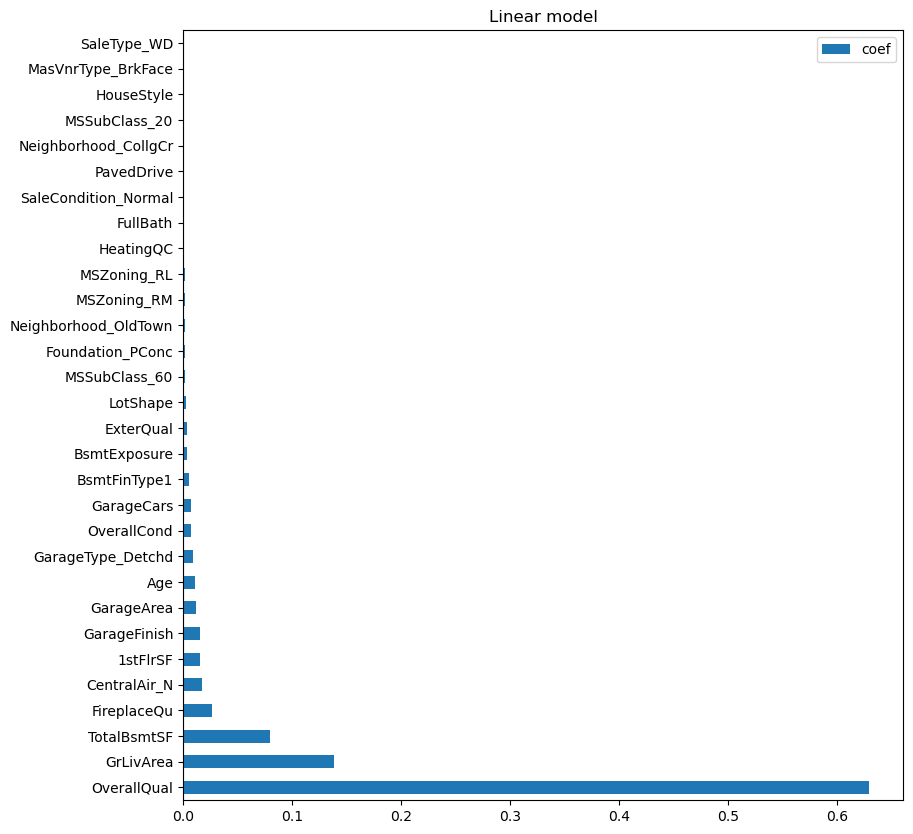

In [334]:
# top30 most important features
(df_feature_importance
 .sort_values("coef", key=lambda v: abs(v), ascending=False)
 .head(30)
 .plot(kind="barh", figsize=(12, 10))
)
plt.title("Linear model")
plt.axvline(x=0, color='.6')
plt.subplots_adjust(left=.3);

# EXTRA TREE

In [385]:
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OrdinalEncoder

ord_categories =list(labels.values())
numerical_features = X.select_dtypes(include = 'number').columns
numeric_transformer = Pipeline(steps=[("imputer", SimpleImputer(strategy="median")),
                                      ("scaler", StandardScaler())]
                              )

nominal_transformer = Pipeline(steps = [("imputer2",SimpleImputer(strategy="constant", fill_value="missing")),
                                         ("OHE",OneHotEncoder(handle_unknown="ignore"))]
                                       )
ordinal_transformer = Pipeline(steps = [("imputer3",SimpleImputer(strategy="constant")),
                                          ("OE", OrdinalEncoder(categories = ord_categories, handle_unknown='error'))]
                                       )

categorical_pipeline = Pipeline([
    ("imputer", SimpleImputer(strategy="most_frequent")),
    ("encoder", OneHotEncoder(sparse=True, handle_unknown="ignore"))
])

preprocessor = ColumnTransformer(
    transformers=[
        ("num", numeric_transformer, numerical_features),
        ("cat_nom", nominal_transformer, nom_X.columns),
        ("cat_ord", ordinal_transformer, ord_X.columns),
    ]
)

# Now we have a full prediction pipeline.
reg = Pipeline(
    steps=[("preprocessor", preprocessor),("regressor", ExtraTreesRegressor())]
)
reg

Pipeline(memory=None,
         steps=[('preprocessor',
                 ColumnTransformer(n_jobs=None, remainder='drop',
                                   sparse_threshold=0.3,
                                   transformer_weights=None,
                                   transformers=[('num',
                                                  Pipeline(memory=None,
                                                           steps=[('imputer',
                                                                   SimpleImputer(add_indicator=False,
                                                                                 copy=True,
                                                                                 fill_value=None,
                                                                                 keep_empty_features=False,
                                                                                 missing_values=nan,
                                                                                 strategy='median',
                                                                                 verbose='deprecated')),
                                                                  ('scale...
                ('regressor',
                 ExtraTreesRegressor(bootstrap=False, ccp_alpha=0.0,
                                     criterion='squared_error', max_depth=None,
                                     max_features=1.0, max_leaf_nodes=None,
                                     max_samples=None,
                                     min_impurity_decrease=0.0,
                                     min_samples_leaf=1, min_samples_split=2,
                                     min_weight_fraction_leaf=0.0,
                                     n_estimators=100, n_jobs=None,
                                     oob_score=False, random_state=None,
                                     verbose=0, warm_start=False))],
         verbose=False)

## Fitting

In [386]:
X_train, X_test, y_train, y_test = train_test_split(X, log_Y, test_size=0.25, random_state=23)

In [387]:
reg.fit(X_train, y_train)

Pipeline(memory=None,
         steps=[('preprocessor',
                 ColumnTransformer(n_jobs=None, remainder='drop',
                                   sparse_threshold=0.3,
                                   transformer_weights=None,
                                   transformers=[('num',
                                                  Pipeline(memory=None,
                                                           steps=[('imputer',
                                                                   SimpleImputer(add_indicator=False,
                                                                                 copy=True,
                                                                                 fill_value=None,
                                                                                 keep_empty_features=False,
                                                                                 missing_values=nan,
                                                                                 strategy='median',
                                                                                 verbose='deprecated')),
                                                                  ('scale...
                ('regressor',
                 ExtraTreesRegressor(bootstrap=False, ccp_alpha=0.0,
                                     criterion='squared_error', max_depth=None,
                                     max_features=1.0, max_leaf_nodes=None,
                                     max_samples=None,
                                     min_impurity_decrease=0.0,
                                     min_samples_leaf=1, min_samples_split=2,
                                     min_weight_fraction_leaf=0.0,
                                     n_estimators=100, n_jobs=None,
                                     oob_score=False, random_state=None,
                                     verbose=0, warm_start=False))],
         verbose=False)

## Model evaluation

In [388]:
# sklearn regression module
y_test_pred = reg.predict(X_test)
y_train_pred = reg.predict(X_train)

In [341]:
def get_performances(real_value, estimated_value, metrics):
    perfs = []
    for metric_func in metrics:
        perfs.append((metric_func.__name__, metric_func(real_value, estimated_value)))
    return pd.DataFrame(perfs, columns=["metric", "value"])


def get_all_performances(value_train, values_test, metrics):
    test_perfs = []
    train_perfs = []
    metric_names = []
    for metric_func in metrics:
        metric_name = metric_func.__name__
        metric_names.append(metric_name)
        train_perfs.append(metric_func(*value_train))
        test_perfs.append(metric_func(*values_test))
    perfs = {"metric": metric_names, "train": train_perfs, "test": test_perfs,}
    return pd.DataFrame(perfs)
def RMSE(predictions, targets):
    return np.sqrt(np.mean((predictions - targets) ** 2))

In [342]:
METRICS = [r2_score,
           mean_squared_error,
           RMSE,
           mean_absolute_percentage_error,
           max_error,
          ]
# get performance on single set
get_performances(real_value=y_test, estimated_value=y_test_pred, metrics=METRICS)

,metric,value
0,r2_score,0.860966
1,mean_squared_error,0.021571
2,RMSE,0.146871
3,mean_absolute_percentage_error,0.008616
4,max_error,0.705056


In [343]:
# get performances in train & test
perf_extratree = get_all_performances(value_train=(y_train, y_train_pred),
                     values_test=(y_test, y_test_pred),
                     metrics=METRICS
                    )
RMSE_extratree = perf_extratree.iloc[2, 2]
print(RMSE_extratree)
perf_extratree

0.14687109835330348


,metric,train,test
0,r2_score,1.000000e+00,0.860966
1,mean_squared_error,2.074668e-28,0.021571
2,RMSE,1.440371e-14,0.146871
3,mean_absolute_percentage_error,9.602522e-16,0.008616
4,max_error,3.375078e-14,0.705056


## Model validation

In [344]:
# Check for Multicollinearity
# Variance Inflation Factor (VIF)
R_square_test = mean_squared_error(y_test, y_test_pred, squared=True)
VIF = 1/(1- R_square_test)
VIF

1.0220466913458002

## Parameters tuning

In [389]:

param_grid = {
    "preprocessor__num__imputer__strategy": ["mean", "median"],
    "preprocessor__cat_nom__imputer2__strategy": ["most_frequent", "constant"],
    "preprocessor__cat_ord__imputer3__strategy": ["most_frequent", "constant"],
    "regressor__max_depth" : [3,5,7,9],
    "regressor__min_samples_leaf":[2,5,6,7,10],
}

grid_search = GridSearchCV(reg, param_grid, cv=10, scoring="neg_root_mean_squared_error", return_train_score=True) # r2
# you can see the list of key for scoring: sorted(sklearn.metrics.SCORERS.keys())
grid_search

GridSearchCV(cv=10, error_score=nan,
             estimator=Pipeline(memory=None,
                                steps=[('preprocessor',
                                        ColumnTransformer(n_jobs=None,
                                                          remainder='drop',
                                                          sparse_threshold=0.3,
                                                          transformer_weights=None,
                                                          transformers=[('num',
                                                                         Pipeline(memory=None,
                                                                                  steps=[('imputer',
                                                                                          SimpleImputer(add_indicator=False,
                                                                                                        copy=True,
                                                                                                        fill_value=None,
                                                                                                        keep_empty_features=False,
                                                                                                        missing_values=nan,
                                                                                                        str...
             param_grid={'preprocessor__cat_nom__imputer2__strategy': ['most_frequent',
                                                                       'constant'],
                         'preprocessor__cat_ord__imputer3__strategy': ['most_frequent',
                                                                       'constant'],
                         'preprocessor__num__imputer__strategy': ['mean',
                                                                  'median'],
                         'regressor__max_depth': [3, 5, 7, 9],
                         'regressor__min_samples_leaf': [2, 5, 6, 7, 10]},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
             scoring='neg_root_mean_squared_error', verbose=0)

In [390]:
grid_search.fit(X_train, y_train)

GridSearchCV(cv=10, error_score=nan,
             estimator=Pipeline(memory=None,
                                steps=[('preprocessor',
                                        ColumnTransformer(n_jobs=None,
                                                          remainder='drop',
                                                          sparse_threshold=0.3,
                                                          transformer_weights=None,
                                                          transformers=[('num',
                                                                         Pipeline(memory=None,
                                                                                  steps=[('imputer',
                                                                                          SimpleImputer(add_indicator=False,
                                                                                                        copy=True,
                                                                                                        fill_value=None,
                                                                                                        keep_empty_features=False,
                                                                                                        missing_values=nan,
                                                                                                        str...
             param_grid={'preprocessor__cat_nom__imputer2__strategy': ['most_frequent',
                                                                       'constant'],
                         'preprocessor__cat_ord__imputer3__strategy': ['most_frequent',
                                                                       'constant'],
                         'preprocessor__num__imputer__strategy': ['mean',
                                                                  'median'],
                         'regressor__max_depth': [3, 5, 7, 9],
                         'regressor__min_samples_leaf': [2, 5, 6, 7, 10]},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
             scoring='neg_root_mean_squared_error', verbose=0)

In [391]:
best_params = grid_search.best_params_
print(f"Best params: {best_params}")

Best params: {'preprocessor__cat_nom__imputer2__strategy': 'most_frequent', 'preprocessor__cat_ord__imputer3__strategy': 'most_frequent', 'preprocessor__num__imputer__strategy': 'mean', 'regressor__max_depth': 9, 'regressor__min_samples_leaf': 2}


In [392]:
grid_cv_results = grid_search.cv_results_
for group in ["train", "test"]:
    mean_score = round(100 * grid_cv_results[f'mean_{group}_score'].mean(), 2)
    mean_std_score = round(grid_cv_results[f'std_{group}_score'].mean(), 2)
    print(f"{group}====================\nMean score (std): {mean_score} ({mean_std_score})\n")

train====================
Mean score (std): -13.26 (0.0)

test====================
Mean score (std): -16.8 (0.02)



In [393]:
print(f"Internal CV score: {grid_search.best_score_: .3f}")

Internal CV score: -0.147


In [394]:
cv_results = pd.DataFrame(grid_cv_results)
cv_results = cv_results.sort_values("mean_test_score", ascending=False)
cv_results[["mean_train_score", "std_train_score",
            "mean_test_score", "std_test_score",
            "mean_fit_time", "std_fit_time",
            "mean_score_time", "std_score_time"
           ]]

,mean_train_score,std_train_score,mean_test_score,std_test_score,mean_fit_time,std_fit_time,mean_score_time,std_score_time
15,-0.056802,0.000746,-0.147327,0.019541,2.387297,0.030707,0.045399,0.008217
95,-0.056995,0.000841,-0.147418,0.020100,2.465108,0.017709,0.050229,0.002586
155,-0.057229,0.000807,-0.147678,0.019295,2.395592,0.088495,0.046736,0.006910
35,-0.057159,0.000847,-0.147961,0.019184,2.461721,0.007538,0.050438,0.003047
135,-0.057220,0.000918,-0.148038,0.021531,2.469461,0.015463,0.049760,0.003675
...,...,...,...,...,...,...,...,...
82,-0.189729,0.002349,-0.197281,0.018503,1.073478,0.008309,0.047963,0.002726
104,-0.189633,0.002341,-0.197283,0.018462,1.066236,0.030454,0.048926,0.002965
83,-0.189109,0.002105,-0.197291,0.017343,1.035917,0.067196,0.040254,0.007633
141,-0.189081,0.001896,-0.197355,0.019561,1.059862,0.012425,0.047868,0.004972


### COMPARAISONS DES PERFORMANCES

In [395]:
regb = grid_search.best_estimator_
regb.fit(X_train, y_train)
y_test_predg = regb.predict(X_test)
y_train_predg = regb.predict(X_train)

In [396]:
# get performance 
perf = get_all_performances(value_train=(y_train, y_train_predg),
                     values_test=(y_test, y_test_predg),
                     metrics=METRICS
                    )
perf

,metric,train,test
0,r2_score,0.978311,0.860973
1,mean_squared_error,0.003488,0.021570
2,RMSE,0.059062,0.146867
3,mean_absolute_percentage_error,0.003665,0.008651
4,max_error,0.438562,0.707292


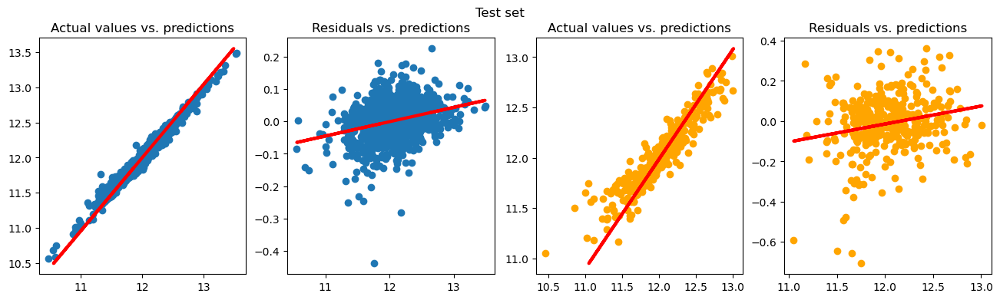

In [397]:
courbe(y_train, y_test, y_test_predg,y_train_predg)

In [400]:
# get performances in train & test
perf_extratree

,metric,train,test
0,r2_score,1.000000e+00,0.860966
1,mean_squared_error,2.074668e-28,0.021571
2,RMSE,1.440371e-14,0.146871
3,mean_absolute_percentage_error,9.602522e-16,0.008616
4,max_error,3.375078e-14,0.705056


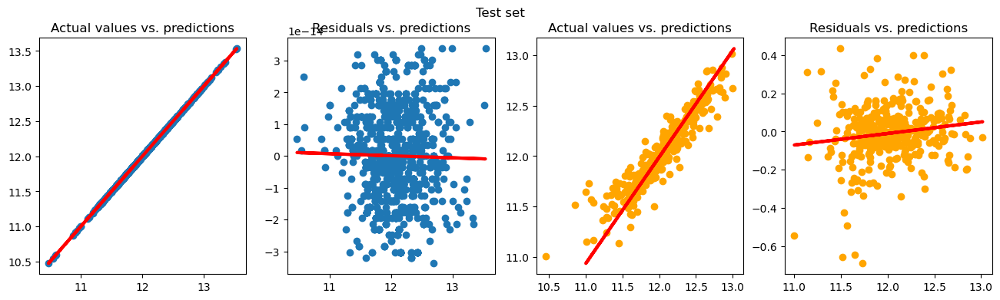

In [401]:
courbe(y_train, y_test, y_test_pred,y_train_pred)

In [402]:
reg_estimator = reg["regressor"]

## CROSS VALIDATION

In [403]:
#cross validation only
cv_results = cross_validate(regb,
                            X_train, y_train,
                            cv=5,
                            scoring=('r2', 'neg_mean_squared_error'),
                            return_train_score=True)
pd.DataFrame(cv_results)

,fit_time,score_time,test_r2,train_r2,test_neg_mean_squared_error,train_neg_mean_squared_error
0,1.269222,0.051367,0.890688,0.981713,-0.017270,-0.002932
1,1.572838,0.030997,0.850593,0.979968,-0.024604,-0.003202
2,1.347791,0.051954,0.859272,0.981446,-0.023853,-0.002928
3,2.239373,0.067093,0.828624,0.981585,-0.023480,-0.003071
4,1.588845,0.064174,0.853946,0.981327,-0.024569,-0.002969


In [408]:
mean_RMSE_extratree =-cv_results['test_neg_mean_squared_error'].mean()
mean_RMSE_extratree=np.sqrt(mean_RMSE_decisiontree)
mean_RMSE_extratree

0.1508475279186136

In [409]:
#cross validation only
cv_results2 = cross_validate(reg,
                            X_train, y_train,
                            cv=5,
                            scoring=('r2', 'neg_mean_squared_error'),
                            return_train_score=True)
pd.DataFrame(cv_results2)

,fit_time,score_time,test_r2,train_r2,test_neg_mean_squared_error,train_neg_mean_squared_error
0,3.333690,0.033855,0.900487,1.0,-0.015722,-2.083673e-28
1,2.850917,0.025905,0.853429,1.0,-0.024137,-2.125386e-28
2,3.090673,0.062950,0.858205,1.0,-0.024034,-2.068076e-28
3,2.917848,0.045675,0.853061,1.0,-0.020132,-2.053740e-28
4,3.202974,0.071282,0.861873,1.0,-0.023235,-2.042465e-28


In [406]:
mean_RMSE_extratree =-cv_results2['test_neg_mean_squared_error'].mean()
mean_RMSE_extratree=np.sqrt(mean_RMSE_decisiontree)
mean_RMSE_extratree

0.14607381282722842

## FEATURE IMPORTANCE

In [414]:
def get_input_features(model_pipeline, cat_step_name):
    """ Get model feature names used in training
    
    """

    all_feature_names = []

    for step_name, pipe_trans, feat_names in reg["preprocessor"].transformers_:
        if step_name == cat_step_name:
            all_feature_names.extend(pipe_trans
                                 .named_steps["OHE"]
                                 .get_feature_names_out(input_features=nom_X.columns)
                                )
        if step_name == 'num' or step_name == 'cat_ord':
            all_feature_names.extend(feat_names)
    return all_feature_names

In [415]:
new_cols_nom = reg.named_steps["preprocessor"].named_transformers_["cat_nom"].named_steps["OHE"].get_feature_names_out(nom_X.columns)
cols_ord = ord_X.columns
all_cols = np.concatenate([numerical_features,cols_ord,new_cols_nom])
all_cols

array(['LotFrontage', 'LotArea', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2',
       'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea',
       'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath',
       'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces',
       'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF',
       'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal',
       'PartBsmtUnfSF', 'Age', 'Age_GarageYrBlt', 'LandContour',
       'Utilities', 'LandSlope', 'LotShape', 'HouseStyle', 'OverallQual',
       'OverallCond', 'ExterQual', 'ExterCond', 'BsmtQual', 'BsmtCond',
       'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'HeatingQC',
       'KitchenQual', 'Functional', 'FireplaceQu', 'GarageQual',
       'GarageFinish', 'GarageCond', 'PavedDrive', 'PoolQC', 'Fence',
       'MSSubClass_20', 'MSSubClass_30', 'MSSubClass_40', 'MSSubClass_45',
       'MSSubClass_50', 'MSSubClass_60', 'MSSubClass_70', 'MSSubClass_75',
       'MSSubCl

In [416]:
# model_features = all_cols[mask]
model_features = all_cols
model_features

array(['LotFrontage', 'LotArea', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2',
       'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea',
       'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath',
       'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces',
       'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF',
       'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal',
       'PartBsmtUnfSF', 'Age', 'Age_GarageYrBlt', 'LandContour',
       'Utilities', 'LandSlope', 'LotShape', 'HouseStyle', 'OverallQual',
       'OverallCond', 'ExterQual', 'ExterCond', 'BsmtQual', 'BsmtCond',
       'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'HeatingQC',
       'KitchenQual', 'Functional', 'FireplaceQu', 'GarageQual',
       'GarageFinish', 'GarageCond', 'PavedDrive', 'PoolQC', 'Fence',
       'MSSubClass_20', 'MSSubClass_30', 'MSSubClass_40', 'MSSubClass_45',
       'MSSubClass_50', 'MSSubClass_60', 'MSSubClass_70', 'MSSubClass_75',
       'MSSubCl

In [417]:
reg_estimator = reg.named_steps["regressor"]

In [418]:
model_features = get_input_features(model_pipeline=reg, cat_step_name="cat_nom")
model_features

['LotFrontage',
 'LotArea',
 'MasVnrArea',
 'BsmtFinSF1',
 'BsmtFinSF2',
 'TotalBsmtSF',
 '1stFlrSF',
 '2ndFlrSF',
 'LowQualFinSF',
 'GrLivArea',
 'BsmtFullBath',
 'BsmtHalfBath',
 'FullBath',
 'HalfBath',
 'BedroomAbvGr',
 'KitchenAbvGr',
 'TotRmsAbvGrd',
 'Fireplaces',
 'GarageCars',
 'GarageArea',
 'WoodDeckSF',
 'OpenPorchSF',
 'EnclosedPorch',
 '3SsnPorch',
 'ScreenPorch',
 'PoolArea',
 'MiscVal',
 'PartBsmtUnfSF',
 'Age',
 'Age_GarageYrBlt',
 'MSSubClass_20',
 'MSSubClass_30',
 'MSSubClass_40',
 'MSSubClass_45',
 'MSSubClass_50',
 'MSSubClass_60',
 'MSSubClass_70',
 'MSSubClass_75',
 'MSSubClass_80',
 'MSSubClass_85',
 'MSSubClass_90',
 'MSSubClass_120',
 'MSSubClass_160',
 'MSSubClass_180',
 'MSSubClass_190',
 'MSZoning_C (all)',
 'MSZoning_FV',
 'MSZoning_RH',
 'MSZoning_RL',
 'MSZoning_RM',
 'Street_Grvl',
 'Street_Pave',
 'Alley_Grvl',
 'Alley_No alley access',
 'Alley_Pave',
 'LotConfig_Corner',
 'LotConfig_CulDSac',
 'LotConfig_FR2',
 'LotConfig_FR3',
 'LotConfig_Inside',
 

In [419]:
model_features = get_input_features(model_pipeline=reg, cat_step_name="cat_nom")
model_features

['LotFrontage',
 'LotArea',
 'MasVnrArea',
 'BsmtFinSF1',
 'BsmtFinSF2',
 'TotalBsmtSF',
 '1stFlrSF',
 '2ndFlrSF',
 'LowQualFinSF',
 'GrLivArea',
 'BsmtFullBath',
 'BsmtHalfBath',
 'FullBath',
 'HalfBath',
 'BedroomAbvGr',
 'KitchenAbvGr',
 'TotRmsAbvGrd',
 'Fireplaces',
 'GarageCars',
 'GarageArea',
 'WoodDeckSF',
 'OpenPorchSF',
 'EnclosedPorch',
 '3SsnPorch',
 'ScreenPorch',
 'PoolArea',
 'MiscVal',
 'PartBsmtUnfSF',
 'Age',
 'Age_GarageYrBlt',
 'MSSubClass_20',
 'MSSubClass_30',
 'MSSubClass_40',
 'MSSubClass_45',
 'MSSubClass_50',
 'MSSubClass_60',
 'MSSubClass_70',
 'MSSubClass_75',
 'MSSubClass_80',
 'MSSubClass_85',
 'MSSubClass_90',
 'MSSubClass_120',
 'MSSubClass_160',
 'MSSubClass_180',
 'MSSubClass_190',
 'MSZoning_C (all)',
 'MSZoning_FV',
 'MSZoning_RH',
 'MSZoning_RL',
 'MSZoning_RM',
 'Street_Grvl',
 'Street_Pave',
 'Alley_Grvl',
 'Alley_No alley access',
 'Alley_Pave',
 'LotConfig_Corner',
 'LotConfig_CulDSac',
 'LotConfig_FR2',
 'LotConfig_FR3',
 'LotConfig_Inside',
 

In [420]:
df_feature_importance = pd.DataFrame(reg_estimator.feature_importances_, columns=["coef"], index=model_features)
print(f"Shape: {df_feature_importance.shape}")
df_feature_importance.head()

Shape: (233, 1)


,coef
LotFrontage,0.002602
LotArea,0.004522
MasVnrArea,0.001954
BsmtFinSF1,0.008303
BsmtFinSF2,0.000477


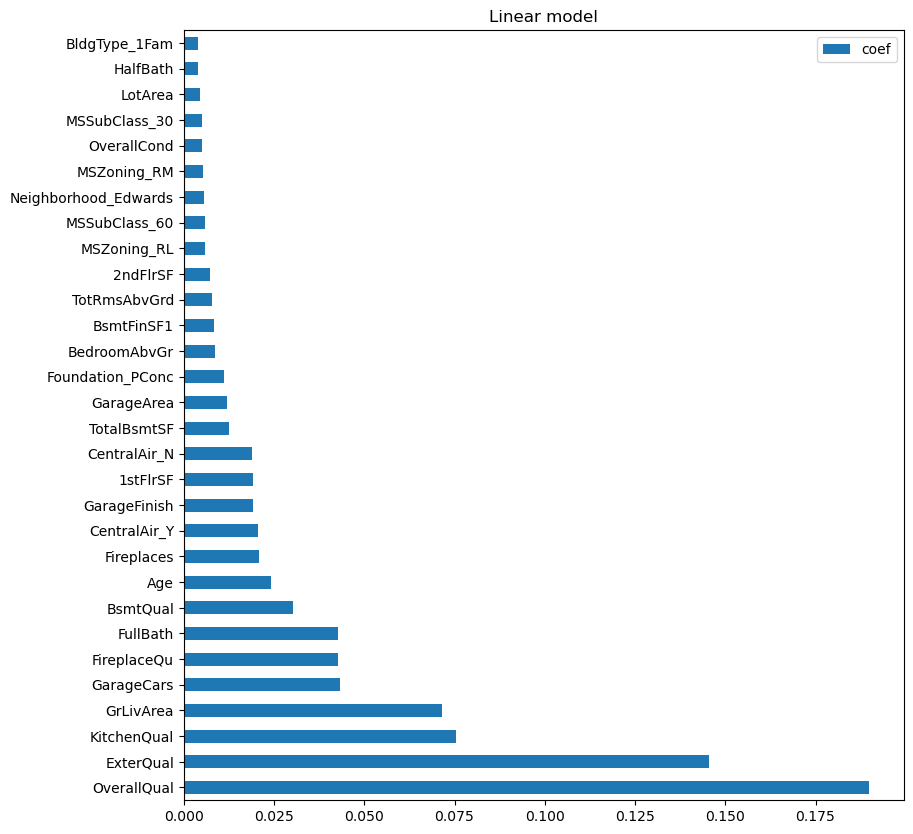

In [421]:
# top30 most important features
(df_feature_importance
 .sort_values("coef", key=lambda v: abs(v), ascending=False)
 .head(30)
 .plot(kind="barh", figsize=(12, 10))
)
plt.title("Linear model")
plt.axvline(x=0, color='.6')
plt.subplots_adjust(left=.3);

# COMPARAISON DES MODELES

In [422]:
model = {'Model': ['Modele linéaire', 'Regression Lasso', 'Régression Ridge', 'Decision Tree','Extra tree'],
        'RMSE': [RMSE_lin,RMSE_lasso,RMSE_ridge,RMSE_decisiontree,RMSE_extratree],
        }
model = pd.DataFrame(model)
model

,Model,RMSE
0,Modele linéaire,0.136384
1,Regression Lasso,0.141297
2,Régression Ridge,0.131896
3,Decision Tree,0.188617
4,Extra tree,0.146871


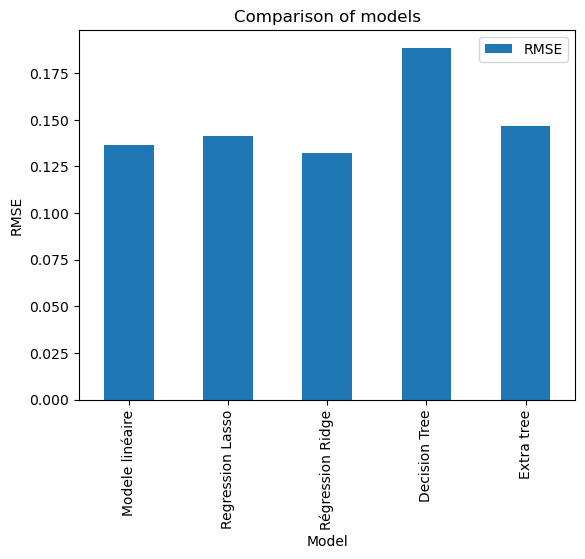

In [423]:
model.plot(kind='bar', x='Model', y='RMSE')
plt.xlabel('Model')
plt.ylabel('RMSE')
plt.title('Comparison of models')
plt.show()